In [189]:
#READING DATA FROM TEXT FILES AND GENERATING FIRST DATAFRAME


#This is important, there was a bug in the image J plugin, total area stained with marker was measured in pixels!
#which was then being divided by the cell area measured in micrometers, which was a problem
#the total cellular area/vol stained by markers needs to be multiplied by 0.0289, which is the squared pixel size
corr_fc = 0.0289

import pandas as pd
#reads tsv file, finds cells
subject_headers = ['group','subject','# I', 'LD#I', 'area I', 'LDfract I', 'LDvol_I','LDdist I', 
                   'PLIN5fract I', 'PLIN5vol I','PLIN5dist I', 
                   'COLfract I', 'COLvol I','COLdist I', 
                   'FREEfract I', 'FREEvol_I','FREEdist I', 
                   '# II', 'LD#II', 'area II', 'LDfract II', 'LDvol_II','LDdist II', 
                   'PLIN5fract II', 'PLIN5vol II','PLIN5dist II', 
                   'COLfract II', 'COLvol II','COLdist II', 
                   'FREEfract II', 'FREEvol_II','FREEdist II']

#print(subject_headers)
particle_headers = ['Group', 'subject', 'C#','CType','P#','PType','PSize','PDist'] 
subject_table = pd.DataFrame([], columns=subject_headers)
particle_table = pd.DataFrame([], columns=particle_headers)

#filename = r'\\fileservices.ad.jyu.fi\homes\varufach\Desktop\research\Diabetic_study_for_TOPOCELL\data_for_MATLAB\1_ImageJ_TSVs\deconv\control\Controls_01.tsv'
directory = r'D:\VASCO\Diabetic_study_for_TOPOCELL\tsv_data_fpr_python\all_together_new'
#directory = r'C:\Users\Vasco\Desktop\temp_diabetic\testing'
import os
for filename in os.listdir(directory):
    with open(os.path.join(directory, filename), 'r') as f:

        cur_part_table = pd.DataFrame([], columns=particle_headers)

        data = f.read()
        group = data.split('\n')[0].split()[1]
        subject = data.split('\n')[1].split()[1]
        
        print(group,subject)
        
        C_slow_count, C_fast_count = 0, 0
        C_slow_area, C_fast_area = 0, 0
        
        C_slowLDvol, C_fastLDvol = 0, 0
        C_slowPLIN5vol, C_fastPLIN5vol = 0, 0
        C_slowCOLvol, C_fastCOLvol = 0, 0
        C_slowFREEvol, C_fastFREEvol = 0, 0

        P_slowLDcount, P_fastLDcount = 0, 0
        P_slowPLIN5count, P_fastPLIN5count = 0, 0
        P_slowCOLcount, P_fastCOLcount = 0, 0
        P_slowFREEcount, P_fastFREEcount = 0, 0
        
        P_slowLDdist, P_fastLDdist = 0, 0
        P_slowPLIN5dist, P_fastPLIN5dist = 0, 0
        P_slowCOLdist, P_fastCOLdist = 0, 0
        P_slowFREEdist, P_fastFREEdist = 0, 0

        curr_type = 0
        for line in data.split('\n')[:-1]:
            if line[0] == '#':
                line = line.split()
                cell_ID = line[0][1:]
                cell_area = float(line[1])
                cell_myosin = float(line[5])
                threshold = 500
                if cell_myosin/cell_area > threshold:
                    curr_type = 2
                    C_fast_count += 1
                    C_fast_area += cell_area
                    C_fastLDvol += float(line[8])
                    C_fastPLIN5vol += float(line[10])
                    C_fastCOLvol += float(line[12])
                    C_fastFREEvol += float(line[14])
                else:
                    curr_type = 1
                    C_slow_count += 1
                    C_slow_area += cell_area
                    C_slowLDvol += float(line[8])
                    C_slowPLIN5vol += float(line[10])
                    C_slowCOLvol += float(line[12])
                    C_slowFREEvol += float(line[14])

            elif line[0].isnumeric():
                line = line.split()
                if line[1] == "A": continue
                if line[1] == "B": 
                    Ptype = "LD"
                    if curr_type == 2: P_fastLDcount += 1
                    else: P_slowLDcount += 1
                    
                if line[1] == "C": Ptype = "PLIN5"
                if line[1] == "D": Ptype = "COLOC"
                if line[1] == "E": Ptype = "FREE"
                #print(line[1])
                #print(Ptype)
                cur_part_table = cur_part_table.append(pd.DataFrame([[group,subject,cell_ID,curr_type,line[0],Ptype,float(line[7]),float(line[6])]], columns=particle_headers))
            else: print('reading headers')

        areaI, areaII = C_slow_area/C_slow_count, C_fast_area/C_fast_count
        LDfractI, LDfractII = (C_slowLDvol*corr_fc)/C_slow_area, (C_fastLDvol*corr_fc)/C_fast_area
        LDvolI, LDvolII = cur_part_table[(cur_part_table['PType'] == 'LD') & (cur_part_table['CType'] == 1)]['PSize'].mean(), cur_part_table[(cur_part_table['PType'] == 'LD') & (cur_part_table['CType'] == 2)]['PSize'].mean()
        LDdistI, LDdistII = cur_part_table[(cur_part_table['PType'] == 'LD') & (cur_part_table['CType'] == 1)]['PDist'].mean(), cur_part_table[(cur_part_table['PType'] == 'LD') & (cur_part_table['CType'] == 2)]['PDist'].mean()
        
        PLIN5fractI, PLIN5fractII = (C_slowPLIN5vol*corr_fc)/C_slow_area, (C_fastPLIN5vol*corr_fc)/C_fast_area
        PLIN5volI, PLIN5volII = cur_part_table[(cur_part_table['PType'] == 'PLIN5') & (cur_part_table['CType'] == 1)]['PSize'].mean(), cur_part_table[(cur_part_table['PType'] == 'PLIN5') & (cur_part_table['CType'] == 2)]['PSize'].mean()
        PLIN5distI, PLIN5distII = cur_part_table[(cur_part_table['PType'] == 'PLIN5') & (cur_part_table['CType'] == 1)]['PDist'].mean(), cur_part_table[(cur_part_table['PType'] == 'PLIN5') & (cur_part_table['CType'] == 2)]['PDist'].mean()
        
        COLfractI, COLfractII = (C_slowCOLvol*corr_fc)/C_slow_area, (C_fastCOLvol*corr_fc)/C_fast_area
        COLvolI, COLvolII = cur_part_table[(cur_part_table['PType'] == 'COLOC') & (cur_part_table['CType'] == 1)]['PSize'].mean(), cur_part_table[(cur_part_table['PType'] == 'COLOC') & (cur_part_table['CType'] == 2)]['PSize'].mean()
        COLdistI, COLdistII = cur_part_table[(cur_part_table['PType'] == 'COLOC') & (cur_part_table['CType'] == 1)]['PDist'].mean(), cur_part_table[(cur_part_table['PType'] == 'COLOC') & (cur_part_table['CType'] == 2)]['PDist'].mean()       
        
        FREEfractI, FREEfractII = (C_slowFREEvol*corr_fc)/C_slow_area, (C_fastFREEvol*corr_fc)/C_fast_area
        FREEvolI, FREEvolII = cur_part_table[(cur_part_table['PType'] == 'FREE') & (cur_part_table['CType'] == 1)]['PSize'].mean(), cur_part_table[(cur_part_table['PType'] == 'FREE') & (cur_part_table['CType'] == 2)]['PSize'].mean()
        FREEdistI, FREEdistII = cur_part_table[(cur_part_table['PType'] == 'FREE') & (cur_part_table['CType'] == 1)]['PDist'].mean(), cur_part_table[(cur_part_table['PType'] == 'FREE') & (cur_part_table['CType'] == 2)]['PDist'].mean()
        
        cur_part_table.index = range(1,len(cur_part_table)+1)
        cur_subj_table = pd.DataFrame([[group, subject, C_slow_count, P_slowLDcount, areaI, LDfractI, LDvolI, LDdistI, PLIN5fractI, PLIN5volI, PLIN5distI, COLfractI, COLvolI, COLdistI, FREEfractI, FREEvolI, FREEdistI, C_fast_count, P_fastLDcount, areaII, LDfractII, LDvolII, LDdistII, PLIN5fractII, PLIN5volII, PLIN5distII, COLfractII, COLvolII, COLdistII, FREEfractII, FREEvolII, FREEdistII]], columns=subject_headers)

    print('Subject number {1} from the {0} group'.format(group, subject))         
    print('has a total number of cells of ', C_slow_count + C_fast_count)
    print('from which {} are of type I and {} are of type II'.format(C_slow_count, C_fast_count))
    pd.set_option('display.max_rows', None)
    pd.set_option('display.max_columns', None)
    pd.set_option('display.width', None)
    pd.set_option('display.max_colwidth', -1)
    subject_table = subject_table.append(cur_subj_table)
    particle_table = particle_table.append(cur_part_table)
    subject_table


Controls 01
reading headers
reading headers
reading headers
Subject number 01 from the Controls group
has a total number of cells of  19
from which 11 are of type I and 8 are of type II
Controls 03
reading headers
reading headers
reading headers


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:122: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.


Subject number 03 from the Controls group
has a total number of cells of  24
from which 15 are of type I and 9 are of type II
Controls 04
reading headers
reading headers
reading headers
Subject number 04 from the Controls group
has a total number of cells of  115
from which 59 are of type I and 56 are of type II
Controls 06
reading headers
reading headers
reading headers
Subject number 06 from the Controls group
has a total number of cells of  97
from which 46 are of type I and 51 are of type II
Controls 07
reading headers
reading headers
reading headers
Subject number 07 from the Controls group
has a total number of cells of  78
from which 36 are of type I and 42 are of type II
Controls 08
reading headers
reading headers
reading headers
Subject number 08 from the Controls group
has a total number of cells of  119
from which 68 are of type I and 51 are of type II
Controls 09
reading headers
reading headers
reading headers
Subject number 09 from the Controls group
has a total number of 

In [190]:
import math
subject_table
print(particle_table[(particle_table['Group']=='Diabetic')&(particle_table['C#']=='0')&(particle_table['PType']=='LD')])

print('break \n')
particle_table['PSize'] = particle_table['PSize'].apply(lambda x: 2*math.sqrt(x/math.pi))

#type(cur_part_table)
print(particle_table[(particle_table['Group']=='Diabetic')&(particle_table['C#']=='0')&(particle_table['PType']=='LD')])
#particle_table.head()

        Group subject C# CType    P# PType  PSize   PDist
1    Diabetic  01      0  2     674   LD    0.029  0.000 
2    Diabetic  01      0  2     675   LD    0.029  0.170 
3    Diabetic  01      0  2     676   LD    0.029  0.170 
4    Diabetic  01      0  2     677   LD    0.116  0.991 
5    Diabetic  01      0  2     678   LD    0.058  1.020 
6    Diabetic  01      0  2     679   LD    0.029  0.340 
7    Diabetic  01      0  2     680   LD    0.636  0.613 
8    Diabetic  01      0  2     681   LD    0.058  0.170 
9    Diabetic  01      0  2     682   LD    0.116  0.170 
10   Diabetic  01      0  2     683   LD    0.029  0.380 
11   Diabetic  01      0  2     684   LD    0.116  0.340 
12   Diabetic  01      0  2     685   LD    0.058  0.991 
13   Diabetic  01      0  2     686   LD    0.029  0.991 
14   Diabetic  01      0  2     687   LD    0.231  0.170 
15   Diabetic  01      0  2     688   LD    0.116  1.674 
16   Diabetic  01      0  2     689   LD    0.318  0.170 
17   Diabetic 

        Group subject C# CType    P# PType     PSize   PDist
1    Diabetic  01      0  2     674   LD    0.192156  0.000 
2    Diabetic  01      0  2     675   LD    0.192156  0.170 
3    Diabetic  01      0  2     676   LD    0.192156  0.170 
4    Diabetic  01      0  2     677   LD    0.384312  0.991 
5    Diabetic  01      0  2     678   LD    0.271750  1.020 
6    Diabetic  01      0  2     679   LD    0.192156  0.340 
7    Diabetic  01      0  2     680   LD    0.899878  0.613 
8    Diabetic  01      0  2     681   LD    0.271750  0.170 
9    Diabetic  01      0  2     682   LD    0.384312  0.170 
10   Diabetic  01      0  2     683   LD    0.192156  0.380 
11   Diabetic  01      0  2     684   LD    0.384312  0.340 
12   Diabetic  01      0  2     685   LD    0.271750  0.991 
13   Diabetic  01      0  2     686   LD    0.192156  0.991 
14   Diabetic  01      0  2     687   LD    0.542327  0.170 
15   Diabetic  01      0  2     688   LD    0.384312  1.674 
16   Diabetic  01      0

In [191]:
#HERE WE IMPORT BACKGROUND DATA AND Redefine categories
bk_data = pd.read_excel(r'D:\VASCO\Diabetic_study_for_TOPOCELL\tsv_data_fpr_python\background_data_table.xlsx', header=[1]) 
bk_data_ready = bk_data.copy()
#bk_data['%'].iloc[0]

group_col = []
subject_col = []
for i, c in enumerate(bk_data['subject']):
    subject = c[-2:]
    if 'DM' in c:
        group = 'Diabetic'
    elif 'OW' in c:
        group = 'Obese'
    else:
        group = 'Controls'
    
    group_col.append(group)
    subject_col.append(subject)

bk_data_ready['group'] = group_col  
bk_data_ready['subject'] = subject_col  
bk_data_ready


#NOW MERGE IT IN DATAFRAME
merged_ready = pd.merge(bk_data_ready, subject_table, on=['subject', 'group'])

In [9]:
bk_data

,subject,Age,Weight,BMI,FFM,FM,FAT%,TCHOL,HDL,LDL,TAGemia,Glycemia,VO2max
0,DM01,45,160.4,41.67,101.3,59.1,0.368,5.1,1.00,2.8,4.00,11.30,17.20
1,DM03,53,91.3,30.16,67.0,24.3,0.266,6.3,1.10,3.9,3.00,6.00,34.20
2,DM05,52,92.9,30.30,71.6,21.3,0.229,4.6,1.10,2.6,2.00,6.80,29.10
3,DM06,60,115.0,37.13,84.3,30.7,0.267,3.6,1.30,2.2,1.00,5.40,21.90
4,DM07,55,139.5,43.49,83.9,50.6,0.363,3.8,1.00,2.3,1.50,6.50,16.10
5,DM08,60,102.9,31.76,74.5,28.4,0.276,3.6,0.90,1.6,2.80,6.60,23.70
6,DM09,60,89.5,29.22,64.7,24.8,0.277,4.6,1.90,2.7,1.50,6.50,21.70
7,DM10,52,112.1,31.32,78.0,34.1,0.304,8.7,0.70,NaN,8.60,19.00,17.70
8,DM12,39,112.4,33.93,82.5,29.9,0.266,3.0,1.00,1.4,1.30,5.80,24.10
9,DM14,51,104.2,31.32,72.9,31.3,0.300,4.5,1.30,2.2,1.90,6.30,24.20


In [192]:
#dealing with new headers:
new_header=[]
for c in merged_ready.columns: #The new header will be stripped from tubes or blasts labels, reduced to about half the size
    new_header.append(c.replace('I','').replace('area','Cell Area (\u03BCm^2)').replace('II','').replace(' ','').replace('_','').replace('vol',' diameter (\u03BCm)').replace('dist',' distance to sarcolemma (\u03BCm)').replace('fract',' density').replace('PLN', 'PLIN'))
    
new_header = list(dict.fromkeys(new_header))#This removes duplicates from the list above
#print(mylist)

new_header

['subject',
 'Age',
 'Weight',
 'BM',
 'FFM',
 'FM',
 'FAT%',
 'TCHOL',
 'HDL',
 'LDL',
 'TAGemia',
 'Glycemia',
 'VO2max',
 'group',
 '#',
 'LD#',
 'CellArea(μm^2)',
 'LD density',
 'LD diameter (μm)',
 'LD distance to sarcolemma (μm)',
 'PLIN5 density',
 'PLIN5 diameter (μm)',
 'PLIN5 distance to sarcolemma (μm)',
 'COL density',
 'COL diameter (μm)',
 'COL distance to sarcolemma (μm)',
 'FREE density',
 'FREE diameter (μm)',
 'FREE distance to sarcolemma (μm)']

In [193]:
table = merged_ready

categ = table.iloc[:, :14]
I_cols = [col for col in table.columns[14:] if 'II' not in col]
I_cols
I_cont = table.loc[:, I_cols] 
categ
categ['VO2max'] = categ.VO2max.str.replace(r'*','')
categ['VO2max']
#merged_ready['VO2max']

0     17.20
1     34.20
2     29.10
3     21.90
4     16.10
5     23.70
6     21.70
7     17.70
8     24.10
9     24.20
10    31.60
11    27.90
12    23.30
13    24.50
14    27.60
15    25.60
16    26.60
17    42.10
18    34.90
19    31.30
20    31.36
21    22.74
22    30.65
23    30.17
24    34.08
Name: VO2max, dtype: object

In [194]:
#Reorganize dataframe so fiber type data is in aligned postions in 2 different sub dataframes 
#Then reate a new dataframe where fiber type data is not separated in different columns, and rather categorically by rows

#The final output is a table with every image taken used as a statistical case


table = merged_ready

#first lets remove those asterisks from the VO2max column
table['VO2max'] = table.VO2max.str.replace(r'*','')
#Then make this variable a float
table['VO2max'] = table['VO2max'].astype('float')

categ = table.iloc[:, :14]
I_cols = [col for col in table.columns[14:] if 'II' not in col]
I_cont = table.loc[:, I_cols]    
I_concat = pd.concat([categ, I_cont], axis=1)


II_cols = [col for col in table.columns[14:] if 'II' in col]
II_cont = table.loc[:, II_cols]    
II_concat = pd.concat([categ, II_cont], axis=1)    


II_concat.columns = new_header
II_concat['cell type'] = ['II']*len(II_concat.index)
I_concat.columns = new_header
I_concat['cell type'] = ['I']*len(I_concat.index)

ready = pd.concat([I_concat, II_concat], ignore_index=True)


#converting particle volume to diameter:
import math
ready['LD diameter (μm)'] = ready['LD diameter (μm)'].apply(lambda x: 2*math.sqrt(x/math.pi))
ready['PLIN5 diameter (μm)'] = ready['PLIN5 diameter (μm)'].apply(lambda x: 2*math.sqrt(x/math.pi))
ready['COL diameter (μm)'] = ready['COL diameter (μm)'].apply(lambda x: 2*math.sqrt(x/math.pi))
ready['FREE diameter (μm)'] = ready['FREE diameter (μm)'].apply(lambda x: 2*math.sqrt(x/math.pi))

#converting area fraction to actual percentual value
ready['LD density'] = ready['LD density'].apply(lambda x: x*100)
ready['PLIN5 density'] = ready['PLIN5 density'].apply(lambda x: x*100)
ready['COL density'] = ready['COL density'].apply(lambda x: x*100)
ready['FREE density'] = ready['FREE density'].apply(lambda x: x*100)


In [195]:
#import platform
#print(platform.python_version())
for i in ready.columns:
    print(i, ready[i].dtype)
ready['FREE diameter (μm)'][ready['group']=='Controls']

subject object
Age int64
Weight float64
BM float64
FFM float64
FM float64
FAT% float64
TCHOL float64
HDL float64
LDL float64
TAGemia float64
Glycemia float64
VO2max float64
group object
# object
LD# object
CellArea(μm^2) float64
LD density float64
LD diameter (μm) float64
LD distance to sarcolemma (μm) float64
PLIN5 density float64
PLIN5 diameter (μm) float64
PLIN5 distance to sarcolemma (μm) float64
COL density float64
COL diameter (μm) float64
COL distance to sarcolemma (μm) float64
FREE density float64
FREE diameter (μm) float64
FREE distance to sarcolemma (μm) float64
cell type object


18    0.267178
19    0.261310
20    0.224732
21    0.221369
22    0.277183
23    0.239672
24    0.234004
43    0.266340
44    0.273273
45    0.228760
46    0.241863
47    0.265862
48    0.247601
49    0.244088
Name: FREE diameter (μm), dtype: float64

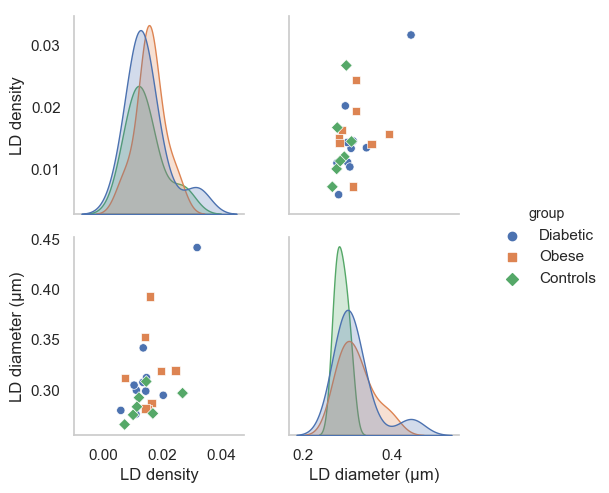

In [196]:
import seaborn as sns
#sns.set_theme(style="ticks")
#varibs = avg_cs_ready63.iloc[:,[0,4]]
#print(varibs)

sns.set(font_scale=1)
sns.set_style("whitegrid", {'axes.grid' : False})

g = sns.pairplot(ready[ready['cell type'] == 'I'], hue="group", markers=["o", "s", "D"],
                x_vars=['LD density', 'LD diameter (μm)'],
                y_vars=['LD density', 'LD diameter (μm)'],
                )

In [1]:
import seaborn as sns
sns.__version__
#pip install seaborn --upgrade

'0.11.1'

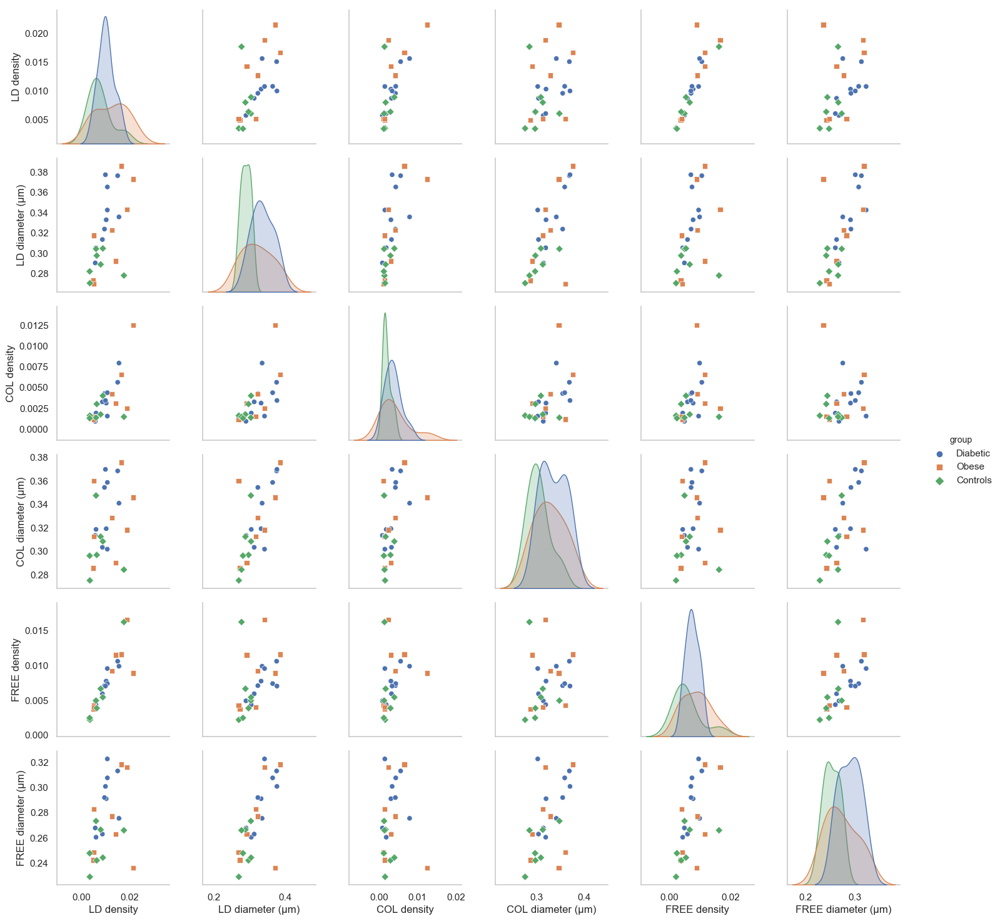

In [197]:
import seaborn as sns
#sns.set_theme(style="ticks")
#varibs = avg_cs_ready63.iloc[:,[0,4]]
#print(varibs)

sns.set(font_scale=1)
sns.set_style("whitegrid", {'axes.grid' : False})

g = sns.pairplot(ready[ready['cell type'] == 'II'], hue="group", markers=["o", "s", "D"],
                x_vars=['LD density', 'LD diameter (μm)', 'COL density', 'COL diameter (μm)', 'FREE density', 'FREE diameter (μm)'],
                y_vars=['LD density', 'LD diameter (μm)', 'COL density', 'COL diameter (μm)', 'FREE density', 'FREE diameter (μm)'],
                )

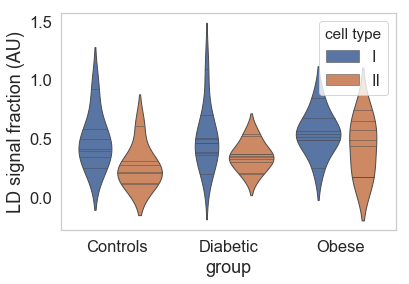

In [57]:
import seaborn as sns

sns.set(font_scale=1.5)
sns.set_style("whitegrid", {'axes.grid' : False})

sns.violinplot(data=ready, x="group", y="LD density", hue="cell type",
               split=False, linewidth=1,
               height=7, aspect=.8, inner="stick", bw=.8);


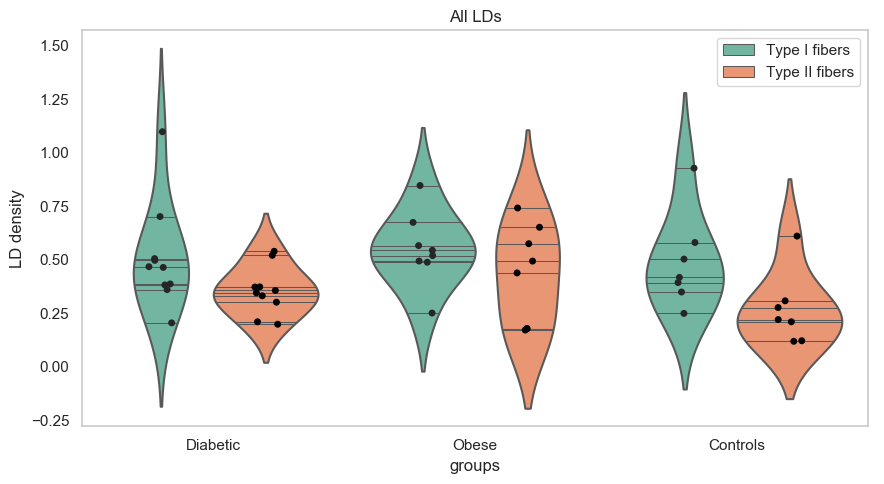

In [260]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


plt.style.use('default')
sns.set()
sns.set_style("whitegrid", {'axes.grid' : False})
sns.set_palette('Set2')

var = 'LD density'
marker = 'All LDs'

main_var = ready

cases = [main_var[main_var['cell type'] == 'I'], main_var[main_var['cell type'] == 'II']]
cells = ['Type I fibers', 'Type II fibers']

fig = plt.figure(figsize=(9,5))
 
ax = fig.add_subplot(1, 1, 1)



sns.violinplot(x='group', y=var, data=ready, hue='cell type', showfliers=False, palette='Set2', inner="stick", bw=.8, ax=ax)
sns.stripplot(x='group', y=var, data=ready, hue='cell type', dodge=True, jitter=True, color='black', size=5, ax=ax)

handles, labels = ax.get_legend_handles_labels()

ax.legend(handles[0:2], [cells[0],cells[1]])
ax.set_xlabel('groups')
ax.set_ylabel(var)
ax.set_aspect('auto')
#ax.set_ylim(0, 20)
plt.title('{}'.format(marker))

fig.tight_layout()
plt.show()

C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

The backend was *originally* set to 'module://ipykernel.pylab.backend_inline' by the following code:
  File "C:\Devel\Anaconda3\lib\runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "C:\Devel\Anaconda3\lib\runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "C:\Devel\Anaconda3\lib\site-packages\traitlets\config\application.py", line 658, in launch_instance
    app.start()
  File "C:\Devel\Anaconda3\lib\site-packages\ipykernel\kernelapp.py", line 499, in start
    self.io_loop.start()
  File "C:\Devel\Anaconda3\lib\site-packages\tornado\platfor

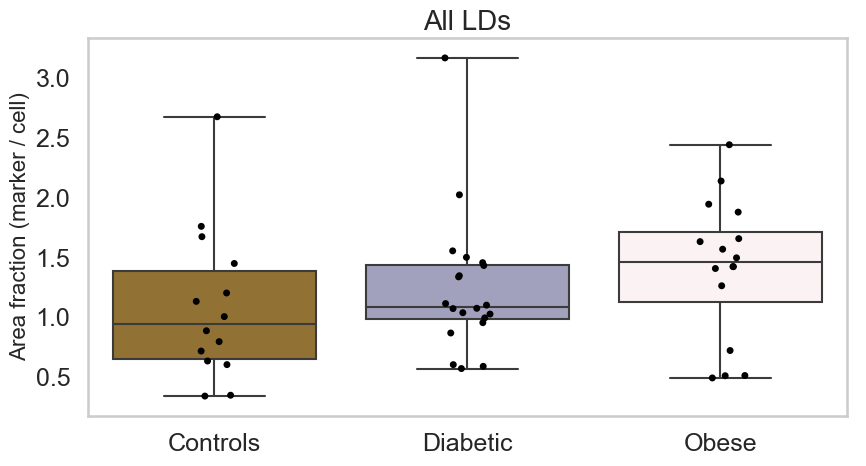

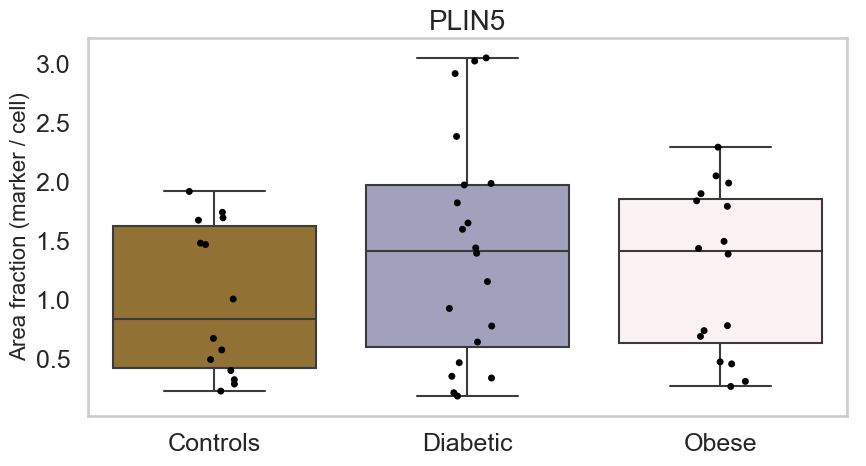

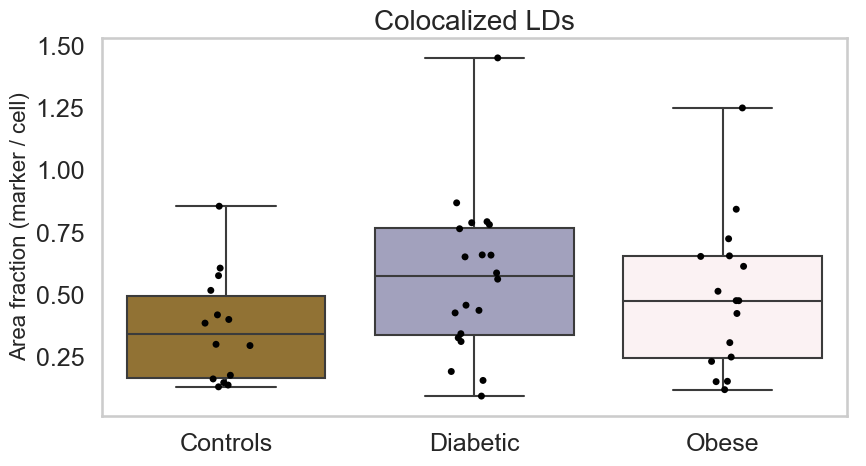

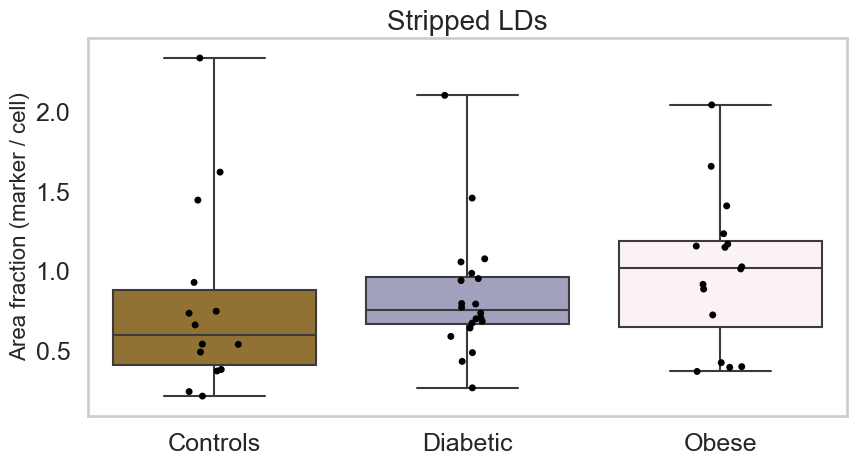

In [206]:
import numpy as np
import pandas as pd
import matplotlib
matplotlib.use("pgf")
matplotlib.rcParams.update({
    "pgf.texsystem": "pdflatex",
    'font.family': 'serif',
    'text.usetex': True,
    'pgf.rcfonts': False,
})
import matplotlib.pyplot as plt
import seaborn as sns


plt.style.use('default')
sns.set()
sns.set_style("whitegrid", {'axes.grid' : False})
sns.set_palette('Set2')
sns.set_context("talk", rc={"lines.linewidth": 1.5})

var = ['LD density','PLIN5 density','COL density','FREE density']
marker = ['All LDs', 'PLIN5', 'Colocalized LDs', 'Stripped LDs']

main_var = ready

cases = [main_var[main_var['cell type'] == 'I'], main_var[main_var['cell type'] == 'II']]
cells = ['Type I fibers', 'Type II fibers']
gp_ord = ['Controls', 'Diabetic','Obese']

pal_colors = ["#A17724","#9E9CC2","#FDF0F2"]
Mypal3 = dict(zip(gp_ord, pal_colors))


for i, v in enumerate(var):
    fig = plt.figure(figsize=(9,5))
    ax = fig.add_subplot(1, 1, 1)


    #g = sns.swarmplot(x='group', y=var, data=ready, hue='cell type', palette='Set2', dodge=True, ax=ax)
    sns.boxplot(x='group', order=gp_ord, y=v, data=ready,  showfliers=False, palette=Mypal3, ax=ax, whis=50)    
    sns.stripplot(x='group', order=gp_ord, y=v, data=ready, dodge=True, jitter=True, color='black', ax=ax)
    


    handles, labels = ax.get_legend_handles_labels()

    #ax.legend(handles[0:2], [cells[0],cells[1]])
    #ax.set_xlabel('groups')
    ax.set_ylabel('Area fraction (marker / cell)', fontsize = 16)
    ax.set_xlabel('',fontsize = 18)
    ax.tick_params(labelsize=18)
    ax.set_aspect('auto')
    #ax.set_ylim(0, 20)
    plt.title('{}'.format(marker[i]), fontsize = 20)

    fig.tight_layout()
    plt.show()
    directory = r'D:\VASCO\Diabetic_study_for_TOPOCELL\Figures_data presentation\python'
    fig.savefig('{}\AllFibers_{}.png'.format(directory, v), dpi=300)

relative to LD density


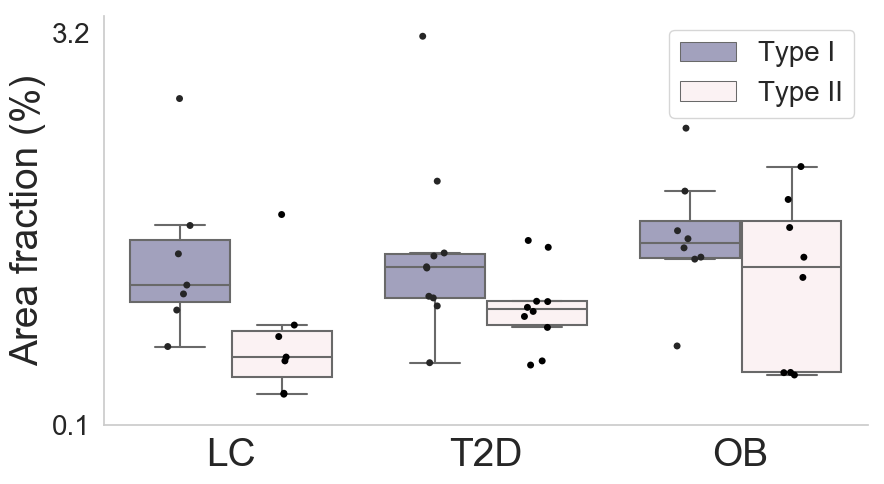

relative to PLIN5 density


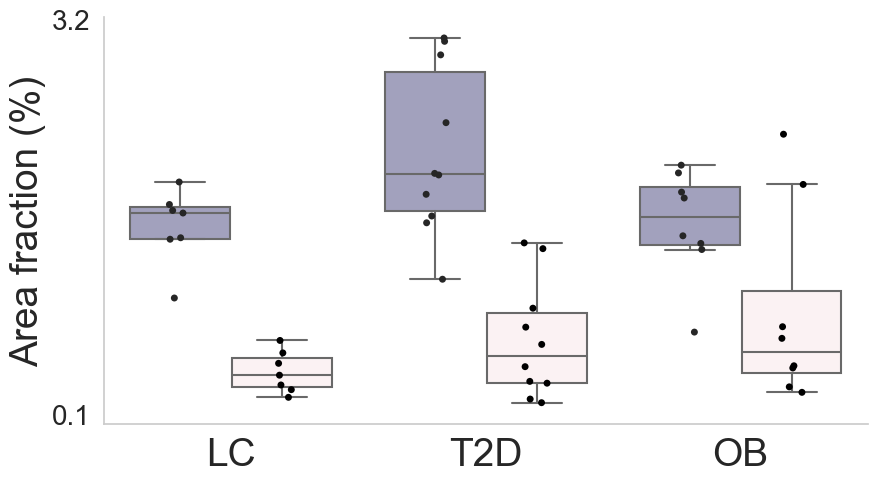

relative to COL density


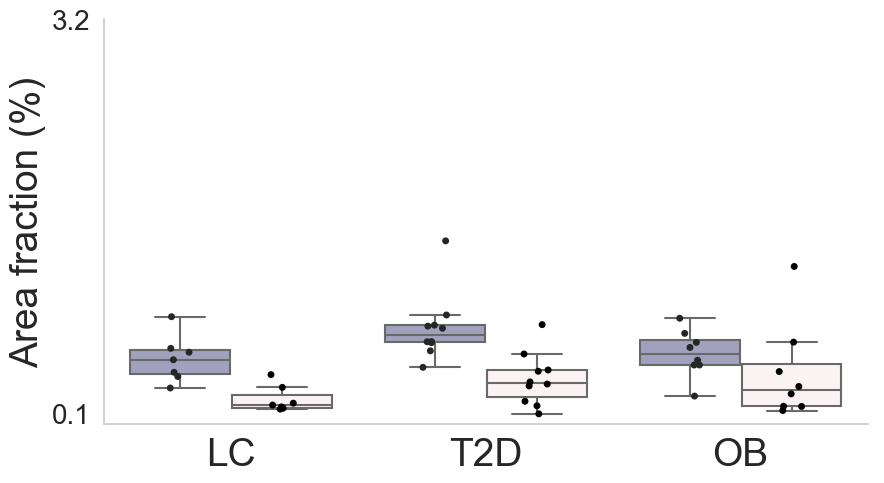

relative to FREE density


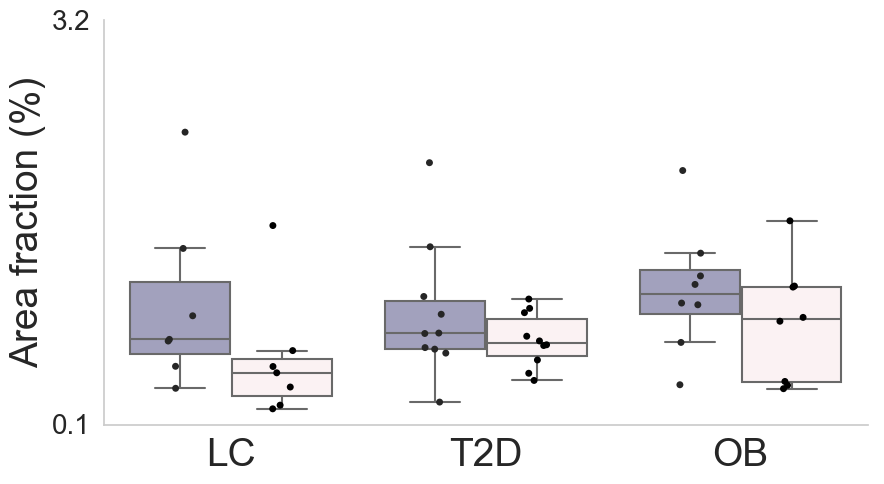

relative to LD diameter (μm)


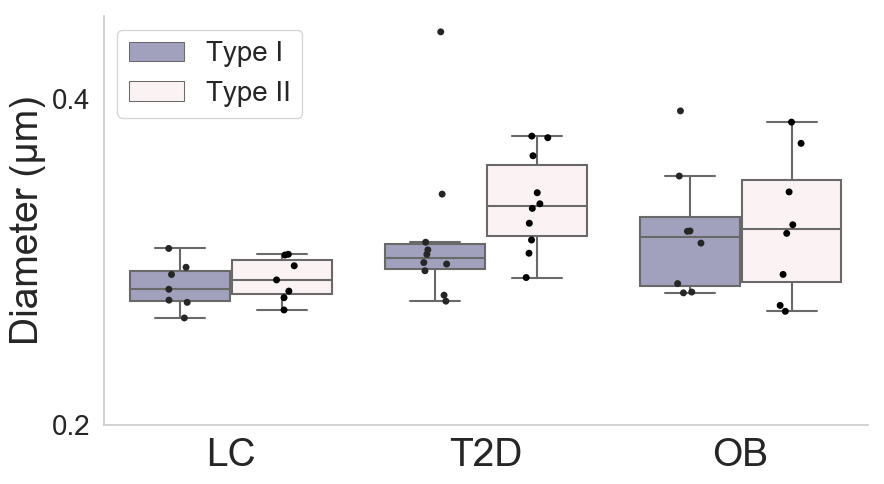

relative to PLIN5 diameter (μm)


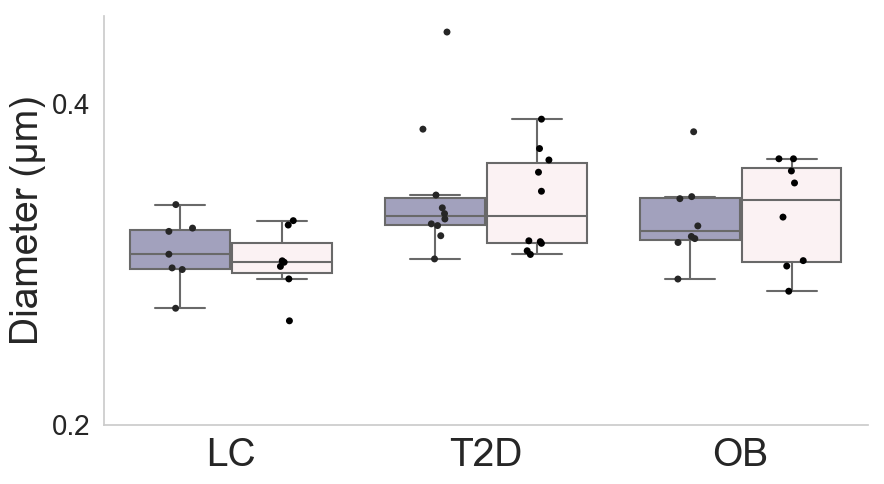

relative to COL diameter (μm)


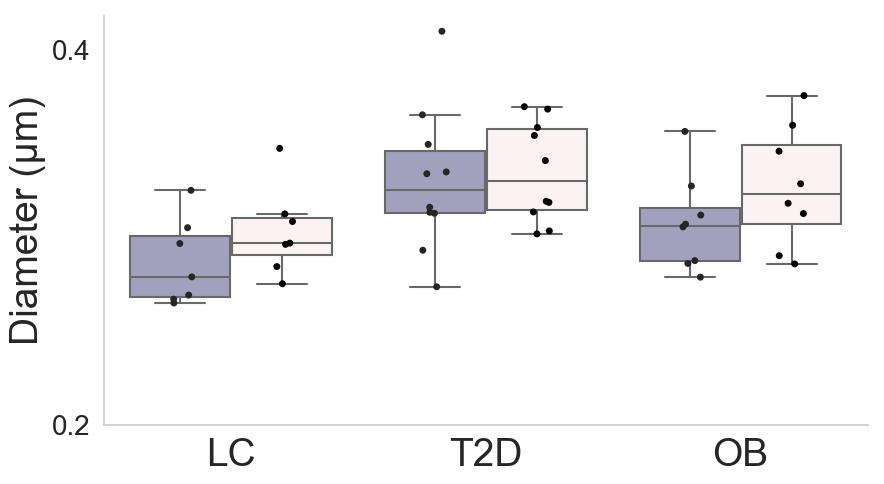

relative to FREE diameter (μm)


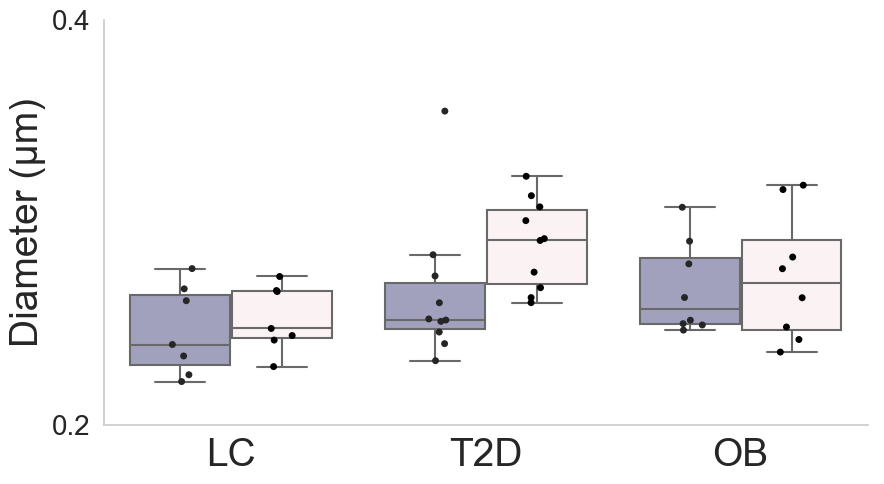

relative to LD distance to sarcolemma (μm)


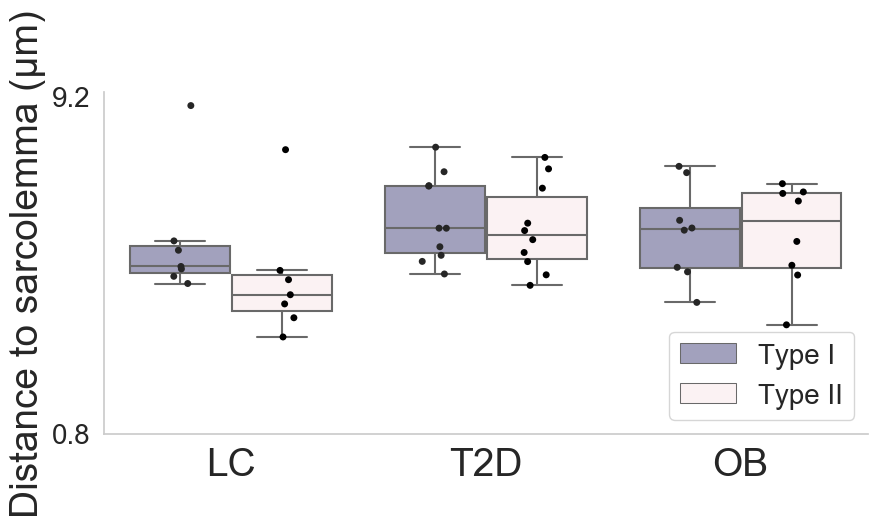

relative to PLIN5 distance to sarcolemma (μm)


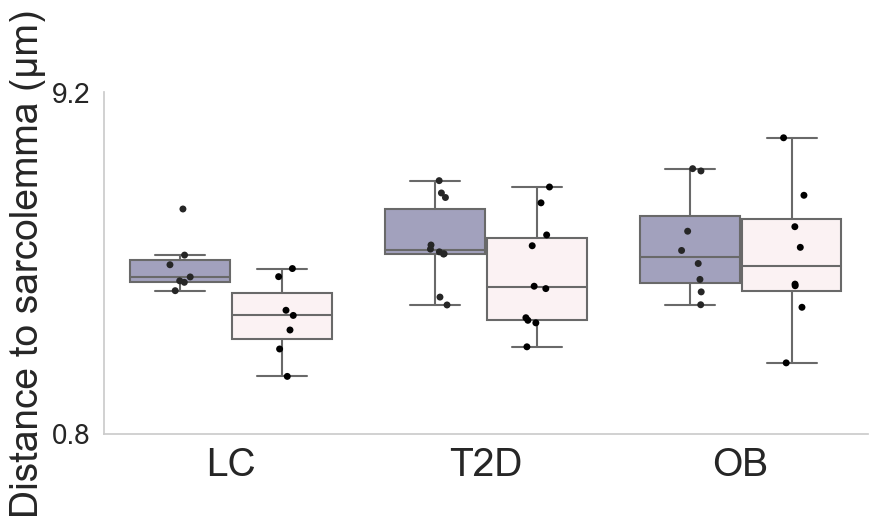

relative to COL distance to sarcolemma (μm)


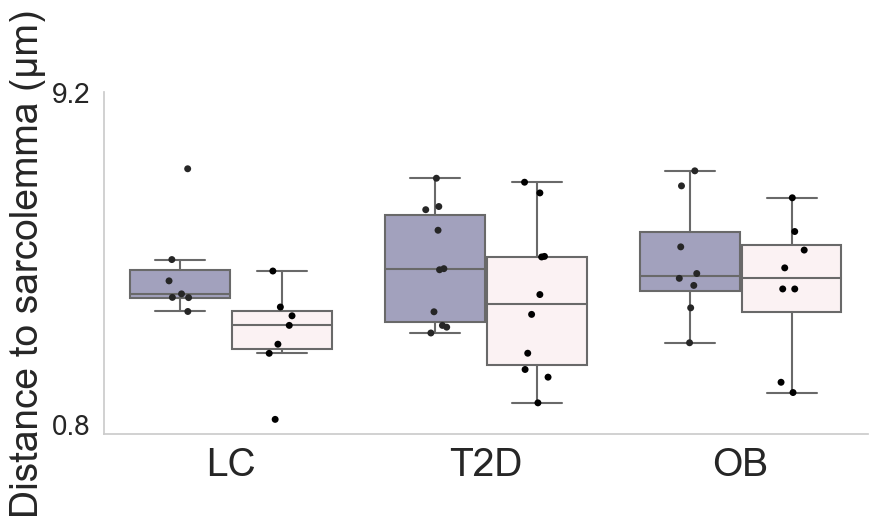

relative to FREE distance to sarcolemma (μm)


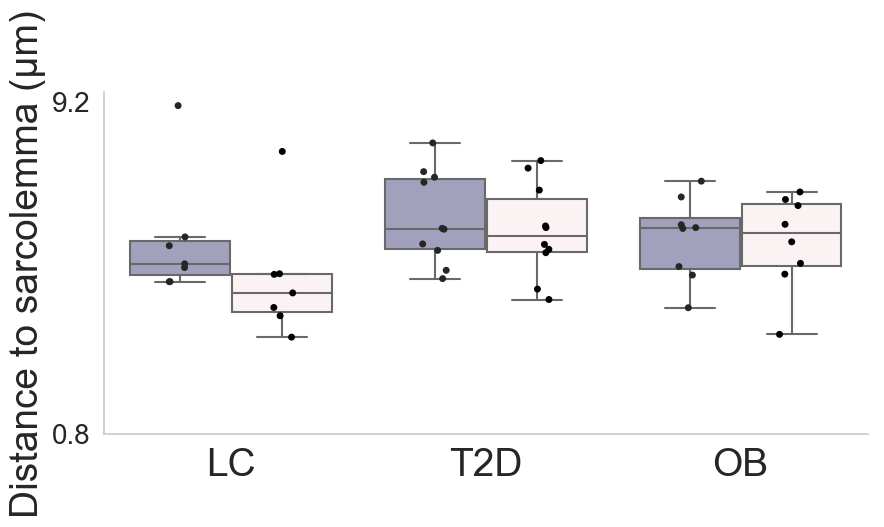

In [620]:

plt.style.use('default')
sns.set()
sns.set_style("whitegrid", {'axes.grid' : False})
sns.set_palette('Set2')
cells = ['I', 'II']
pal_colors = ["#9E9CC2","#FDF0F2"]
Mypal3 = dict(zip(cells, pal_colors))

measure = ['density', 'diameter (μm)', 'distance to sarcolemma (μm)']
y_label = ['Area fraction (%)', 'Diameter (μm)', 'Distance to sarcolemma (μm)']
particle = ['LD ', 'PLIN5 ', 'COL ', 'FREE ']
marker = ['All LDs', 'PLIN5', 'Colocalized LDs', 'Stripped LDs']

for ii, m in enumerate(measure):
    
    #here we find the max and min values for each variable in order to produce graphs with comparable/similar scales
    y_max = max(max(ready['{}{}'.format(p,m)]) for p in particle)
    y_min = min(min(ready['{}{}'.format(p,m)]) for p in particle)
    
    for i, p in enumerate(particle):
        v = '{}{}'.format(p,m)

        cases = [ready[ready['cell type'] == 'I'], [ready[ready['cell type'] == 'II']]]
        gp_ord = ['Controls', 'Diabetic', 'Obese']
        gp_labels = ['LC', 'T2D', 'OB']
        

        fig = plt.figure(figsize=(9,5))
        #plt.axis('off')
        ax = fig.add_subplot(1, 1, 1)
        
        print('relative to', v)
        sns.boxplot(x='group', order=gp_ord, y=v, data=ready, hue='cell type', showfliers=False, palette=Mypal3, ax=ax)#, whis=50)
        sns.stripplot(x='group', order=gp_ord, y=v, data=ready, hue='cell type', dodge=True, jitter=True, color='black', ax=ax)
       
        handles, labels = ax.get_legend_handles_labels()
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.get_legend().remove()
        ax.set_ylabel(y_label[ii], fontsize = 28)
        ax.set_xlabel('', fontsize = 12)
        ax.tick_params(labelsize=20)
        ax.set_xticklabels(['LC', 'T2D', 'OB'], rotation=0, fontsize=28)
        ax.set_yticks([round(y_min-(0.01*y_max), 1), round(y_max+(0.01*y_max), 1)])
        #ax.set_aspect('auto')
        
        if p == 'LD ':
            ax.legend(handles[0:2], ['Type {}'.format(cells[0]),'Type {}'.format(cells[1])], fontsize=20, frameon=True, loc='best')
        
        fig.tight_layout()
        plt.show()

        directory = r'D:\VASCO\Diabetic_study_for_TOPOCELL\Figures_data presentation\python'
        fig.savefig('{}\COMB_{}.png'.format(directory, v), dpi=300, bbox_inches='tight')
        fig.savefig('{}\COMB_{}.pdf'.format(directory, v), dpi=300, bbox_inches='tight')



In [615]:
measure = ['density', 'diameter (μm)', 'distance to sarcolemma (μm)']
y_label = ['Area fraction (%)', 'Diameter (μm)', 'Distance to sarcolemma (μm)']
for ii, m in enumerate(measure):
    particle = ['LD ', 'PLIN5 ', 'COL ', 'FREE ']
    marker = ['All LDs', 'PLIN5', 'Colocalized LDs', 'Stripped LDs']
    
    y_max = max(max(ready['{}{}'.format(p,m)]) for p in particle)
    y_min = min(min(ready['{}{}'.format(p,m)]) for p in particle)
    print('{}{}'.format(p,m), y_max)

    

FREE density 3.171151529446354
FREE diameter (μm) 0.4451547216561929
FREE distance to sarcolemma (μm) 9.083708498253735


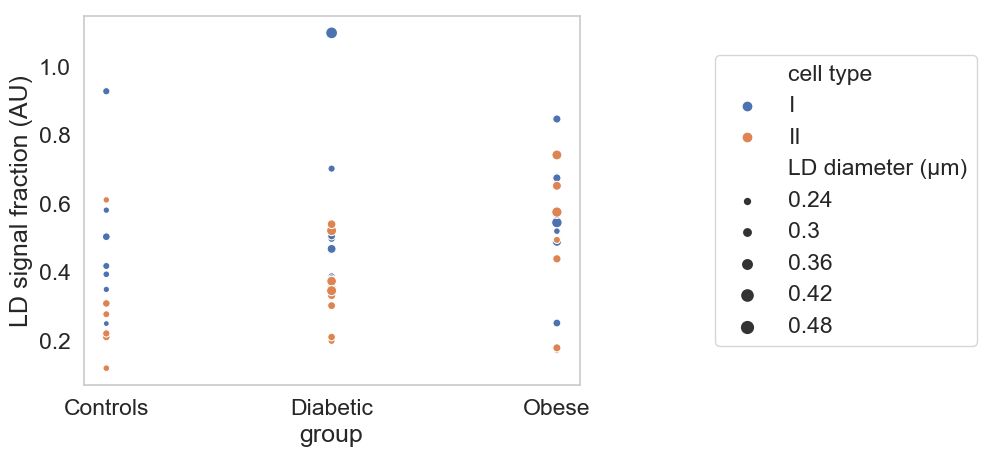

In [103]:
sns.set(style="ticks")
sns.set(font_scale=1.5)
sns.set_style("whitegrid", {'axes.grid' : False})

x=sns.scatterplot(y='LD density', x='group', size='LD diameter (μm)', hue='cell type', data=ready)
x
x.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)

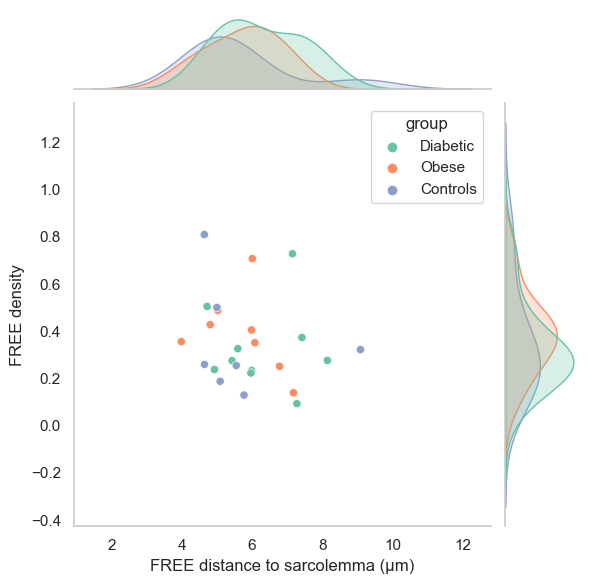

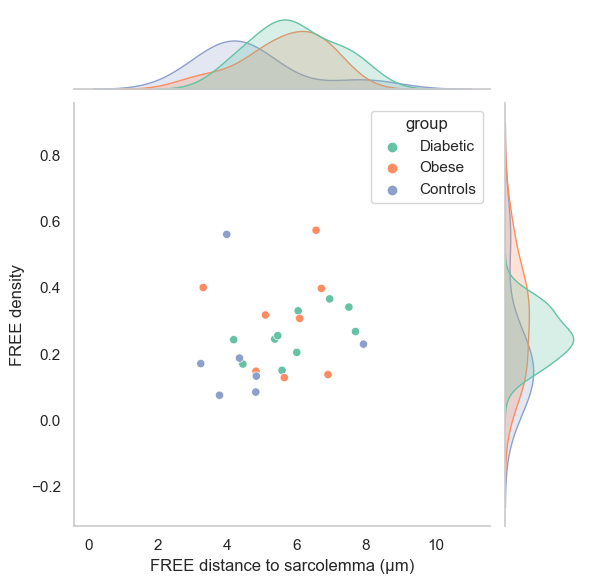

In [270]:
cells=['I', 'II']
for c in cells:
    data = ready[(ready['cell type'] == c)]
    g= sns.jointplot(data=data, y="FREE density", x="FREE distance to sarcolemma (μm)",  hue='group')
    
 


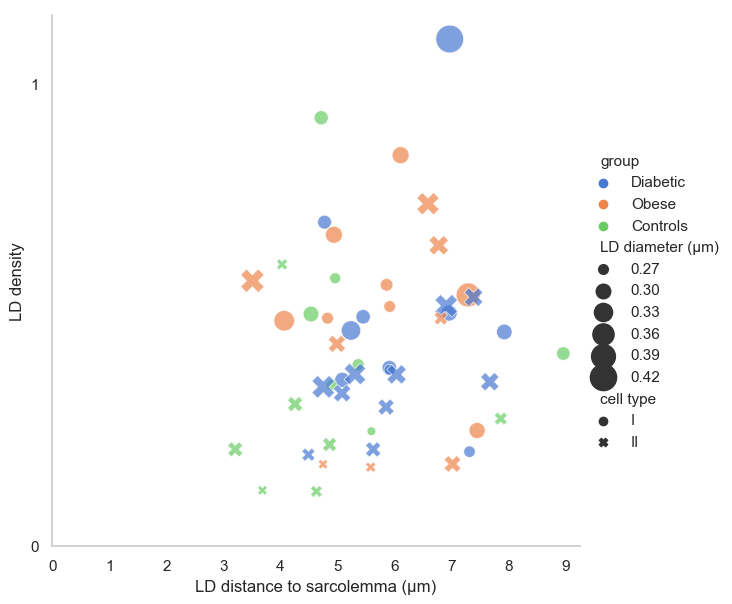

<Figure size 640x480 with 0 Axes>

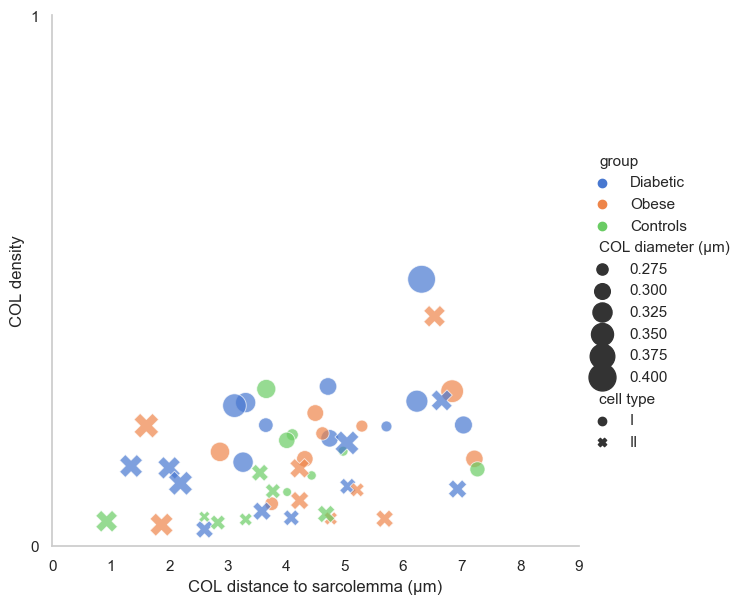

<Figure size 640x480 with 0 Axes>

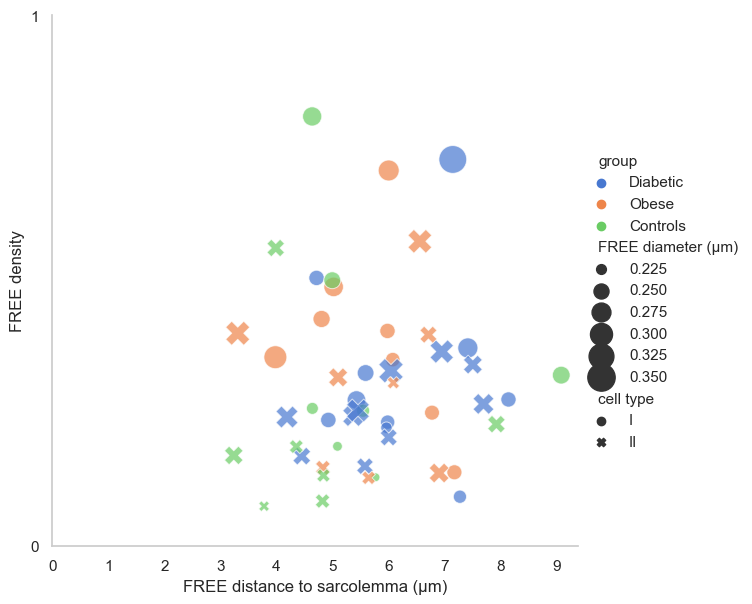

<Figure size 640x480 with 0 Axes>

In [484]:

LD_type = ['LD', 'COL', 'FREE']
for ld in LD_type:

    
    sns.relplot(y="{} density".format(ld), x="{} distance to sarcolemma (μm)".format(ld), hue="group",
            size="{} diameter (μm)".format(ld),
            style='cell type', sizes=(40, 400), alpha=.7, palette="muted",
            height=6, aspect=1, data=ready).set(xticks=[i for i in range(0, 10)],
           yticks=[i for i in range(0, 2)])




    #fig.tight_layout()
    plt.show()

    directory = r'D:\VASCO\Diabetic_study_for_TOPOCELL\Figures_data presentation\python'
    plt.savefig(r'{}\rel_{}.png'.format(directory, ld), dpi=300)
    plt.savefig(r'{}\rel{}.pdf'.format(directory, ld), dpi=300)
    #directory = r'D:\VASCO\Diabetic_study_for_TOPOCELL\Figures_data presentation\python\spearman'
    #fig.savefig('{}\COMB_{}.pgf'.format(directory, v))

[[<matplotlib.axis.YTick at 0x1c1f0a83b70>,

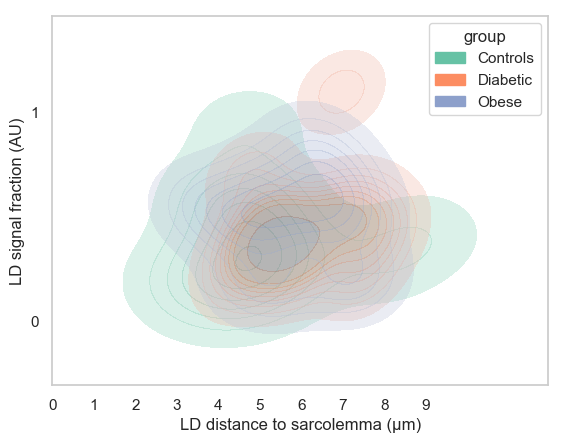

In [8]:
# Plot miles per gallon against horsepower with other semantics
ld = 'LD'
p1 = sns.kdeplot(data=ready, y="{} density".format(ld), x="{} distance to sarcolemma (μm)".format(ld),
                 hue="group", fill=True, alpha=0.3)
    
p1.set(xticks=[i for i in range(0, 10)],
           yticks=[i for i in range(0, 2)])




In [20]:
ready

,subject,Age,Weight,BM,FFM,FM,FAT%,TCHOL,HDL,LDL,TAGemia,Glycemia,VO2max,group,#,LD#,CellArea(μm^2),LD density,LD diameter (μm),LD distance to sarcolemma (μm),PLIN5 density,PLIN5 diameter (μm),PLIN5 distance to sarcolemma (μm),COL density,COL diameter (μm),COL distance to sarcolemma (μm),FREE density,FREE diameter (μm),FREE distance to sarcolemma (μm),cell type
0,01,45,160.4,41.67,101.3,59.1,0.368,5.1,1.00,2.8,4.00,11.30,17.20,Diabetic,14,8322,2869.682214,0.031712,0.441281,6.965336,0.030521,0.445155,7.030162,0.014532,0.409806,6.314796,0.021055,0.354995,7.148138,I
1,03,53,91.3,30.16,67.0,24.3,0.266,6.3,1.10,3.9,3.00,6.00,34.20,Diabetic,8,2713,1138.548375,0.020259,0.294590,4.771078,0.019764,0.318012,4.164264,0.006590,0.293047,3.651158,0.014605,0.251755,4.715950,I
2,05,52,92.9,30.30,71.6,21.3,0.229,4.6,1.10,2.6,2.00,6.80,29.10,Diabetic,50,14075,1774.814240,0.011159,0.299617,5.907733,0.011577,0.328468,5.229978,0.005872,0.312763,4.742142,0.006753,0.245834,5.985597,I
3,06,60,115.0,37.13,84.3,30.7,0.267,3.6,1.30,2.2,1.00,5.40,21.90,Diabetic,4,1948,2693.813250,0.013394,0.307427,7.921749,0.019888,0.335419,6.726878,0.007893,0.349484,6.234516,0.007987,0.251102,8.141974,I
4,07,55,139.5,43.49,83.9,50.6,0.363,3.8,1.00,2.3,1.50,6.50,16.10,Diabetic,7,1261,1866.990000,0.005909,0.279592,7.311747,0.016541,0.331816,6.615351,0.006599,0.315979,7.030550,0.002693,0.240094,7.275546,I
5,08,60,102.9,31.76,74.5,28.4,0.276,3.6,0.90,1.6,2.80,6.60,23.70,Diabetic,12,3422,1389.950750,0.014345,0.298715,5.447309,0.023869,0.324358,5.344602,0.008695,0.313272,4.714533,0.009429,0.260301,5.591597,I
6,09,60,89.5,29.22,64.7,24.8,0.277,4.6,1.90,2.7,1.50,6.50,21.70,Diabetic,15,5674,2007.111400,0.014582,0.312113,6.954616,0.029193,0.325423,5.224243,0.007818,0.333841,3.306166,0.010792,0.284024,7.417129,I
7,10,52,112.1,31.32,78.0,34.1,0.304,8.7,0.70,NaN,8.60,19.00,17.70,Diabetic,34,9582,1923.993529,0.013488,0.341650,5.234835,0.030256,0.384530,5.277636,0.007652,0.365253,3.114769,0.007954,0.273548,5.428776,I
8,12,39,112.4,33.93,82.5,29.9,0.266,3.0,1.00,1.4,1.30,5.80,24.10,Diabetic,6,1465,1320.219833,0.011029,0.275931,5.909180,0.018246,0.303532,5.445988,0.006520,0.273581,5.714210,0.006450,0.231676,5.964021,I
9,14,51,104.2,31.32,72.9,31.3,0.300,4.5,1.30,2.2,1.90,6.30,24.20,Diabetic,20,3124,1112.913300,0.010396,0.304645,5.083526,0.016008,0.343412,3.970146,0.004573,0.334801,3.261735,0.006872,0.252289,4.926452,I


In [34]:
#Here we are going to try to reproduce a table for latex, with the resume of the subjects and setup, to use in the methods section
#print(ready['Age'][(ready['group']=='Controls')&(ready['cell type']=='I')])
from scipy.stats import sem

ready['FAT%'] =  ready['FAT%'].apply(lambda x: x*100) #multiply fat% values per 100 so it actually percentual

methods_headers = ['n', 'Age (years)',r'VO$_{2}$max', 'Body weight (Kg)', 'BMI (Kg/m^2)', 'FAT%', 'TAGemia', 'Glycemia', 'Number of LDs per subject' ]
groups = ['Controls', 'Diabetic','Obese']
methods_table = pd.DataFrame([], index=methods_headers, columns=groups)


i_vars = ['Age', 'VO2max', 'Weight', 'BM','FAT%', 'TAGemia', 'Glycemia', 'LD#']

for g in groups:
    for i, v in enumerate(i_vars):
        cur_var = ready[v][(ready['group']== g)&(ready['cell type']=='I')]
        methods_table[g].loc['n'] = len(ready[(ready['group']== g)&(ready['cell type']=='I')])
        #print(v, cur_var.mean())  
        #cur_var.std()
        methods_table[g].iloc[i+1] = '{} +/- {}'.format (round(cur_var.mean(), 1), round(sem(cur_var), 1))
        #methods_table[g].iloc[i+1].round(3)
#print(ready)
#ready
#methods_table
print(methods_table.to_latex(index=True))
methods_table

\begin{tabular}{llll}
\toprule
{} &            Controls &           Diabetic &              Obese \\
\midrule
n                         &                   7 &                 10 &                  8 \\
Age (years)               &        56.4 +/- 2.8 &       52.7 +/- 2.2 &       51.9 +/- 3.2 \\
VO\$\_\{2\}\$max               &        30.7 +/- 1.5 &       23.0 +/- 1.8 &       28.6 +/- 2.1 \\
Body weight (Kg)          &        78.4 +/- 2.4 &      112.0 +/- 7.1 &       99.6 +/- 5.4 \\
BMI (Kg/m\textasciicircum 2)              &        25.8 +/- 0.4 &       34.0 +/- 1.6 &       32.3 +/- 1.0 \\
FAT\%                      &    1994.3 +/- 110.3 &   2916.0 +/- 139.2 &   3073.8 +/- 180.9 \\
TAGemia                   &         1.4 +/- 0.2 &        2.8 +/- 0.7 &        1.8 +/- 0.4 \\
Glycemia                  &         5.1 +/- 0.2 &        8.0 +/- 1.3 &        5.1 +/- 0.6 \\
Number of LDs per subject &  12990.1 +/- 2771.7 &  5158.6 +/- 1340.1 &  6666.1 +/- 1695.3 \\
\bottomrule
\end{tabular}



,Controls,Diabetic,Obese
n,7,10,8
Age (years),56.4 +/- 2.8,52.7 +/- 2.2,51.9 +/- 3.2
VO$_{2}$max,30.7 +/- 1.5,23.0 +/- 1.8,28.6 +/- 2.1
Body weight (Kg),78.4 +/- 2.4,112.0 +/- 7.1,99.6 +/- 5.4
BMI (Kg/m^2),25.8 +/- 0.4,34.0 +/- 1.6,32.3 +/- 1.0
FAT%,1994.3 +/- 110.3,2916.0 +/- 139.2,3073.8 +/- 180.9
TAGemia,1.4 +/- 0.2,2.8 +/- 0.7,1.8 +/- 0.4
Glycemia,5.1 +/- 0.2,8.0 +/- 1.3,5.1 +/- 0.6
Number of LDs per subject,12990.1 +/- 2771.7,5158.6 +/- 1340.1,6666.1 +/- 1695.3


In [1]:
import pandas as pd
subject_ready = r'D:\VASCO\Diabetic_study_for_TOPOCELL\tsv_data_fpr_python\ready_dataframe.pkl'
#ready.to_pickle(subject_ready)  # where to save it, usually as a .pkl
ready = pd.read_pickle(subject_ready) #to load it
particle_ready = r'D:\VASCO\Diabetic_study_for_TOPOCELL\tsv_data_fpr_python\particle_dataframe.pkl'
#particle_table.to_pickle(particle_ready)  # where to save it, usually as a .pkl
particle_table = pd.read_pickle(particle_ready) #to load it
#particle_table

SW P value for FREE distance to sarcolemma (μm) in all groups:  0.6570563316345215
SW P value for FREE distance to sarcolemma (μm) in Type I Controls:  0.0034473605919629335
SW P value for FREE distance to sarcolemma (μm) in Type II Controls:  0.04421547055244446
SW P value for FREE distance to sarcolemma (μm) in Type I Obese:  0.7803514003753662
SW P value for FREE distance to sarcolemma (μm) in Type II Obese:  0.39065021276474
SW P value for FREE distance to sarcolemma (μm) in Type I Diabetic:  0.5007959008216858
SW P value for FREE distance to sarcolemma (μm) in Type II Diabetic:  0.6260659694671631
SW P value for FREE distance to sarcolemma (μm) in all Controls fibers:  0.016088388860225677
SW P value for FREE distance to sarcolemma (μm) in all Diabetic fibers:  0.3773856461048126
SW P value for FREE distance to sarcolemma (μm) in all Obese fibers:  0.38592928647994995


C:\Devel\Anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:2064: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
C:\Devel\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:248: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
C:\Devel\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:250: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


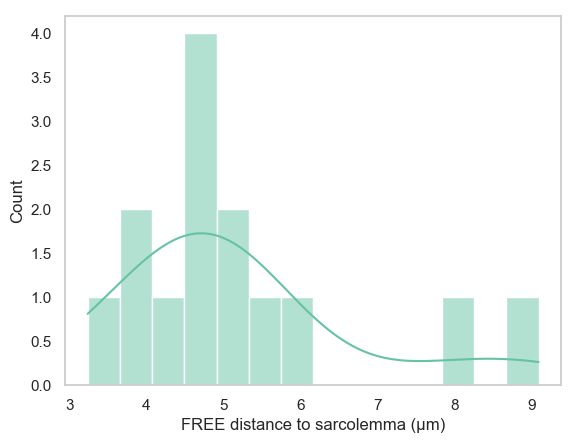

In [41]:
#CHECK FOR NORMALITY WITH SHAPIRO-WILK TEST
from scipy import stats

#var = 'LD density'
#var= 'LD diameter (μm)'
var = 'LD distance to sarcolemma (μm)'
#var = 'PLIN5 density'
#var= 'PLIN5 diameter (μm)'
#var = 'PLIN5 distance to sarcolemma (μm)'
#var = 'COL density'
#var= 'COL diameter (μm)'
#var = 'COL distance to sarcolemma (μm)'
#var = 'FREE density'
#var= 'FREE diameter (μm)'
#var = 'FREE distance to sarcolemma (μm)'

#variable and group to test:
data = ready[var]

#shapiro_test.statistic
shapiro_test = stats.shapiro(data)
#shapiro_test = stats.shapiro(np.log(data))
print('SW P value for {} in all groups: '.format(var), shapiro_test[1])

#graphs
#g= sns.histplot(data=data, kde=True, bins=len(data))
directory = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs'
#plt.savefig('{}\{}_EPS_distribution_avg.png'.format(directory, var))


#variable and group to test:
data = ready[var][(ready['cell type'] == 'I')&(ready['group'] == 'Controls')]

#shapiro_test.statistic
shapiro_test = stats.shapiro(data)
#shapiro_test = stats.shapiro(np.log(data))
print('SW P value for {} in Type I Controls: '.format(var), shapiro_test[1])

#graphs
#g= sns.histplot(data=data, kde=True, bins=len(data))
directory = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs'
#plt.savefig('{}\{}_EPS_distribution_avg.png'.format(directory, var))

#variable and group to test:
data = ready[var][(ready['cell type'] == 'II')&(ready['group'] == 'Controls')]

#shapiro_test.statistic
shapiro_test = stats.shapiro(data)
#shapiro_test = stats.shapiro(np.log(data))
print('SW P value for {} in Type II Controls: '.format(var), shapiro_test[1])

#graphs
#g= sns.histplot(data=data, kde=True, bins=len(data))
directory = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs'
#plt.savefig('{}\{}_EPS_distribution_avg.png'.format(directory, var))

#variable and group to test:
data = ready[var][(ready['cell type'] == 'I')&(ready['group'] == 'Obese')]

#shapiro_test.statistic
shapiro_test = stats.shapiro(data)
#shapiro_test = stats.shapiro(np.log(data))
print('SW P value for {} in Type I Obese: '.format(var), shapiro_test[1])

#graphs
#g= sns.histplot(data=data, kde=True, bins=len(data))
directory = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs'
#plt.savefig('{}\{}_EPS_distribution_avg.png'.format(directory, var))

#variable and group to test:
data = ready[var][(ready['cell type'] == 'II')&(ready['group'] == 'Obese')]

#shapiro_test.statistic
shapiro_test = stats.shapiro(data)
#shapiro_test = stats.shapiro(np.log(data))
print('SW P value for {} in Type II Obese: '.format(var), shapiro_test[1])

#graphs
#g= sns.histplot(data=data, kde=True, bins=len(data))
directory = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs'
#plt.savefig('{}\{}_EPS_distribution_avg.png'.format(directory, var))

#variable and group to test:
data = ready[var][(ready['cell type'] == 'I')&(ready['group'] == 'Diabetic')]

#shapiro_test.statistic
shapiro_test = stats.shapiro(data)
#shapiro_test = stats.shapiro(np.log(data))
print('SW P value for {} in Type I Diabetic: '.format(var), shapiro_test[1])

#graphs
#g= sns.histplot(data=data, kde=True, bins=len(data))
directory = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs'
#plt.savefig('{}\{}_EPS_distribution_avg.png'.format(directory, var))

#variable and group to test:
data = ready[var][(ready['cell type'] == 'II')&(ready['group'] == 'Diabetic')]

#shapiro_test.statistic
shapiro_test = stats.shapiro(data)
#shapiro_test = stats.shapiro(np.log(data))
print('SW P value for {} in Type II Diabetic: '.format(var), shapiro_test[1])

#graphs
#g= sns.histplot(data=data, kde=True, bins=len(data))
directory = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs'
#plt.savefig('{}\{}_EPS_distribution_avg.png'.format(directory, var))





#variable and group to test:
data = ready[var][(ready['group'] == 'Controls')]

#shapiro_test.statistic
shapiro_test = stats.shapiro(data)
#shapiro_test = stats.shapiro(np.log(data))
print('SW P value for {} in all Controls fibers: '.format(var), shapiro_test[1])

#graphs
g= sns.histplot(data=data, kde=True, bins=len(data))
directory = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs'
#plt.savefig('{}\{}_EPS_distribution_avg.png'.format(directory, var))


data = ready[var][(ready['group'] == 'Diabetic')]

#shapiro_test.statistic
shapiro_test = stats.shapiro(data)
#shapiro_test = stats.shapiro(np.log(data))
print('SW P value for {} in all Diabetic fibers: '.format(var), shapiro_test[1])

#graphs
#g= sns.histplot(data=data, kde=True, bins=len(data))
directory = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs'
#plt.savefig('{}\{}_EPS_distribution_avg.png'.format(directory, var))


data = ready[var][(ready['group'] == 'Obese')]

#shapiro_test.statistic
shapiro_test = stats.shapiro(data)
#shapiro_test = stats.shapiro(np.log(data))
print('SW P value for {} in all Obese fibers: '.format(var), shapiro_test[1])

#graphs
#g= sns.histplot(data=data, kde=True, bins=len(data))
directory = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs'
#plt.savefig('{}\{}_EPS_distribution_avg.png'.format(directory, var))

In [22]:
#just changing the name of the columns (and copying the dataframe) in order for the next statistcal methods to work
new_cols = []
for v in ready.columns:
    new_cols.append(v.replace('(AU)','').replace(' ','').replace('#','').replace('.','').replace('(μm)',''))
ready_ = ready.copy()
ready_.columns = new_cols
ready_.columns


Index(['subject', 'Age', 'Weight', 'BM', 'FFM', 'FM', 'FAT%', 'TCHOL', 'HDL',
       'LDL', 'TAGemia', 'Glycemia', 'VO2max', 'group', '', 'LD',
       'CellArea(μm^2)', 'LDdensity', 'LDdiameter', 'LDdistancetosarcolemma',
       'PLIN5density', 'PLIN5diameter', 'PLIN5distancetosarcolemma',
       'COLdensity', 'COLdiameter', 'COLdistancetosarcolemma', 'FREEdensity',
       'FREEdiameter', 'FREEdistancetosarcolemma', 'celltype'],
      dtype='object')

In [23]:
#LETS USE A 2-WAY ANOVA TO COMPARE GROUPS
#'LD density' tubes was always normally distributed independently from BCAA or EPS treatment. In the case of myoblasts, with EPS, there might be some transformations needed, or not
import statsmodels.api as sm
import numpy as np
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from statsmodels.graphics.factorplots import interaction_plot
import matplotlib.pyplot as plt
from scipy import stats

data = ready_.copy()
#var = 'LDdensity'
#var = 'LDdiameter'
#var= 'LDdistancetosarcolemma'
#var = 'PLIN5density'
#var = 'PLIN5diameter'
#var= 'PLIN5distancetosarcolemma'
#var = 'COLdensity'
#var = 'COLdiameter'
#var= 'COLdistancetosarcolemma'
var = 'FREEdensity'
#var = 'FREEdiameter'
#var= 'FREEdistancetosarcolemma'

log = 'log_{}'.format(var)
data[log] = list(np.log(data.loc[:,var]))

run = var #change between var (untransformed data) and log (log transformed data)
#run = log

print(var,'\n')

mod_all = ols('{}~celltype+group+celltype*group'.format(run), data = data).fit()
mod_I = ols('{}~celltype+group+celltype*group'.format(run), data = data[data['celltype'] == 'I']).fit()
mod_II = ols('{}~celltype+group+celltype*group'.format(run), data = data[data['celltype'] == 'II']).fit()

aov_all = sm.stats.anova_lm(mod_all, type=2)
aov_I = sm.stats.anova_lm(mod_I, type=2)
aov_II = sm.stats.anova_lm(mod_II, type=2)
print('\n\n all fibers\n',aov_all)
print('\n\n Type I fibers\n',aov_I)
print('\n Type II fibers\n\n',aov_II)

#Let's do some ttests to compare groups
print('\n\n T-Tests and Mann-Whitney to compare groups:')
ttest = sm.stats.ttest_ind(data[var][(data['group'] == 'Controls')&(data['celltype'] == 'I')], data[var][(data['group'] == 'Obese')&(data['celltype'] == 'I')])
mann = stats.mannwhitneyu(data[var][(data['group'] == 'Controls')&(data['celltype'] == 'I')], data[var][(data['group'] == 'Obese')&(data['celltype'] == 'I')], use_continuity=True, alternative=None)
print('\n T-Test for {} in Type I fibers between Controls and Obese '.format(var), ttest)
print('\n Mann-Whitney for {} in Type I fibers between Controls and Obese '.format(var), mann)

ttest = sm.stats.ttest_ind(data[var][(data['group'] == 'Controls')&(data['celltype'] == 'II')], data[var][(data['group'] == 'Obese')&(data['celltype'] == 'II')])
mann = stats.mannwhitneyu(data[var][(data['group'] == 'Controls')&(data['celltype'] == 'II')], data[var][(data['group'] == 'Obese')&(data['celltype'] == 'II')], use_continuity=True, alternative=None)
print('\n T-Test for {} in Type II fibers between Controls and Obese '.format(var), ttest)
print('\n Mann-Whitney for {} in Type II fibers between Controls and Obese '.format(var), mann)

ttest = sm.stats.ttest_ind(data[var][(data['group'] == 'Controls')&(data['celltype'] == 'I')], data[var][(data['group'] == 'Diabetic')&(data['celltype'] == 'I')])
mann = stats.mannwhitneyu(data[var][(data['group'] == 'Controls')&(data['celltype'] == 'I')], data[var][(data['group'] == 'Diabetic')&(data['celltype'] == 'I')], use_continuity=True, alternative=None)
print('\n T-Test for {} in Type I fibers between Controls and Diabetic '.format(var), ttest)
print('\n Mann-Whitney for {} in Type I fibers between Controls and Diabetic '.format(var), mann)

ttest = sm.stats.ttest_ind(data[var][(data['group'] == 'Controls')&(data['celltype'] == 'II')], data[var][(data['group'] == 'Diabetic')&(data['celltype'] == 'II')])
mann = stats.mannwhitneyu(data[var][(data['group'] == 'Controls')&(data['celltype'] == 'II')], data[var][(data['group'] == 'Diabetic')&(data['celltype'] == 'II')], use_continuity=True, alternative=None)
print('\n T-Test for {} in Type II fibers between Controls and Diabetic '.format(var), ttest)
print('\n Mann-Whitney for {} in Type II fibers between Controls and Diabetic '.format(var), mann)

ttest = sm.stats.ttest_ind(data[var][(data['group'] == 'Diabetic')&(data['celltype'] == 'I')], data[var][(data['group'] == 'Obese')&(data['celltype'] == 'I')])
mann = stats.mannwhitneyu(data[var][(data['group'] == 'Diabetic')&(data['celltype'] == 'I')], data[var][(data['group'] == 'Obese')&(data['celltype'] == 'I')], use_continuity=True, alternative=None)
print('\n T-Test for {} in Type I fibers between Diabetic and Obese '.format(var), ttest)
print('\n Mann-Whitney for {} in Type I fibers between Diabetic and Obese '.format(var), mann)

ttest = sm.stats.ttest_ind(data[var][(data['group'] == 'Diabetic')&(data['celltype'] == 'II')], data[var][(data['group'] == 'Obese')&(data['celltype'] == 'II')])
mann = stats.mannwhitneyu(data[var][(data['group'] == 'Diabetic')&(data['celltype'] == 'II')], data[var][(data['group'] == 'Obese')&(data['celltype'] == 'II')], use_continuity=True, alternative=None)
print('\n T-Test for {} in Type II fibers between Diabetic and Obese '.format(var), ttest)
print('\n Mann-Whitney for {} in Type II fibers between Diabetic and Obese '.format(var), mann)



ttest = sm.stats.ttest_ind(data[var][(data['group'] == 'Controls')&(data['celltype'] == 'I')], data[var][(data['group'] != 'Controls')&(data['celltype'] == 'I')])
mann = stats.mannwhitneyu(data[var][(data['group'] == 'Controls')&(data['celltype'] == 'I')], data[var][(data['group'] != 'Controls')&(data['celltype'] == 'I')], use_continuity=True, alternative=None)
print('\n T-Test for {} in Type I fibers between Controls and Unhealthy '.format(var), ttest)
print('\n Mann-Whitney for {} in Type I fibers between Controls and Unhealthy '.format(var), mann)

ttest = sm.stats.ttest_ind(data[var][(data['group'] == 'Controls')&(data['celltype'] == 'II')], data[var][(data['group'] != 'Controls')&(data['celltype'] == 'II')])
mann = stats.mannwhitneyu(data[var][(data['group'] == 'Controls')&(data['celltype'] == 'II')], data[var][(data['group'] != 'Controls')&(data['celltype'] == 'II')], use_continuity=True, alternative=None)
print('\n T-Test for {} in Type II fibers between Controls and Unhealthy '.format(var), ttest)
print('\n Mann-Whitney for {} in Type II fibers between Controls and Unhealthy '.format(var), mann)







#Let's do some ttests to compare fiber types
print('\n\n T-Tests and Mann-Whitney to compare fiber types:')

ttest = sm.stats.ttest_ind(data[var][(data['group'] == 'Controls')&(data['celltype'] == 'I')], data[var][(data['group'] == 'Controls')&(data['celltype'] == 'II')])
mann = stats.mannwhitneyu(data[var][(data['group'] == 'Controls')&(data['celltype'] == 'I')], data[var][(data['group'] == 'Controls')&(data['celltype'] == 'II')], use_continuity=True, alternative=None)
print('\n T-Test for {} between Controls fiber types '.format(var), ttest)
print('\n Mann-Whitney for {} between Controls fiber types '.format(var), mann)

ttest = sm.stats.ttest_ind(data[var][(data['group'] == 'Obese')&(data['celltype'] == 'I')], data[var][(data['group'] == 'Obese')&(data['celltype'] == 'II')])
mann = stats.mannwhitneyu(data[var][(data['group'] == 'Obese')&(data['celltype'] == 'I')], data[var][(data['group'] == 'Obese')&(data['celltype'] == 'II')], use_continuity=True, alternative=None)
print('\n T-Test for {} between Obese fiber types '.format(var), ttest)
print('\n Mann-Whitney for {} between Obese fiber types '.format(var), mann)

ttest = sm.stats.ttest_ind(data[var][(data['group'] == 'Diabetic')&(data['celltype'] == 'I')], data[var][(data['group'] == 'Diabetic')&(data['celltype'] == 'II')])
mann = stats.mannwhitneyu(data[var][(data['group'] == 'Diabetic')&(data['celltype'] == 'I')], data[var][(data['group'] == 'Diabetic')&(data['celltype'] == 'II')], use_continuity=True, alternative=None)
print('\n T-Test for {} between Diabetic fiber types '.format(var), ttest)
print('\n Mann-Whitney for {} between Diabetic fiber types '.format(var), mann)






#Let's compare groups independently of fiber type
print('\n\n T-Tests and Mann-Whitney to compare groups with all fiber types together:')

ttest = sm.stats.ttest_ind(data[var][(data['group'] == 'Controls')], data[var][(data['group'] == 'Diabetic')])
mann = stats.mannwhitneyu(data[var][(data['group'] == 'Controls')], data[var][(data['group'] == 'Diabetic')], use_continuity=True, alternative=None)
print('\n T-Test for {} between all fibers of Controls and Diabetic '.format(var), ttest)
print('\n Mann-Whitney for {} between all fibers of Controls and Diabetic '.format(var), mann)

ttest = sm.stats.ttest_ind(data[var][(data['group'] == 'Controls')], data[var][(data['group'] == 'Obese')])
mann = stats.mannwhitneyu(data[var][(data['group'] == 'Controls')], data[var][(data['group'] == 'Obese')], use_continuity=True, alternative=None)
print('\n T-Test for {} between all fibers of Controls and Obese '.format(var), ttest)
print('\n Mann-Whitney for {} between all fibers of Controls and Obese '.format(var), mann)

ttest = sm.stats.ttest_ind(data[var][(data['group'] == 'Obese')], data[var][(data['group'] == 'Diabetic')])
mann = stats.mannwhitneyu(data[var][(data['group'] == 'Obese')], data[var][(data['group'] == 'Diabetic')], use_continuity=True, alternative=None)
print('\n T-Test for {} between all fibers of Obese and Diabetic '.format(var), ttest)
print('\n Mann-Whitney for {} between all fibers of Obese and Diabetic '.format(var), mann)


ttest = sm.stats.ttest_ind(data[var][(data['group'] == 'Controls')], data[var][(data['group'] != 'Controls')])
mann = stats.mannwhitneyu(data[var][(data['group'] == 'Controls')], data[var][(data['group'] != 'Controls')], use_continuity=True, alternative=None)
print('\n T-Test for {} between all fibers of Controls and Unhealthy '.format(var), ttest)
print('\n Mann-Whitney for {} between all fibers of Controls and Unhealthy '.format(var), mann)



C:\Devel\Anaconda3\lib\site-packages\statsmodels\compat\pandas.py:49: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  data_klasses = (pandas.Series, pandas.DataFrame, pandas.Panel)


FREEdensity 



 all fibers
                   df    sum_sq   mean_sq         F    PR(>F)
celltype        1.0   0.000099  0.000099  4.364286  0.042516
group           2.0   0.000033  0.000017  0.733540  0.485986
celltype:group  2.0   0.000010  0.000005  0.228273  0.796844
Residual        44.0  0.000996  0.000023 NaN       NaN      


 Type I fibers
                   df    sum_sq   mean_sq         F    PR(>F)
celltype        0.0   0.000000 NaN       NaN       NaN      
group           2.0   0.000015  0.000008  0.246661  0.783538
celltype:group  0.0   0.000000 NaN       NaN       NaN      
Residual        22.0  0.000673  0.000031 NaN       NaN      

 Type II fibers

                   df    sum_sq   mean_sq        F    PR(>F)
celltype        0.0   0.000000 NaN       NaN      NaN      
group           2.0   0.000028  0.000014  0.96925  0.394987
celltype:group  0.0   0.000000 NaN       NaN      NaN      
Residual        22.0  0.000323  0.000015 NaN      NaN      


 T-Tests and Mann-Whit

In [76]:
ready
bk_data = pd.read_excel(r'D:\VASCO\Diabetic_study_for_TOPOCELL\tsv_data_fpr_python\background_data_table.xlsx', header=[0,1]) 
bk_data
#bk_data['%'].iloc[0]

units years     kg   kgm"     kg            % mmoll                     \
   subject   Age Weight    BMI    FFM    FM   FAT% TCHOL   HDL  LDL TAGemia   
0   DM01    45    160.4  41.67  101.3  59.1  0.368  5.1   1.00  2.8  4.00     
1   DM03    53    91.3   30.16  67.0   24.3  0.266  6.3   1.10  3.9  3.00     
2   DM05    52    92.9   30.30  71.6   21.3  0.229  4.6   1.10  2.6  2.00     
3   DM06    60    115.0  37.13  84.3   30.7  0.267  3.6   1.30  2.2  1.00     
4   DM07    55    139.5  43.49  83.9   50.6  0.363  3.8   1.00  2.3  1.50     
5   DM08    60    102.9  31.76  74.5   28.4  0.276  3.6   0.90  1.6  2.80     
6   DM09    60    89.5   29.22  64.7   24.8  0.277  4.6   1.90  2.7  1.50     
7   DM10    52    112.1  31.32  78.0   34.1  0.304  8.7   0.70 NaN   8.60     
8   DM12    39    112.4  33.93  82.5   29.9  0.266  3.0   1.00  1.4  1.30     
9   DM14    51    104.2  31.32  72.9   31.3  0.300  4.5   1.30  2.2  1.90     
10  OW01    54    89.3   31.08  61.9   27.4  0.307  6.6   1.50  4.6  1.20     
11  OW02    59    107.0  34.94  72.9   34.1  0.319  6.2   5.10  1.2  3.40     
12  OW05    42    91.9   32.56  59.9   32.0  0.348  5.2   1.20  3.4  1.50     
13  OW06    59    106.2  32.60  79.1   27.1  0.255  5.7   1.40  3.5  1.80     
14  OW07    40    132.2  37.60  81.6   50.6  0.383  3.5   0.90  2.1  1.30     
15  OW08    60    90.0   31.22  59.4   30.6  0.340  4.0   1.10  1.8  3.50     
16  OW09    59    85.4   29.00  61.7   23.7  0.278  4.7   1.50  2.7  1.20     
17  OW10    42    95.0   29.75  73.2   21.8  0.229  3.6   1.10  2.4  0.50     
18  CO01    45    87.6   27.43  74.3   13.3  0.152  3.4   1.30  1.5  1.40     
19  CO03    57    76.8   25.99  60.8   16.0  0.208  6.8   1.60  4.6  1.10     
20  CO04    67    80.5   25.70  61.9   18.3  0.228  5.4   1.30  3.7  0.84     
21  CO06    59    70.0   24.80  56.8   12.9  0.184  6.2   1.30  3.7  2.70     
22  CO07    54    81.5   26.25  62.3   19.4  0.238  5.5   1.32  3.5  1.41     
23  CO08    50    81.3   26.55  64.6   16.4  0.202  5.0   1.51  3.1  0.69     
24  CO09    63    71.2   23.84  58.1   13.1  0.184  7.1   1.98  4.5  1.39     

            ml/min/kg  
   Glycemia    VO2max  
0   11.30    17.20     
1   6.00     34.20     
2   6.80     29.10     
3   5.40     21.90     
4   6.50     16.10     
5   6.60     23.70     
6   6.50     21.70     
7   19.00    17.70     
8   5.80     24.10     
9   6.30     24.20     
10  5.50     31.60     
11  1.40     27.90     
12  4.90     23.30     
13  5.50     24.50     
14  4.60     27.60     
15  6.80     25.60     
16  6.20     26.60     
17  5.70     42.10     
18  5.20     34.90     
19  5.00     31.30     
20  4.10     31.36*    
21  5.98     22.74*    
22  5.60     30.65*    
23  4.82     30.17*    
24  5.25     34.08*

In [602]:
ready

,subject,Age,Weight,BM,FFM,FM,FAT%,TCHOL,HDL,LDL,TAGemia,Glycemia,VO2max,group,#,LD#,CellArea(μm^2),LD density,LD diameter (μm),LD distance to sarcolemma (μm),PLIN5 density,PLIN5 diameter (μm),PLIN5 distance to sarcolemma (μm),COL density,COL diameter (μm),COL distance to sarcolemma (μm),FREE density,FREE diameter (μm),FREE distance to sarcolemma (μm),cell type
0,01,45,160.4,41.67,101.3,59.1,36.8,5.1,1.00,2.8,4.00,11.30,17.20,Diabetic,14,8322,2869.682214,3.171152,0.441281,6.965336,3.052100,0.445155,7.030162,1.453217,0.409806,6.314796,2.105517,0.354995,7.148138,I
1,03,53,91.3,30.16,67.0,24.3,26.6,6.3,1.10,3.9,3.00,6.00,34.20,Diabetic,8,2713,1138.548375,2.025897,0.294590,4.771078,1.976399,0.318012,4.164264,0.659011,0.293047,3.651158,1.460486,0.251755,4.715950,I
2,05,52,92.9,30.30,71.6,21.3,22.9,4.6,1.10,2.6,2.00,6.80,29.10,Diabetic,50,14075,1774.814240,1.115934,0.299617,5.907733,1.157684,0.328468,5.229978,0.587212,0.312763,4.742142,0.675305,0.245834,5.985597,I
3,06,60,115.0,37.13,84.3,30.7,26.7,3.6,1.30,2.2,1.00,5.40,21.90,Diabetic,4,1948,2693.813250,1.339427,0.307427,7.921749,1.988756,0.335419,6.726878,0.789334,0.349484,6.234516,0.798721,0.251102,8.141974,I
4,07,55,139.5,43.49,83.9,50.6,36.3,3.8,1.00,2.3,1.50,6.50,16.10,Diabetic,7,1261,1866.990000,0.590873,0.279592,7.311747,1.654091,0.331816,6.615351,0.659867,0.315979,7.030550,0.269343,0.240094,7.275546,I
5,08,60,102.9,31.76,74.5,28.4,27.6,3.6,0.90,1.6,2.80,6.60,23.70,Diabetic,12,3422,1389.950750,1.434482,0.298715,5.447309,2.386933,0.324358,5.344602,0.869456,0.313272,4.714533,0.942922,0.260301,5.591597,I
6,09,60,89.5,29.22,64.7,24.8,27.7,4.6,1.90,2.7,1.50,6.50,21.70,Diabetic,15,5674,2007.111400,1.458215,0.312113,6.954616,2.919309,0.325423,5.224243,0.781759,0.333841,3.306166,1.079238,0.284024,7.417129,I
7,10,52,112.1,31.32,78.0,34.1,30.4,8.7,0.70,NaN,8.60,19.00,17.70,Diabetic,34,9582,1923.993529,1.348827,0.341650,5.234835,3.025595,0.384530,5.277636,0.765179,0.365253,3.114769,0.795398,0.273548,5.428776,I
8,12,39,112.4,33.93,82.5,29.9,26.6,3.0,1.00,1.4,1.30,5.80,24.10,Diabetic,6,1465,1320.219833,1.102906,0.275931,5.909180,1.824556,0.303532,5.445988,0.651966,0.273581,5.714210,0.645034,0.231676,5.964021,I
9,14,51,104.2,31.32,72.9,31.3,30.0,4.5,1.30,2.2,1.90,6.30,24.20,Diabetic,20,3124,1112.913300,1.039624,0.304645,5.083526,1.600790,0.343412,3.970146,0.457294,0.334801,3.261735,0.687240,0.252289,4.926452,I


In [218]:
x=ready.corr(method="spearman")
x

,Age,Weight,BM,FFM,FM,FAT%,TCHOL,HDL,LDL,TAGemia,Glycemia,VO2max,CellArea(μm^2),LD signal fraction (AU),LD diameter (μm),LD distance to sarcolemma (μm),PLIN5 signal fraction (AU),PLIN5 diameter (μm),PLIN5 distance to sarcolemma (μm),COL signal fraction (AU),COL diameter (μm),COL distance to sarcolemma (μm),FREE signal fraction (AU),FREE diameter (μm),FREE distance to sarcolemma (μm)
Age,1.000000,-0.370947,-0.309375,-0.362585,-0.262469,-0.177655,0.307932,0.430740,0.211506,0.058027,0.017978,-0.057960,-0.471418,-0.065166,-0.107645,-0.372365,-0.055609,0.078586,-0.315405,0.147035,0.017474,-0.266554,-0.076172,-0.176094,-0.321873
Weight,-0.370947,1.000000,0.953645,0.873798,0.881878,0.690014,-0.425106,-0.606134,-0.603265,0.324991,0.294016,-0.537692,0.466835,0.203147,0.492589,0.500084,0.246583,0.409562,0.479327,0.284444,0.407255,0.340565,0.245622,0.481634,0.475676
BM,-0.309375,0.953645,1.000000,0.760246,0.923033,0.785604,-0.389756,-0.517153,-0.555387,0.331986,0.199769,-0.574341,0.419348,0.289497,0.470000,0.486724,0.246918,0.416465,0.488935,0.321599,0.368984,0.384170,0.323137,0.440589,0.467982
FFM,-0.362585,0.873798,0.760246,1.000000,0.604888,0.346487,-0.497882,-0.530620,-0.561942,0.114985,0.205775,-0.380146,0.526905,0.062294,0.323103,0.563724,0.189094,0.238410,0.491336,0.182268,0.287246,0.380303,0.106804,0.377707,0.552861
FM,-0.262469,0.881878,0.923033,0.604888,1.000000,0.929740,-0.232473,-0.502723,-0.487157,0.413136,0.262368,-0.613698,0.352616,0.371266,0.572088,0.320988,0.291091,0.543056,0.365306,0.342330,0.483357,0.174001,0.412315,0.545651,0.298493
FAT%,-0.177655,0.690014,0.785604,0.346487,0.929740,1.000000,-0.141399,-0.390436,-0.334277,0.392410,0.273200,-0.543006,0.287301,0.450566,0.545853,0.226725,0.235091,0.531141,0.283743,0.301051,0.469797,0.107594,0.486239,0.528545,0.207111
TCHOL,0.307932,-0.425106,-0.389756,-0.497882,-0.232473,-0.141399,1.000000,0.429825,0.812813,0.216268,-0.098247,0.150558,-0.334897,0.097073,-0.038579,-0.565891,0.057436,0.100825,-0.350098,0.058013,0.033769,-0.435915,-0.003271,-0.198956,-0.551748
HDL,0.430740,-0.606134,-0.517153,-0.530620,-0.502723,-0.390436,0.429825,1.000000,0.404045,-0.342193,-0.498945,0.358645,-0.347302,-0.030676,-0.200601,-0.432555,-0.020225,-0.043739,-0.385525,-0.062416,-0.038707,-0.335399,-0.068318,-0.252082,-0.410491
LDL,0.211506,-0.603265,-0.555387,-0.561942,-0.487157,-0.334277,0.812813,0.404045,1.000000,-0.212683,-0.150479,0.287704,-0.221183,-0.016311,-0.317421,-0.316007,-0.151044,-0.196390,-0.223141,-0.066225,-0.220966,-0.156373,-0.143215,-0.469553,-0.297195
TAGemia,0.058027,0.324991,0.331986,0.114985,0.413136,0.392410,0.216268,-0.342193,-0.212683,1.000000,0.592372,-0.451675,-0.176252,0.199822,0.333069,-0.123626,0.161051,0.343075,-0.115545,0.199053,0.281502,-0.190105,0.264570,0.413595,-0.121798


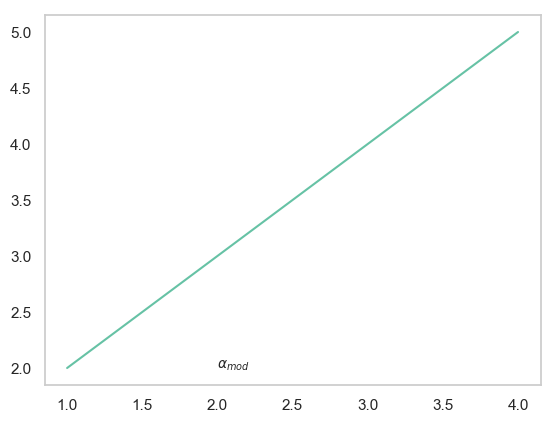

In [23]:
ax = plt.gca()
ax.text(2, 2, r'$\alpha_{mod}$', fontsize=10)
y = [2,3,4,5]
x = [1,2,3,4]
plt.plot(x,y)
plt.show()

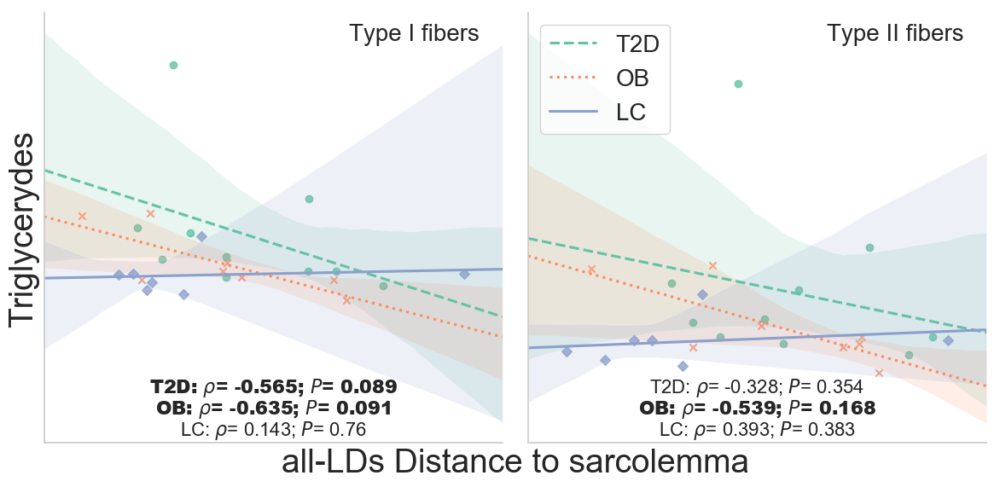

In [53]:
from scipy.stats import pearsonr

plt.style.use('default')
sns.set()
sns.set_style("whitegrid", {'axes.grid' : False})
sns.set_palette('Set2')

#for testing
particles = ['FREE']   
vars_1 = ['diameter (μm)']
vars_2 = ['Glycemia']

#The real thing. Variables to iterate through
particles = ['LD', 'PLIN5', 'COL', 'FREE']
p_labels = ['all-LDs', 'PLIN5', 'col-LDs', 'unc-LDs']
particles = ['LD']
p_labels = ['all-LDs']

vars_1 =['density', 'diameter (μm)', 'distance to sarcolemma (μm)']
v1_labels = ['Area fraction', 'Diameter', 'Distance to sarcolemma']
vars_1 =['distance to sarcolemma (μm)']
v1_labels = ['Distance to sarcolemma']

vars_2 = ['TAGemia', 'Glycemia', 'FAT%', 'HDL', 'LDL', 'TCHOL', 'VO2max', 'LD diameter (μm)', 'COL diameter (μm)', 'FREE diameter (μm)']
v2_labels = ['Triglycerydes', 'Glucose', 'Fat percentage', 'HDL', 'LDL', 'TCHOL', r'VO$_{2}$max', 'LD diameter (μm)', 'COL diameter (μm)', 'FREE diameter (μm)']
vars_2 = ['TAGemia']
v2_labels = ['Triglycerydes']


cells = ['I', 'II']

gp_ord = ['Diabetic', 'Obese', 'Controls']
grp_lbls = ['T2D', 'OB', 'LC']


for l, p in enumerate(particles):
    for i, v1 in enumerate(vars_1):
        for j, v2 in enumerate (vars_2):
            var_pair = [('{} {}'.format(p, v1), v2)]
            for vp in var_pair:
                fig = plt.figure(figsize=(12,6))
                plt.xlabel('{} {}'.format(p_labels[l], v1_labels[i]), fontsize = 28)
                plt.ylabel(v2_labels[j], fontsize = 28)
                plt.xticks([])
                plt.yticks([])
                axes = plt.gca()
                axes.spines['right'].set_visible(False)
                axes.spines['left'].set_visible(False)
                axes.spines['bottom'].set_visible(False)
                axes.spines['top'].set_visible(False)
                
                
                
                for k, c in enumerate(cells):
                    data = ready[ready['cell type'] == c]

                   
                    ax = fig.add_subplot(1, 2, k+1)
                 
                    
                    
                    #In this 6 lines we are just trying to prepare the figure in order for no line being truncated
                    #by determining the min and max values to be plotted
                    ctr = data['{} {}'.format(p,v1)][data['group'] == 'Controls']
                    t2d = data['{} {}'.format(p,v1)][data['group'] == 'Diabetic']
                    obe = data['{} {}'.format(p,v1)][data['group'] == 'Obese']
                    all_values_to_plot = pd.concat([ctr, t2d, obe])                
                    min_val = np.min(all_values_to_plot)
                    max_val = np.max(all_values_to_plot)
                    safe_marg = (max_val-min_val)*0.1
                    
                    
                    for d, m, ls in zip(data['group'].unique(), ["o", "x", "D"], ["--", ":", "-"]):
                        #ax.set(ylim=(-10, 60))
                        ax.set(xlim=(min_val-safe_marg, max_val+safe_marg))
                        g=sns.regplot(x=vp[0], y=vp[1], 
                                    data=data.loc[data.group == d], 
                                    marker=m, line_kws={"ls":ls}, 
                                    label=d, scatter=True, truncate=False,
                                    ax=ax, ci=95)
                     
                    ax.set_yticks([])
                    ax.set_xticks([])
                    
                    handles, labels = ax.get_legend_handles_labels()
                    ax.spines['right'].set_visible(False)
                    ax.spines['top'].set_visible(False)
                    ax.set_ylabel('', fontsize = 24)
                    ax.set_xlabel('' ,fontsize = 24)
                    ax.tick_params(labelsize=26)
                    ax.set_aspect('auto')
                    ax.text(0.95, 0.95, 'Type {} fibers'.format(c), horizontalalignment='right', 
                             verticalalignment='center', transform=ax.transAxes, fontsize=20)
                    #plt.title('Type {} fibers'.format(c), loc='upper right')
                    
                    #calculate Spearman Rank correlation and corresponding p-value
                    f = 0.0
                    g_lb = []
                    for g, gp in enumerate(gp_ord):
                        x = data[vp[0]][data['group'] == gp]
                        y = data[vp[1]][data['group'] == gp]
                        rho, pv = spearmanr(x , y)
                        #rho, pv = pearsonr(x , y)
                        
                        cor, sign = 'ultralight',''
                        if abs(rho) >= 0.5: cor = 'heavy'
                        if pv <= 0.05: sign = '*'
                        if pv <= 0.01: sign = '**'
                        
                        ax.text(0.5, 0.13+f, r'{}: $\rho$= {}; $\it{{P}}$= {}{}'.format(grp_lbls[g], 
                                    round(rho, 3), round(pv, 3), sign), horizontalalignment='center', 
                                    verticalalignment='center', transform=ax.transAxes, fontsize=16, weight=cor)
                        f -= 0.05
                    
                
                    if (c == 'II'):
                        plt.legend(grp_lbls, fontsize=20, frameon=True, loc='upper left')
                                   
                #plt.legend(fontsize=18, frameon=False, loc='best')
                plt.tight_layout()
    
            
                

                directory = r'D:\VASCO\Diabetic_study_for_TOPOCELL\Figures_data presentation\python\spearman'
                plt.savefig(r'{}\new_SpearCorr_{}_{}_{}.png'.format(directory, p, v1, v2), dpi=300)
                plt.savefig(r'{}\new_SpearCorr_{}_{}_{}.pdf'.format(directory, p, v1, v2), dpi=300)
                #fig.savefig('{}\COMB_{}.pgf'.format(directory, v))

                
              
                
                

In [348]:
#check correlations from fiber types, groups etc
x=ready[(ready['cell type'] == 'II') & (ready['group'] == 'Diabetic')].corr(method="spearman")
#x=ready[(ready['group'] == 'Diabetic')].corr(method="spearman")
x

#scipy.stats.spearmanr(a, b=None, axis=0, nan_policy='propagate')

,Age,Weight,BM,FFM,FM,FAT%,TCHOL,HDL,LDL,TAGemia,Glycemia,VO2max,CellArea(μm^2),LD density,LD diameter (μm),LD distance to sarcolemma (μm),PLIN5 density,PLIN5 diameter (μm),PLIN5 distance to sarcolemma (μm),COL density,COL diameter (μm),COL distance to sarcolemma (μm),FREE density,FREE diameter (μm),FREE distance to sarcolemma (μm)
Age,1.000000,-0.344656,-0.163593,-0.246183,-0.295420,-0.067906,-0.133133,0.253920,0.025534,-0.240759,-0.141986,-0.141555,-0.073855,0.190792,-0.153864,0.160019,-0.055391,-0.375429,0.283110,-0.086164,-0.240028,0.030773,0.283110,0.147710,0.196946
Weight,-0.344656,1.000000,0.948333,0.975758,0.854545,0.547115,-0.250005,-0.388956,-0.234312,-0.103344,0.030395,-0.624242,0.757576,0.672727,0.478788,0.769697,0.212121,0.260606,0.696970,0.515152,0.260606,0.672727,0.648485,0.200000,0.733333
BM,-0.163593,0.948333,1.000000,0.942254,0.753803,0.469512,-0.452602,-0.411814,-0.309626,-0.213415,-0.048780,-0.595747,0.686933,0.632222,0.395139,0.881463,-0.030395,0.000000,0.832831,0.322190,0.030395,0.820672,0.674775,0.206688,0.851068
FFM,-0.246183,0.975758,0.942254,1.000000,0.781818,0.462008,-0.298786,-0.413651,-0.284521,-0.109423,0.012158,-0.600000,0.769697,0.745455,0.454545,0.818182,0.224242,0.200000,0.769697,0.539394,0.163636,0.696970,0.721212,0.224242,0.793939
FM,-0.295420,0.854545,0.753803,0.781818,1.000000,0.875384,0.030488,-0.376608,-0.158997,0.127660,0.237083,-0.769697,0.587879,0.721212,0.745455,0.503030,0.406061,0.478788,0.454545,0.587879,0.575758,0.284848,0.696970,0.539394,0.442424
FAT%,-0.067906,0.547115,0.469512,0.462008,0.875384,1.000000,0.262998,-0.275575,0.142857,0.304878,0.457317,-0.826752,0.437692,0.626143,0.747724,0.303953,0.364743,0.431613,0.273557,0.480245,0.656538,-0.006079,0.680854,0.741645,0.249241
TCHOL,-0.133133,-0.250005,-0.452602,-0.298786,0.030488,0.262998,1.000000,-0.074540,0.957814,0.785936,0.590217,-0.042684,0.048781,-0.097563,0.036586,-0.506107,0.323177,0.329274,-0.481716,0.054879,0.457326,-0.664647,-0.146344,0.170735,-0.457326
HDL,0.253920,-0.388956,-0.411814,-0.413651,-0.376608,-0.275575,-0.074540,1.000000,0.291913,-0.538764,-0.538764,0.327217,-0.308695,-0.265478,-0.209913,-0.321043,0.197565,0.228434,-0.438347,0.166695,0.283999,-0.111130,-0.253130,-0.382782,-0.345738
LDL,0.025534,-0.234312,-0.309626,-0.284521,-0.158997,0.142857,0.957814,0.291913,1.000000,0.571429,0.361345,0.008368,0.133892,-0.267785,-0.292890,-0.301258,0.158997,0.100419,-0.309626,-0.058578,0.343099,-0.368204,-0.083683,-0.041841,-0.209207
TAGemia,-0.240759,-0.103344,-0.213415,-0.109423,0.127660,0.304878,0.785936,-0.538764,0.571429,1.000000,0.768293,-0.024316,-0.012158,0.042553,0.255320,-0.328269,-0.012158,0.109423,-0.267478,-0.158055,0.188451,-0.528878,0.030395,0.486324,-0.291795


In [906]:
#check p vlaues for spearman

from scipy.stats import spearmanr

particles = ['LD', 'PLIN5', 'COL', 'FREE']
p_labels = ['All LDs', 'PLIN5', 'Colocalized LDs', 'Stripped LDs']

    
vars_1 =['density', 'diameter', 'distancetosarcolemma']
v1_labels = ['Area fraction (%)', 'Diameter (μm)', 'Distance to sarcolemma (μm)']
vars_2 = ['TAGemia', 'Glycemia', 'FAT%', 'HDL', 'LDL', 'TCHOL', 'VO2max', 'LDdiameter', 'COLdiameter', 'FREEdiameter']
cells = ['I', 'II']
groups = ['Controls', 'Diabetic', 'Obese']


directory = r'D:\VASCO\Diabetic_study_for_TOPOCELL\Figures_data presentation\python\spearman'
corrFile = open(r'{}\corrFile.txt'.format(directory), "a")

for ip, p in enumerate(particles):
    for iv1, v1 in enumerate(vars_1):
        vv1 = '{}{}'.format(p, v1)
        for v2 in vars_2:
            for c in cells:
                for g in groups:

                    x = ready_[vv1][(ready['cell type'] == c) & (ready['group'] == g)]
                    y = ready_[v2][(ready['cell type'] == c) & (ready['group'] == g)]

                    #calculate Spearman Rank correlation and corresponding p-value
                    rho, pv = spearmanr(x , y)

                    line ='{} vs. {} in {} type {} fibers: rho={} and p={} \n'.format(vv1, v2, g, c, round(rho, 3), round(pv, 3))
                    print(line)
                    corrFile.write(line)


corrFile.close() #to change file access modes

LDdensity vs. TAGemia in Controls type I fibers: rho=0.071 and p=0.879 

LDdensity vs. TAGemia in Diabetic type I fibers: rho=0.547 and p=0.102 

LDdensity vs. TAGemia in Obese type I fibers: rho=0.359 and p=0.382 

LDdensity vs. TAGemia in Controls type II fibers: rho=0.75 and p=0.052 

LDdensity vs. TAGemia in Diabetic type II fibers: rho=0.043 and p=0.907 

LDdensity vs. TAGemia in Obese type II fibers: rho=-0.024 and p=0.955 

LDdensity vs. Glycemia in Controls type I fibers: rho=0.143 and p=0.76 

LDdensity vs. Glycemia in Diabetic type I fibers: rho=0.292 and p=0.413 

LDdensity vs. Glycemia in Obese type I fibers: rho=-0.06 and p=0.888 

LDdensity vs. Glycemia in Controls type II fibers: rho=0.75 and p=0.052 

LDdensity vs. Glycemia in Diabetic type II fibers: rho=0.213 and p=0.555 

LDdensity vs. Glycemia in Obese type II fibers: rho=-0.539 and p=0.168 

LDdensity vs. FAT% in Controls type I fibers: rho=0.36 and p=0.427 

LDdensity vs. FAT% in Diabetic type I fibers: rho=0.067 

PLIN5density vs. COLdiameter in Controls type I fibers: rho=0.714 and p=0.071 

PLIN5density vs. COLdiameter in Diabetic type I fibers: rho=0.588 and p=0.074 

PLIN5density vs. COLdiameter in Obese type I fibers: rho=-0.024 and p=0.955 

PLIN5density vs. COLdiameter in Controls type II fibers: rho=0.571 and p=0.18 

PLIN5density vs. COLdiameter in Diabetic type II fibers: rho=0.685 and p=0.029 

PLIN5density vs. COLdiameter in Obese type II fibers: rho=0.381 and p=0.352 

PLIN5density vs. FREEdiameter in Controls type I fibers: rho=-0.071 and p=0.879 

PLIN5density vs. FREEdiameter in Diabetic type I fibers: rho=0.782 and p=0.008 

PLIN5density vs. FREEdiameter in Obese type I fibers: rho=0.476 and p=0.233 

PLIN5density vs. FREEdiameter in Controls type II fibers: rho=-0.179 and p=0.702 

PLIN5density vs. FREEdiameter in Diabetic type II fibers: rho=0.188 and p=0.603 

PLIN5density vs. FREEdiameter in Obese type II fibers: rho=0.381 and p=0.352 

PLIN5diameter vs. TAGemia in Controls 


PLIN5distancetosarcolemma vs. LDdiameter in Obese type II fibers: rho=0.452 and p=0.26 

PLIN5distancetosarcolemma vs. COLdiameter in Controls type I fibers: rho=-0.107 and p=0.819 

PLIN5distancetosarcolemma vs. COLdiameter in Diabetic type I fibers: rho=0.321 and p=0.365 

PLIN5distancetosarcolemma vs. COLdiameter in Obese type I fibers: rho=0.333 and p=0.42 

PLIN5distancetosarcolemma vs. COLdiameter in Controls type II fibers: rho=0.214 and p=0.645 

PLIN5distancetosarcolemma vs. COLdiameter in Diabetic type II fibers: rho=-0.273 and p=0.446 

PLIN5distancetosarcolemma vs. COLdiameter in Obese type II fibers: rho=-0.238 and p=0.57 

PLIN5distancetosarcolemma vs. FREEdiameter in Controls type I fibers: rho=0.214 and p=0.645 

PLIN5distancetosarcolemma vs. FREEdiameter in Diabetic type I fibers: rho=-0.079 and p=0.829 

PLIN5distancetosarcolemma vs. FREEdiameter in Obese type I fibers: rho=-0.405 and p=0.32 

PLIN5distancetosarcolemma vs. FREEdiameter in Controls type II fibers: rho

COLdiameter vs. LDdiameter in Diabetic type I fibers: rho=0.879 and p=0.001 

COLdiameter vs. LDdiameter in Obese type I fibers: rho=0.881 and p=0.004 

COLdiameter vs. LDdiameter in Controls type II fibers: rho=0.821 and p=0.023 

COLdiameter vs. LDdiameter in Diabetic type II fibers: rho=0.673 and p=0.033 

COLdiameter vs. LDdiameter in Obese type II fibers: rho=0.476 and p=0.233 

COLdiameter vs. COLdiameter in Controls type I fibers: rho=1.0 and p=0.0 

COLdiameter vs. COLdiameter in Diabetic type I fibers: rho=1.0 and p=0.0 

COLdiameter vs. COLdiameter in Obese type I fibers: rho=1.0 and p=0.0 

COLdiameter vs. COLdiameter in Controls type II fibers: rho=1.0 and p=0.0 

COLdiameter vs. COLdiameter in Diabetic type II fibers: rho=1.0 and p=0.0 

COLdiameter vs. COLdiameter in Obese type II fibers: rho=1.0 and p=0.0 

COLdiameter vs. FREEdiameter in Controls type I fibers: rho=-0.25 and p=0.589 

COLdiameter vs. FREEdiameter in Diabetic type I fibers: rho=0.673 and p=0.033 

COLdia

FREEdensity vs. VO2max in Obese type I fibers: rho=-0.476 and p=0.233 

FREEdensity vs. VO2max in Controls type II fibers: rho=0.321 and p=0.482 

FREEdensity vs. VO2max in Diabetic type II fibers: rho=-0.758 and p=0.011 

FREEdensity vs. VO2max in Obese type II fibers: rho=-0.024 and p=0.955 

FREEdensity vs. LDdiameter in Controls type I fibers: rho=0.643 and p=0.119 

FREEdensity vs. LDdiameter in Diabetic type I fibers: rho=0.564 and p=0.09 

FREEdensity vs. LDdiameter in Obese type I fibers: rho=-0.024 and p=0.955 

FREEdensity vs. LDdiameter in Controls type II fibers: rho=0.25 and p=0.589 

FREEdensity vs. LDdiameter in Diabetic type II fibers: rho=0.648 and p=0.043 

FREEdensity vs. LDdiameter in Obese type II fibers: rho=0.619 and p=0.102 

FREEdensity vs. COLdiameter in Controls type I fibers: rho=-0.357 and p=0.432 

FREEdensity vs. COLdiameter in Diabetic type I fibers: rho=0.345 and p=0.328 

FREEdensity vs. COLdiameter in Obese type I fibers: rho=-0.333 and p=0.42 

FREEd

FREEdistancetosarcolemma vs. VO2max in Diabetic type I fibers: rho=-0.564 and p=0.09 

FREEdistancetosarcolemma vs. VO2max in Obese type I fibers: rho=0.357 and p=0.385 

FREEdistancetosarcolemma vs. VO2max in Controls type II fibers: rho=0.0 and p=1.0 

FREEdistancetosarcolemma vs. VO2max in Diabetic type II fibers: rho=-0.612 and p=0.06 

FREEdistancetosarcolemma vs. VO2max in Obese type II fibers: rho=0.119 and p=0.779 

FREEdistancetosarcolemma vs. LDdiameter in Controls type I fibers: rho=-0.5 and p=0.253 

FREEdistancetosarcolemma vs. LDdiameter in Diabetic type I fibers: rho=0.224 and p=0.533 

FREEdistancetosarcolemma vs. LDdiameter in Obese type I fibers: rho=0.0 and p=1.0 

FREEdistancetosarcolemma vs. LDdiameter in Controls type II fibers: rho=0.107 and p=0.819 

FREEdistancetosarcolemma vs. LDdiameter in Diabetic type II fibers: rho=0.079 and p=0.829 

FREEdistancetosarcolemma vs. LDdiameter in Obese type II fibers: rho=-0.119 and p=0.779 

FREEdistancetosarcolemma vs. COLd

In [353]:
#Now we are trying to inspect those larger LDs uncoated with PLIN5 and check where they are in the cell

large_STR = particle_table[(particle_table['PSize']>0.3)&(particle_table['PType']=='FREE')&(particle_table['CType']==2)]

#particle_table[(particle_table['Group']=='Diabetic')&(particle_table['C#']=='0')&(particle_table['PType']=='LD')]

particle_table.head()
particle_table['subject'].dtype

dtype('O')

20
20
20
0
0
0


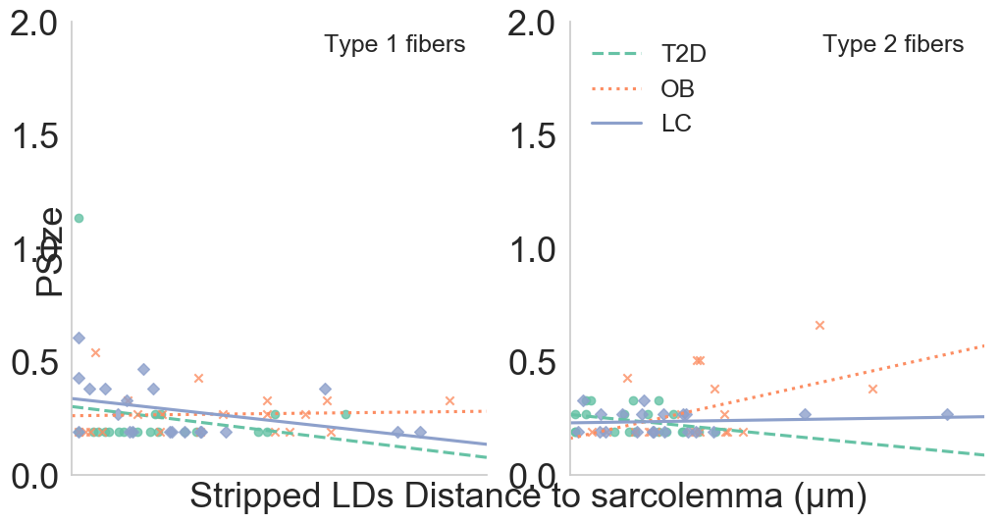

In [223]:
plt.style.use('default')
sns.set()
sns.set_style("whitegrid", {'axes.grid' : False})
sns.set_palette('Set2')

#for testing
particles = ['FREE']   
p_labels = ['Stripped LDs']

#The real thing. Variables to iterate through
#particles = ['LD', 'PLIN5', 'COL', 'FREE']
#p_labels = ['All LDs', 'PLIN5', 'Colocalized LDs', 'Stripped LDs']

vars_1 = ['PDist']
v1_labels = ['Distance to sarcolemma (μm)']

vars_2 = ['PSize']

cells = [1, 2]



for l, p in enumerate(particles):
    for i, v1 in enumerate(vars_1):
        for j, v2 in enumerate (vars_2):
            var_pair = [('{} {}'.format(v1, v2))]
            for vp in var_pair:
                fig = plt.figure(figsize=(12,6))
                plt.xlabel('{} {}'.format(p_labels[l], v1_labels[i]), fontsize = 26)
                plt.ylabel(v2, fontsize = 26)
                plt.xticks([])
                plt.yticks([])
                axes = plt.gca()
                axes.spines['right'].set_visible(False)
                axes.spines['left'].set_visible(False)
                axes.spines['bottom'].set_visible(False)
                axes.spines['top'].set_visible(False)
                
                fract = 0.8
                rs = 1
                samp_sz = 10
                Psize = 2
                pol = 1
                
                
                for k, c in enumerate(cells):
                    lc_rand = particle_table[(particle_table['Group'] == 'Controls')
                    & (particle_table['PSize']< Psize)
                    & (particle_table['CType'] == c)
                    & (particle_table['PType'] == p)].sample(n=samp_sz, replace=False, axis ='index', random_state=rs)

                    ob_rand = particle_table[(particle_table['Group'] == 'Obese')
                    & (particle_table['PSize']< Psize) 
                    & (particle_table['CType'] == c)
                    & (particle_table['PType'] == p)].sample(n=samp_sz, replace=False, axis ='index', random_state=rs)

                    t2d_rand = particle_table[(particle_table['Group'] == 'Diabetic')
                    & (particle_table['PSize']< Psize)
                    & (particle_table['CType'] == c)
                    & (particle_table['PType'] == p)].sample(n=samp_sz, replace=False, axis ='index', random_state=rs)

                    eq_rand = pd.concat([lc_rand, t2d_rand, ob_rand])
                    print(len(lc_rand[lc_rand['CType'] == 1]))
                    print(len(ob_rand[ob_rand['CType'] == 1]))
                    print(len(t2d_rand[t2d_rand['CType'] == 1]))
                    
                    data = eq_rand

                   
                    ax = fig.add_subplot(1, 2, k+1)
                 
                    
                    
                    #In this 6 lines we are just trying to prepare the figure in order for no line being truncated
                    #by determining the min and max values to be plotted
                    ctr = data['{}'.format(v1)][data['Group'] == 'Controls']
                    t2d = data['{}'.format(v1)][data['Group'] == 'Diabetic']
                    obe = data['{}'.format(v1)][data['Group'] == 'Obese']
                    all_values_to_plot = pd.concat([ctr, t2d, obe])                
                    min_val = np.min(all_values_to_plot)
                    max_val = np.max(all_values_to_plot)
                    safe_marg = (max_val-min_val)*0.1
                    
                    
                    for d, m, ls in zip(data['Group'].unique(), ["o", "x", "D"], ["--", ":", "-"]):
                        ax.set(ylim=(0, Psize))
                        ax.set(xlim=(-0.3, max_val+safe_marg))
                        g=sns.regplot(x=v1, y=v2, 
                                    data=data.loc[data.Group == d], 
                                    marker=m, line_kws={"ls":ls}, order=pol,
                                    label=d, scatter=True, truncate=False,
                                      ci=None, ax=ax)
                     
                    #ax.set_yticks([])
                    ax.set_xticks([])
                    
                    handles, labels = ax.get_legend_handles_labels()
                    ax.spines['right'].set_visible(False)
                    ax.spines['top'].set_visible(False)
                    ax.set_ylabel('', fontsize = 22)
                    ax.set_xlabel('' ,fontsize = 22)
                    ax.tick_params(labelsize=26)
                    ax.set_aspect('auto')
                    ax.text(0.95, 0.95, 'Type {} fibers'.format(c), horizontalalignment='right', 
                             verticalalignment='center', transform=ax.transAxes, fontsize=18)
                    #plt.title('Type {} fibers'.format(c), loc='upper right')
    
                    
                
                plt.legend(['T2D', 'OB', 'LC'], fontsize=18, frameon=False, loc='upper left')
                                   
                #plt.legend(fontsize=18, frameon=False, loc='best')
                #plt.tight_layout(2)
    
            
                

                directory = r'D:\VASCO\Diabetic_study_for_TOPOCELL\Figures_data presentation\python\spearman'
                plt.savefig(r'{}\polynomial_{}_{}_{}.png'.format(directory, p, v1, v2))
                plt.savefig(r'{}\polynomial_{}_{}_{}.pdf'.format(directory, p, v1, v2))
                #fig.savefig('{}\COMB_{}.pgf'.format(directory, v))

                
                   
                

dtype('O')

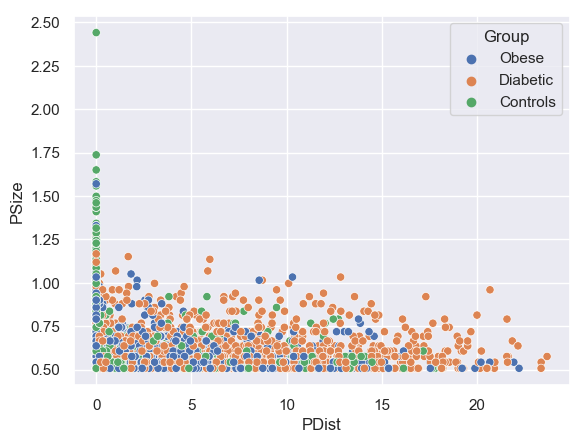

In [73]:
large_STR = particle_table[(particle_table['PSize']>0.5)&(particle_table['PType']=='FREE')&(particle_table['CType']==1)]
xx = large_STR.sample(frac=0.9, replace=False, axis ='index', random_state=1)

ax = sns.scatterplot(x="PDist", y="PSize", hue='Group', data=xx)

#ax.get_legend().remove()
handles, labels = ax.get_legend_handles_labels()

xx['CType'].dtype

C:\Devel\Anaconda3\lib\site-packages\matplotlib\gridspec.py:314: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "
C:\Devel\Anaconda3\lib\site-packages\matplotlib\gridspec.py:314: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "
C:\Devel\Anaconda3\lib\site-packages\matplotlib\gridspec.py:314: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "
C:\Devel\Anaconda3\lib\site-packages\matplotlib\gridspec.py:314: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "
C:\Devel\Ana

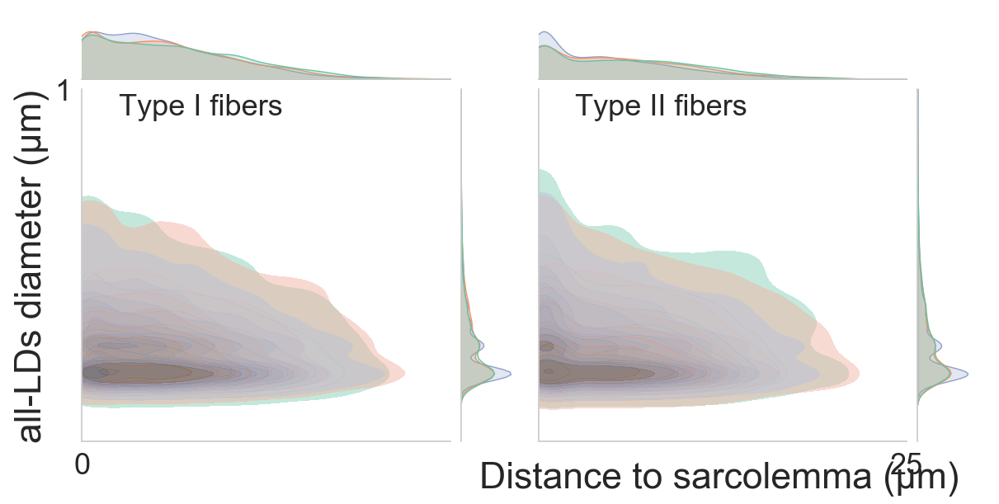

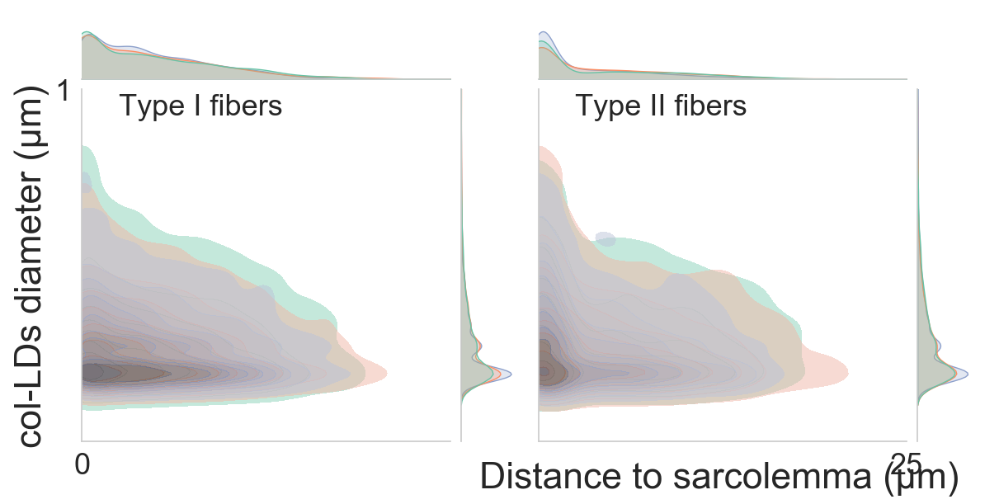

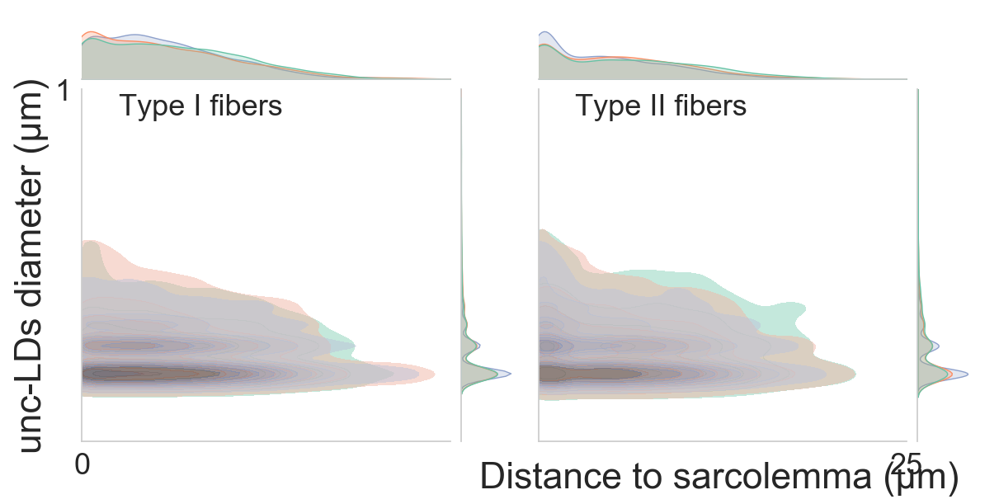

In [30]:
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
import matplotlib.gridspec as gridspec
import seabornfig2grid as sfg

plt.style.use('default')
sns.set()
sns.set_style("whitegrid", {'axes.grid' : False})
sns.set_palette('Set2')

#VARIABLES TO TWEAK!
fract = 0.1 #sample fraction. Use this or samp_sz
rs = 1 #random state
samp_szS = 500 #Sample size to randomly pick from each subject/cell type (500 ideal)
samp_szG = 3000 #Sample size to randomly pick from each group/cell type (3000 ideal)
Psize = 0 #minimum particle size included in KDE figure

#The real thing. Variables to iterate through
particles = ['LD', 'COLOC', 'FREE']
p_labels = ['all-LDs', 'col-LDs', 'unc-LDs']

vars_1 =['PDist']
v1_labels = 'Distance to sarcolemma (μm)'
vars_2 = ['diameter (μm)']
cells = [1, 2]
gp_ord = ['Diabetic', 'Obese', 'Controls']

for l, p in enumerate(particles):
    for i, v1 in enumerate(vars_1):
        for j, v2 in enumerate (vars_2):
            var_pair = [('{} {}'.format(p, v1), v2)]
            for vp in var_pair:
              
                #In this 6 lines we are just trying to prepare the figure in order for no line being truncated
                #by determining the min and max values to be plotted
                ctr = particle_table["PSize"][particle_table['Group'] == 'Controls']
                t2d = particle_table["PSize"][particle_table['Group'] == 'Diabetic']
                obe = particle_table["PSize"][particle_table['Group'] == 'Obese']
                all_values_to_plot = pd.concat([ctr, t2d, obe])                
                min_val = np.min(all_values_to_plot)
                max_val = np.max(all_values_to_plot)
                safe_marg = (max_val-min_val)*0.1
                
                
                #Now making the actual figures
                fg = plt.figure(figsize=(12,6), constrained_layout=True)
                plt.xlabel('                                           Distance to sarcolemma (μm)', fontsize = 32)
                #plt.ylabel(v2, fontsize = 26)
                plt.xticks([])
                plt.yticks([])
                axes = plt.gca()
                axes.spines['right'].set_visible(False)
                axes.spines['left'].set_visible(False)
                axes.spines['bottom'].set_visible(False)
                axes.spines['top'].set_visible(False)
                
                gs = gridspec.GridSpec(1, 2)
                
                
                sub_rand_list = []
                for k, c in enumerate(cells):
                    grp_rand_list = []
                    for gp in gp_ord:      
                        subjs = particle_table[(particle_table['Group'] == gp)].subject.unique() #list unique subjects from given group
                        for sub in subjs:
                            #here it takes a random samp_sz from each subject
                            subj_rand = particle_table[(particle_table['Group'] == gp)
                            & (particle_table['PSize']> Psize)
                            & (particle_table['CType'] == c)
                            & (particle_table['PType'] == p)
                            & (particle_table['subject'] == sub)].sample(n=samp_szS, replace=True, axis ='index', random_state=rs)

                            sub_rand_list.append(subj_rand)
                            
                        sub_rand_df = pd.concat(sub_rand_list)
                        #here it takes a random sample from each group after random samples were taken from each subject
                        grp_rand = sub_rand_df[(sub_rand_df['Group'] == gp)
                        & (sub_rand_df['PSize']> Psize)
                        & (sub_rand_df['CType'] == c)
                        & (sub_rand_df['PType'] == p)].sample(n=samp_szG, replace=False, axis ='index', random_state=rs)

                        grp_rand_list.append(grp_rand)
                            
                    data = pd.concat(grp_rand_list)

                    # Draw a contour plot to represent each bivariate density
                    g = sns.jointplot(
                        data=data,
                        x="PDist",
                        y="PSize",
                        hue="Group",
                        kind="kde",
                        fill=True,
                        alpha=0.5,
                        hue_order=gp_ord,
                        legend = False
                    )

                    if c is 1: 
                        kde1 = g  
                        kde1.set_axis_labels(xlabel='', ylabel='')
                        kde1.ax_joint.set_xticks([0])
                        kde1.ax_joint.set_yticks([1+Psize])
                        kde1.ax_joint.set_ylim([0, 1+Psize])
                        kde1.ax_joint.set_xlim([0, 25])
                        kde1.ax_joint.set_xticklabels([0],fontsize=26)
                        kde1.ax_joint.set_yticklabels([1+Psize],fontsize=26)
                        kde1.ax_joint.annotate('Type I fibers',
                            xy=(0.1, 0.95), xycoords='axes fraction',
                            ha='left', va='center', size=26)
                        kde1.ax_joint.set_xlabel(' ', fontsize=5)
                        kde1.ax_joint.set_ylabel('{} {}'.format(p_labels[l], v2), fontsize=32)
                        
                        k1 = sfg.SeabornFig2Grid(kde1, fg, gs[0])

                    else: 
                        kde2 = g 
                        kde2.set_axis_labels(xlabel='', ylabel='')
                        kde2.ax_joint.set_xticks([25])
                        kde2.ax_joint.set_xticklabels([25],fontsize=26)
                        kde2.ax_joint.set_yticks([])
                        kde2.ax_joint.set_ylim([0, 1+Psize])
                        kde2.ax_joint.set_xlim([0, 25])
                        kde2.ax_joint.annotate('Type II fibers',
                            xy=(0.1, 0.95), xycoords='axes fraction',
                            ha='left', va='center', size=26)
                        kde2.ax_joint.set_xlabel(' ', fontsize=5)
                        
                        k2 = sfg.SeabornFig2Grid(kde2, fg, gs[1])
                    
                    gs.tight_layout(fg)
                        

            
                
                '''#We can only edit the axis labels and ticks now due to the SeabornFig2Grid, this is a workaround
                kde1.set_axis_labels(xlabel='', ylabel='')
                kde1.ax_joint.set_xticks([0])
                kde1.ax_joint.set_yticks([1+Psize])
                kde1.ax_joint.set_ylim([0.2, 1+Psize])
                kde1.ax_joint.set_xlim([0, 25])
                kde1.ax_joint.set_xticklabels([0],fontsize=26)
                kde1.ax_joint.set_yticklabels([1+Psize],fontsize=26)
                kde1.ax_joint.annotate('Type I fibers',
                    xy=(0.1, 0.95), xycoords='axes fraction',
                    ha='left', va='center', size=20)
                kde1.ax_joint.set_xlabel(' ', fontsize=26)
                kde1.ax_joint.set_ylabel('{} {}'.format(p_labels[l], v2), fontsize=28)
                
                kde2.set_axis_labels(xlabel='', ylabel='')
                kde2.ax_joint.set_xticks([25])
                kde2.ax_joint.set_xticklabels([25],fontsize=26)
                kde2.ax_joint.set_yticks([])
                kde2.ax_joint.set_ylim([0, 1+Psize])
                kde2.ax_joint.set_xlim([0, 25])
                kde2.ax_joint.annotate('Type II fibers',
                    xy=(0.1, 0.95), xycoords='axes fraction',
                    ha='left', va='center', size=20)
                kde2.ax_joint.set_xlabel(' ', fontsize=26)
                '''

                #So hard to make these labels work on kdeplot in seaborn!   
                labels = ['T2D', 'OB', 'LC']
                pal = sns.color_palette("Set2")
                label_patches = []
                for i, ii in enumerate(labels):
                    label_patch = mpatches.Patch(
                        color=sns.color_palette("Set2")[i],
                        label=labels[i])
                    label_patches.append(label_patch)
                #plt.legend(handles=label_patches, loc='upper right', bbox_to_anchor=(0.15, 1), fontsize=24, frameon=False)
                
                #fg.tight_layout()
                directory = r'D:\VASCO\Diabetic_study_for_TOPOCELL\Figures_data presentation\python\distances'
                #plt.savefig(r'{}\KDE_{}_{}_{}_{}PSize_{}LDspersubject_{}LDspergroup.png'.format(directory, p, v1, v2, Psize, samp_szS, samp_szG), dpi=300, bbox_inches='tight')
                plt.savefig(r'{}\KDE_{}_{}_{}_{}PSize_{}LDspersubject_{}LDspergroup.pdf'.format(directory, p, v1, v2, Psize, samp_szS, samp_szG), dpi=300, bbox_inches='tight')

In [1]:
#Try the same as above but with randomly selected LDs from each subject, equally

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

plt.style.use('default')
sns.set()
sns.set_style("whitegrid", {'axes.grid' : False})
sns.set_palette('Set2')


#VARIABLES TO TWEAK!
fract = 0.1 #sample fraction. Use this or samp_sz
rs = 1 #random state
samp_sz = 500 #Sample size to randomly pick from each group/cell type. Five thousand is the number to use (500)
Psize = 0 #minimum particle size included in KDE figure


#The real thing. Variables to iterate through
particles = ['LD', 'COLOC', 'FREE']
p_labels = ['All LDs', 'Colocalized LDs', 'Stripped LDs']

vars_1 =['PDist']
v1_labels = 'Distance to sarcolemma (μm)'
vars_2 = ['diameter (μm)']
cells = [1, 2]
gp_ord = ['Diabetic', 'Obese', 'Controls']



for l, p in enumerate(particles):
    for i, v1 in enumerate(vars_1):
        for j, v2 in enumerate (vars_2):
            var_pair = [('{} {}'.format(p, v1), v2)]
            for vp in var_pair:

                fig = plt.figure(figsize=(12,6))
                plt.xlabel('{}'.format(v1_labels), fontsize = 26)
                plt.ylabel('{} {}'.format(p_labels[l], v2), fontsize = 26)
                plt.xticks([0])
                plt.yticks([1])
                plt.tick_params(labelsize=20)
                #ax.set_yticks([0.2,1])
                axes = plt.gca()
                axes.spines['right'].set_visible(False)
                axes.spines['left'].set_visible(False)
                axes.spines['bottom'].set_visible(False)
                axes.spines['top'].set_visible(False)

                
                #In this 6 lines we are just trying to prepare the figure in order for no line being truncated
                #by determining the min and max values to be plotted
                ctr = particle_table["PSize"][particle_table['Group'] == 'Controls']
                t2d = particle_table["PSize"][particle_table['Group'] == 'Diabetic']
                obe = particle_table["PSize"][particle_table['Group'] == 'Obese']
                all_values_to_plot = pd.concat([ctr, t2d, obe])                
                min_val = np.min(all_values_to_plot)
                max_val = np.max(all_values_to_plot)
                safe_marg = (max_val-min_val)*0.1
                      
                sub_rand_list = []
                for gp in gp_ord:      
                    for k, c in enumerate(cells):
                        subjs = particle_table[(particle_table['Group'] == gp)].subject.unique() #list unique subjects from given group
                        for sub in subjs:
                            #here it takes a random samp_sz from each subject
                            temp_rand = particle_table[(particle_table['Group'] == gp)
                            & (particle_table['PSize']> Psize)
                            & (particle_table['CType'] == c)
                            & (particle_table['PType'] == p)
                            & (particle_table['subject'] == sub)].sample(n=samp_sz, replace=True, axis ='index', random_state=rs)

                            sub_rand_list.append(temp_rand)
                    

                        eq_rand = pd.concat(sub_rand_list)

                        data = eq_rand

                        ax = fig.add_subplot(1, 2, k+1)

                        # Draw a contour plot to represent each bivariate density
                        g = sns.kdeplot(
                            data=data,
                            x="PDist",
                            y="PSize",
                            hue='Group',
                            fill=True,
                            alpha=0.5,
                            legend = False,
                            hue_order=gp_ord
                        )

                        ax.set(ylim=(0.2, 1))
                        ax.set(xlim=(0, 25))
                        ax.set_ylabel('', fontsize = 22)
                        ax.set_xlabel('' ,fontsize = 22)
                        ax.text(0.95, 0.65, 'Type {} fibers'.format(c), horizontalalignment='right', 
                                                 verticalalignment='center', transform=ax.transAxes, fontsize=18)

                        axes_ = plt.gca()
                        axes_.spines['right'].set_visible(False)
                        axes_.spines['left'].set_visible(True)
                        axes_.spines['bottom'].set_visible(True)
                        axes_.spines['top'].set_visible(False)
                        plt.xticks([])
                        plt.yticks([])
                        ax.tick_params(labelsize=20)
                        

                    ax.set_xticks([25])

                    #So hard to make these labels work on kdeplot in seaborn!   
                    labels = ['T2D', 'OB', 'LC']
                    pal = sns.color_palette("Set2")
                    label_patches = []
                    for i, ii in enumerate(labels):
                        label_patch = mpatches.Patch(
                            color=sns.color_palette("Set2")[i],
                            label=labels[i])
                        label_patches.append(label_patch)
                    plt.legend(handles=label_patches, loc='upper right', fontsize=18, frameon=False)


                    directory = r'D:\VASCO\Diabetic_study_for_TOPOCELL\Figures_data presentation\python\distances'
                    plt.savefig(r'{}\KDE_{}_{}_{}_{}PSize_{}samplePerSubject.png'.format(directory, p, v1, v2, Psize, samp_sz), dpi=300)
                    plt.savefig(r'{}\KDE_{}_{}_{}_{}PSize_{}samplePerSubject.pdf'.format(directory, p, v1, v2, Psize, samp_sz), dpi=300)


NameError: name 'particle_table' is not defined

In [2]:
from scipy.stats import sem

#Lets count cells per subject'
particle_table = particle_table.rename(columns={"C#":"CNum"})
gp_ord = ['Diabetic', 'Obese', 'Controls']
for gp in gp_ord: 
    grp_cell_count = []
    subjs = particle_table[(particle_table['Group'] == gp)].subject.unique() #list unique subjects from given group
    for sub in subjs:
        #here it takes a random samp_sz from each subject
        subj_cells = particle_table[(particle_table['Group'] == gp)
        & (particle_table['subject'] == sub)]
        
        subj_cells = len(subj_cells.CNum.unique())    
        grp_cell_count.append(subj_cells)
        grp_mean = sum(grp_cell_count)/len(grp_cell_count)
        
    print('The {} group has an average of {} +/- {} cells per subject'.format(gp, round(grp_mean, 3), round(sem(grp_cell_count), 3)))    
    #print({}.format(gp, ))

The Diabetic group has an average of 32.4 +/- 7.131 cells per subject
The Obese group has an average of 41.375 +/- 9.453 cells per subject
The Controls group has an average of 88.143 +/- 19.915 cells per subject


In [11]:
import pandas as pd

#Here we will try to create new variables in each subject and group acording to the size and distance of LDs, 
#then merge it with the ready main dataframe for correlations


#The real thing. Variables to iterate through
particles = ['COLOC', 'FREE']
p_labels = ['col-LDs', 'unc-LDs']

#VARIABLES TO TWEAK! Tupes of size and distance
trim_list = [(0.3, 0), (0.5, 0), (0.75, 0), (0.8, 0)]

for tr in trim_list:
    Psize = tr[0] #minimum particle size included in analysis
    Pdist = tr[1] #minimum particle distance included in analysis

    vars_1 =['PDist']
    v1_labels = 'Distance to sarcolemma (μm)'
    vars_2 = ['diameter (μm)']
    cellTyp = [1, 2]
    cellType = ['I', 'II']
    gp_ord = ['Diabetic', 'Obese', 'Controls']

    new_part_ready = pd.DataFrame()

    for l, p in enumerate(particles): 
        #ready['special_s{}_d{}_{} avg_vol_per_cell'.format(Psize, Pdist, p)] = ''
        #ready['special_s{}_d{}_{} avg_vol_per_part'.format(Psize, Pdist, p)] = ''
        #ready['special_s{}_d{}_{} totvol'.format(Psize, Pdist, p)] = ''
        ready['special_s{}_d{}_{} dist'.format(Psize, Pdist, p)] = ''
        subj_list = []
        for k, c in enumerate(cellTyp):
            grp_rand_list = []
            for gp in gp_ord:      
                subjs = particle_table[(particle_table['Group'] == gp)].subject.unique() #list unique subjects from given group
                for sub in subjs:
                    cells = particle_table[(particle_table['subject'] == sub)].CNum.unique() #list unique cells from given subject
                    c_part_vol_list = []
                    c_part_totvol_list = []
                    c_part_dist_list = []
                    c_part_num_list = []
                    for cl in cells:
                        c_parts = particle_table[(particle_table['CNum'] == cl)
                        & (particle_table['PSize']> Psize) 
                        & (particle_table['PDist']> Pdist)
                        & (particle_table['CType'] == c)
                        & (particle_table['PType'] == p)
                        & (particle_table['subject'] == sub)]

                        if len(c_parts['PSize']) > 0:
                            c_part_vol = c_parts['PSize'].mean()
                            c_part_dist = c_parts['PDist'].mean()
                            c_part_num = len(c_parts['PSize'])

                            #print(cl, type(c_part_vol))

                            c_part_vol_list.append(c_part_vol)
                            c_v_l = [x for x in c_part_vol_list if x != 'nan']
                            c_part_dist_list.append(c_part_dist)
                            c_d_l = [x for x in c_part_dist_list if x != 'nan']
                            c_part_totvol_list.append(c_parts['PSize'].sum())
                            c_part_num_list.append(c_part_num)

                            #print(c_part_num, c_parts['PSize'].sum())
                    
                    
                    print(sub, gp)
                    print(sum(c_part_totvol_list), sum(c_part_num_list))
                    print(sum(c_v_l), len(c_v_l))
                    print(sum(c_part_totvol_list), len(cells))
                    
                    avg_dist_per_cell = sum(c_d_l)/len(c_d_l) #average distance of particle
                    
                    """"
                    avg_vol_per_cell = sum(c_v_l)/len(c_v_l) #average volume of particle
                    if sum(c_part_totvol_list) == 0:
                        avg_vol_per_part = 0
                        tot_vol = 0
                    else:
                        avg_vol_per_part = sum(c_part_totvol_list)/sum(c_part_num_list)
                        tot_vol = sum(c_part_totvol_list)/len(cells) #total volume of particles per number of cells
                    

                    #print('subject {} from the {} group has a {} volume of an average of {} in type {} fibers'.format(sub, gp, p, avg_vol, c))
                    
                    ready['special_s{}_d{}_{} avg_vol_per_cell'.format(Psize, Pdist, p)][(ready['subject'] == sub)
                          & (ready['group'] == gp)
                          & (ready['cell type'] == cellType[c-1])] = avg_vol_per_cell
                    
                    ready['special_s{}_d{}_{} avg_vol_per_part'.format(Psize, Pdist, p)][(ready['subject'] == sub)
                          & (ready['group'] == gp)
                          & (ready['cell type'] == cellType[c-1])] = avg_vol_per_part

                    ready['special_s{}_d{}_{} totvol'.format(Psize, Pdist, p)][(ready['subject'] == sub)
                          & (ready['group'] == gp)
                          & (ready['cell type'] == cellType[c-1])] = tot_vol 
                    """
                    
                    ready['special_s{}_d{}_{} dist'.format(Psize, Pdist, p)][(ready['subject'] == sub)
                          & (ready['group'] == gp)
                          & (ready['cell type'] == cellType[c-1])] = avg_dist_per_cell 

01 Diabetic
1312.3386308720321 2775
9.819633996987365 22
1312.3386308720321 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Diabetic
129.44956942430832 333
6.72926030281693 17
129.44956942430832 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Diabetic
835.9622281324179 2057
21.36986577383253 52
835.9622281324179 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Diabetic
688.2152584549285 1727
20.188400188013397 52
688.2152584549285 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Diabetic
503.5522828588092 1275
18.857726033775634 50
503.5522828588092 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Diabetic
1517.6896740338318 3749
34.24515740458034 85
1517.6896740338318 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Diabetic
1794.128295921728 4243
48.24713718365569 115
1794.128295921728 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Diabetic
767.1195348482156 1775
17.248845962224003 41
767.1195348482156 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


12 Diabetic
70.60994140516739 185
2.3786474296339613 6
70.60994140516739 9


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


14 Diabetic
59.1500825850074 150
6.883286491412629 18
59.1500825850074 34


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Obese
1312.3386308720321 2775
9.819633996987365 22
1312.3386308720321 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


02 Obese
263.0365087260462 647
14.932200794716092 37
263.0365087260462 89


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Obese
835.9622281324179 2057
21.36986577383253 52
835.9622281324179 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Obese
688.2152584549285 1727
20.188400188013397 52
688.2152584549285 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Obese
503.5522828588092 1275
18.857726033775634 50
503.5522828588092 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Obese
1517.6896740338318 3749
34.24515740458034 85
1517.6896740338318 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Obese
1794.128295921728 4243
48.24713718365569 115
1794.128295921728 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Obese
767.1195348482156 1775
17.248845962224003 41
767.1195348482156 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Controls
1312.3386308720321 2775
9.819633996987365 22
1312.3386308720321 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Controls
129.44956942430832 333
6.72926030281693 17
129.44956942430832 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


04 Controls
684.8717134087789 1724
23.368771133830634 59
684.8717134087789 115


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Controls
688.2152584549285 1727
20.188400188013397 52
688.2152584549285 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Controls
503.5522828588092 1275
18.857726033775634 50
503.5522828588092 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Controls
1517.6896740338318 3749
34.24515740458034 85
1517.6896740338318 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Controls
1794.128295921728 4243
48.24713718365569 115
1794.128295921728 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Diabetic
1758.9679951880764 3951
12.901790877192255 30
1758.9679951880764 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Diabetic
37.656113429373555 86
6.961748202891767 16
37.656113429373555 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Diabetic
156.5888121893917 392
16.849198323717378 42
156.5888121893917 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Diabetic
517.3638184397187 1216
23.957328393758146 60
517.3638184397187 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Diabetic
203.23625800044488 486
17.689980434874524 42
203.23625800044488 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Diabetic
330.8422097166535 824
24.14660138330072 60
330.8422097166535 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Diabetic
402.05565430048074 1001
26.52436155492859 66
402.05565430048074 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Diabetic
85.77886835079818 207
8.923482950548072 21
85.77886835079818 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


12 Diabetic
27.09724362843858 67
0.7839702300015641 2
27.09724362843858 9


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


14 Diabetic
20.81245489103855 48
4.698550418730959 11
20.81245489103855 34


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Obese
1758.9679951880764 3951
12.901790877192255 30
1758.9679951880764 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


02 Obese
170.53110662619082 410
17.11475638851763 43
170.53110662619082 89


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Obese
156.5888121893917 392
16.849198323717378 42
156.5888121893917 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Obese
517.3638184397187 1216
23.957328393758146 60
517.3638184397187 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Obese
203.23625800044488 486
17.689980434874524 42
203.23625800044488 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Obese
330.8422097166535 824
24.14660138330072 60
330.8422097166535 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Obese
402.05565430048074 1001
26.52436155492859 66
402.05565430048074 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Obese
85.77886835079818 207
8.923482950548072 21
85.77886835079818 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Controls
1758.9679951880764 3951
12.901790877192255 30
1758.9679951880764 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Controls
37.656113429373555 86
6.961748202891767 16
37.656113429373555 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


04 Controls
109.70722590404165 274
16.74014165994575 43
109.70722590404165 115


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Controls
517.3638184397187 1216
23.957328393758146 60
517.3638184397187 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Controls
203.23625800044488 486
17.689980434874524 42
203.23625800044488 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Controls
330.8422097166535 824
24.14660138330072 60
330.8422097166535 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Controls
402.05565430048074 1001
26.52436155492859 66
402.05565430048074 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Diabetic
1927.67562427886 4344
9.367906103028947 22
1927.67562427886 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Diabetic
522.9779896132989 1409
6.288244675238404 17
522.9779896132989 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Diabetic
701.5688523504277 1875
17.879129678441327 49
701.5688523504277 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Diabetic
367.01721817489033 992
15.604398477841295 43
367.01721817489033 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Diabetic
2626.4191200710416 6805
18.98427018181587 51
2626.4191200710416 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Diabetic
1914.528968276483 5085
31.582436277081587 86
1914.528968276483 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Diabetic
1432.1133917342397 3852
40.5753244359591 114
1432.1133917342397 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Diabetic
831.7920691216016 2082
16.242024478900984 41
831.7920691216016 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


12 Diabetic
30.171679145149547 83
2.175283766065162 6
30.171679145149547 9


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


14 Diabetic
120.00643091106754 326
6.64873292204609 18
120.00643091106754 34


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Obese
1927.67562427886 4344
9.367906103028947 22
1927.67562427886 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


02 Obese
659.4574660638206 1517
15.123935686424902 37
659.4574660638206 89


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Obese
701.5688523504277 1875
17.879129678441327 49
701.5688523504277 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Obese
367.01721817489033 992
15.604398477841295 43
367.01721817489033 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Obese
2626.4191200710416 6805
18.98427018181587 51
2626.4191200710416 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Obese
1914.528968276483 5085
31.582436277081587 86
1914.528968276483 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Obese
1432.1133917342397 3852
40.5753244359591 114
1432.1133917342397 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Obese
831.7920691216016 2082
16.242024478900984 41
831.7920691216016 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Controls
1927.67562427886 4344
9.367906103028947 22
1927.67562427886 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Controls
522.9779896132989 1409
6.288244675238404 17
522.9779896132989 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


04 Controls
182.2455906149544 521
20.176475387024364 57
182.2455906149544 115


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Controls
367.01721817489033 992
15.604398477841295 43
367.01721817489033 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Controls
2626.4191200710416 6805
18.98427018181587 51
2626.4191200710416 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Controls
1914.528968276483 5085
31.582436277081587 86
1914.528968276483 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Controls
1432.1133917342397 3852
40.5753244359591 114
1432.1133917342397 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Diabetic
1249.0603297772918 3100
11.657782423209047 30
1249.0603297772918 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Diabetic
204.68509422935 519
8.155294619948753 21
204.68509422935 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Diabetic
494.6472591048852 1312
15.389580163808809 41
494.6472591048852 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Diabetic
488.4092804625276 1244
20.962370056120367 57
488.4092804625276 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Diabetic
1809.7049360090532 4512
19.679076432071792 51
1809.7049360090532 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Diabetic
802.4759389005256 2028
25.70621618091452 68
802.4759389005256 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Diabetic
600.8408584063712 1578
24.812778527968323 68
600.8408584063712 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Diabetic
491.35560330327655 1149
11.634624707210829 28
491.35560330327655 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


12 Diabetic
37.235675083749115 103
1.0579445343348803 3
37.235675083749115 9


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


14 Diabetic
85.6171604351089 222
5.471204171947832 14
85.6171604351089 34


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Obese
1249.0603297772918 3100
11.657782423209047 30
1249.0603297772918 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


02 Obese
822.6144912910953 1868
22.046491775873346 51
822.6144912910953 89


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Obese
494.6472591048852 1312
15.389580163808809 41
494.6472591048852 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Obese
488.4092804625276 1244
20.962370056120367 57
488.4092804625276 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Obese
1809.7049360090532 4512
19.679076432071792 51
1809.7049360090532 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Obese
802.4759389005256 2028
25.70621618091452 68
802.4759389005256 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Obese
600.8408584063712 1578
24.812778527968323 68
600.8408584063712 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Obese
491.35560330327655 1149
11.634624707210829 28
491.35560330327655 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Controls
1249.0603297772918 3100
11.657782423209047 30
1249.0603297772918 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Controls
204.68509422935 519
8.155294619948753 21
204.68509422935 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


04 Controls
63.44396944579937 177
16.07773038484854 44
63.44396944579937 115


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Controls
488.4092804625276 1244
20.962370056120367 57
488.4092804625276 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Controls
1809.7049360090532 4512
19.679076432071792 51
1809.7049360090532 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Controls
802.4759389005256 2028
25.70621618091452 68
802.4759389005256 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Controls
600.8408584063712 1578
24.812778527968323 68
600.8408584063712 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Diabetic
643.3511929164965 1057
12.775364954281724 21
643.3511929164965 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Diabetic
18.124180455726187 31
6.418938849399214 11
18.124180455726187 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Diabetic
175.41851223974038 310
24.124331539729084 43
175.41851223974038 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Diabetic
130.0282663820034 222
18.8225270068478 33
130.0282663820034 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Diabetic
91.87551774453857 160
15.87793309379181 28
91.87551774453857 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Diabetic
304.3440200611407 541
40.91409818644254 72
304.3440200611407 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Diabetic
499.34927323619615 882
58.773098312490546 104
499.34927323619615 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Diabetic
256.2089118662848 440
19.50151951090332 34
256.2089118662848 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


12 Diabetic
10.421433423677698 19
2.691742738878908 5
10.421433423677698 9


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


14 Diabetic
9.786942584027692 15
4.952701449608666 7
9.786942584027692 34


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Obese
643.3511929164965 1057
12.775364954281724 21
643.3511929164965 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


02 Obese
51.77989549678462 91
12.390077679558837 22
51.77989549678462 89


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Obese
175.41851223974038 310
24.124331539729084 43
175.41851223974038 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Obese
130.0282663820034 222
18.8225270068478 33
130.0282663820034 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Obese
91.87551774453857 160
15.87793309379181 28
91.87551774453857 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Obese
304.3440200611407 541
40.91409818644254 72
304.3440200611407 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Obese
499.34927323619615 882
58.773098312490546 104
499.34927323619615 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Obese
256.2089118662848 440
19.50151951090332 34
256.2089118662848 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Controls
643.3511929164965 1057
12.775364954281724 21
643.3511929164965 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Controls
18.124180455726187 31
6.418938849399214 11
18.124180455726187 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


04 Controls
107.44876699049314 195
25.43591037842517 46
107.44876699049314 115


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Controls
130.0282663820034 222
18.8225270068478 33
130.0282663820034 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Controls
91.87551774453857 160
15.87793309379181 28
91.87551774453857 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Controls
304.3440200611407 541
40.91409818644254 72
304.3440200611407 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Controls
499.34927323619615 882
58.773098312490546 104
499.34927323619615 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Diabetic
670.975870344642 1117
16.732806934870965 29
670.975870344642 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Diabetic
14.33649479923512 24
5.810177354577022 10
14.33649479923512 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Diabetic
24.76891122278466 44
13.439393938336792 24
24.76891122278466 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Diabetic
158.10323356502187 275
17.59726016822326 31
158.10323356502187 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Diabetic
55.316353917441944 95
16.623539612088894 28
55.316353917441944 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Diabetic
63.75214204239169 114
21.38437489941502 38
63.75214204239169 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Diabetic
65.63959095632914 118
21.885405102107214 39
65.63959095632914 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Diabetic
22.673700884768042 40
7.893457999342797 14
22.673700884768042 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


12 Diabetic
7.098661405332683 13
1.056436530846031 2
7.098661405332683 9


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


14 Diabetic
6.783428066947515 12
3.3826584457873943 6
6.783428066947515 34


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Obese
670.975870344642 1117
16.732806934870965 29
670.975870344642 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


02 Obese
45.62732551069174 78
15.412391632283258 27
45.62732551069174 89


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Obese
24.76891122278466 44
13.439393938336792 24
24.76891122278466 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Obese
158.10323356502187 275
17.59726016822326 31
158.10323356502187 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Obese
55.316353917441944 95
16.623539612088894 28
55.316353917441944 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Obese
63.75214204239169 114
21.38437489941502 38
63.75214204239169 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Obese
65.63959095632914 118
21.885405102107214 39
65.63959095632914 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Obese
22.673700884768042 40
7.893457999342797 14
22.673700884768042 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Controls
670.975870344642 1117
16.732806934870965 29
670.975870344642 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Controls
14.33649479923512 24
5.810177354577022 10
14.33649479923512 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


04 Controls
23.539313832895793 43
13.091665148796812 24
23.539313832895793 115


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Controls
158.10323356502187 275
17.59726016822326 31
158.10323356502187 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Controls
55.316353917441944 95
16.623539612088894 28
55.316353917441944 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Controls
63.75214204239169 114
21.38437489941502 38
63.75214204239169 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Controls
65.63959095632914 118
21.885405102107214 39
65.63959095632914 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Diabetic
735.9454944219556 1211
12.797012204495378 22
735.9454944219556 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Diabetic
38.23575992645452 67
8.41830230026766 15
38.23575992645452 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Diabetic
68.6378754678057 120
16.200470225911754 29
68.6378754678057 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Diabetic
28.050582267415706 50
5.845492507250581 10
28.050582267415706 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Diabetic
332.40334174480125 583
22.37554398822264 40
332.40334174480125 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Diabetic
156.9868410644815 287
27.97383748005695 52
156.9868410644815 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Diabetic
119.98874203344047 213
17.4019539415329 32
119.98874203344047 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Diabetic
159.33903539959255 267
19.668733097609177 33
159.33903539959255 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


12 Diabetic
1.1434531711638578 2
0.5717265855819289 1
1.1434531711638578 9


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


14 Diabetic
7.385572651994614 12
4.360495054929904 7
7.385572651994614 34


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Obese
735.9454944219556 1211
12.797012204495378 22
735.9454944219556 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


02 Obese
239.28085440137485 402
14.547339897569618 25
239.28085440137485 89


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Obese
68.6378754678057 120
16.200470225911754 29
68.6378754678057 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Obese
28.050582267415706 50
5.845492507250581 10
28.050582267415706 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Obese
332.40334174480125 583
22.37554398822264 40
332.40334174480125 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Obese
156.9868410644815 287
27.97383748005695 52
156.9868410644815 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Obese
119.98874203344047 213
17.4019539415329 32
119.98874203344047 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Obese
159.33903539959255 267
19.668733097609177 33
159.33903539959255 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Controls
735.9454944219556 1211
12.797012204495378 22
735.9454944219556 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Controls
38.23575992645452 67
8.41830230026766 15
38.23575992645452 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


04 Controls
3.8450094664299876 7
3.8450094664299876 7
3.8450094664299876 115


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Controls
28.050582267415706 50
5.845492507250581 10
28.050582267415706 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Controls
332.40334174480125 583
22.37554398822264 40
332.40334174480125 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Controls
156.9868410644815 287
27.97383748005695 52
156.9868410644815 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Controls
119.98874203344047 213
17.4019539415329 32
119.98874203344047 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Diabetic
274.7641086422932 470
15.217776474505003 27
274.7641086422932 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Diabetic
31.489740174195212 52
7.554136420538706 13
31.489740174195212 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Diabetic
53.715139336959986 94
16.596417994450217 29
53.715139336959986 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Diabetic
89.14743260113818 151
10.322144987039119 18
89.14743260113818 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Diabetic
373.3308851361093 646
22.345936631689668 39
373.3308851361093 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Diabetic
134.57755321494625 236
21.36724678491556 38
134.57755321494625 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Diabetic
70.22719678645701 121
11.170293256315508 20
70.22719678645701 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Diabetic
146.346648416053 233
15.314738253877039 25
146.346648416053 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


12 Diabetic
1.14892897813543 2
0.574464489067715 1
1.14892897813543 9


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


14 Diabetic
11.172585020222815 19
4.869150074347121 8
11.172585020222815 34


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Obese
274.7641086422932 470
15.217776474505003 27
274.7641086422932 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


02 Obese
301.15352766708725 498
28.54300816655068 47
301.15352766708725 89


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Obese
53.715139336959986 94
16.596417994450217 29
53.715139336959986 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Obese
89.14743260113818 151
10.322144987039119 18
89.14743260113818 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Obese
373.3308851361093 646
22.345936631689668 39
373.3308851361093 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Obese
134.57755321494625 236
21.36724678491556 38
134.57755321494625 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Obese
70.22719678645701 121
11.170293256315508 20
70.22719678645701 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Obese
146.346648416053 233
15.314738253877039 25
146.346648416053 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Controls
274.7641086422932 470
15.217776474505003 27
274.7641086422932 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Controls
31.489740174195212 52
7.554136420538706 13
31.489740174195212 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


04 Controls
1.7823805152175145 3
1.7823805152175145 3
1.7823805152175145 115


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Controls
89.14743260113818 151
10.322144987039119 18
89.14743260113818 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Controls
373.3308851361093 646
22.345936631689668 39
373.3308851361093 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Controls
134.57755321494625 236
21.36724678491556 38
134.57755321494625 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Controls
70.22719678645701 121
11.170293256315508 20
70.22719678645701 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Diabetic
73.61103399276503 88
10.66983748912741 13
73.61103399276503 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Diabetic
0.7669658855957319 1
0.7669658855957319 1
0.7669658855957319 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Diabetic
5.038784155712773 6
4.203887400499948 5
5.038784155712773 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Diabetic
6.478590584016444 8
5.676412193859428 7
6.478590584016444 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Diabetic
4.308496308551767 5
3.5069797217551177 4
4.308496308551767 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Diabetic
14.901737404995394 18
12.512584343639348 15
14.901737404995394 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Diabetic
12.929250353940178 16
12.029606412332525 15
12.929250353940178 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Diabetic
12.049496123673109 14
8.887364404883872 10
12.049496123673109 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


12 Diabetic
0 0
8.887364404883872 10
0 9


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


14 Diabetic
2.4512446925960534 2
2.4512446925960534 2
2.4512446925960534 34


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Obese
73.61103399276503 88
10.66983748912741 13
73.61103399276503 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


02 Obese
2.3713226659097653 3
2.3713226659097653 3
2.3713226659097653 89


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Obese
5.038784155712773 6
4.203887400499948 5
5.038784155712773 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Obese
6.478590584016444 8
5.676412193859428 7
6.478590584016444 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Obese
4.308496308551767 5
3.5069797217551177 4
4.308496308551767 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Obese
14.901737404995394 18
12.512584343639348 15
14.901737404995394 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Obese
12.929250353940178 16
12.029606412332525 15
12.929250353940178 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Obese
12.049496123673109 14
8.887364404883872 10
12.049496123673109 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Controls
73.61103399276503 88
10.66983748912741 13
73.61103399276503 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Controls
0.7669658855957319 1
0.7669658855957319 1
0.7669658855957319 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


04 Controls
3.208080261862735 4
2.394711122219757 3
3.208080261862735 115


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Controls
6.478590584016444 8
5.676412193859428 7
6.478590584016444 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Controls
4.308496308551767 5
3.5069797217551177 4
4.308496308551767 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Controls
14.901737404995394 18
12.512584343639348 15
14.901737404995394 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Controls
12.929250353940178 16
12.029606412332525 15
12.929250353940178 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Diabetic
85.9255427970142 103
10.880801181794126 13
85.9255427970142 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Diabetic
1.8191375424460392 2
1.8191375424460392 2
1.8191375424460392 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Diabetic
0.879122519137261 1
0.879122519137261 1
0.879122519137261 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Diabetic
7.250847195812227 9
4.822275680346957 6
7.250847195812227 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Diabetic
6.536259394472356 8
5.745933557161669 7
6.536259394472356 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Diabetic
4.177002619273845 5
4.177002619273845 5
4.177002619273845 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Diabetic
2.4367593960213827 3
1.6018626408085574 2
2.4367593960213827 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Diabetic
0 0
1.6018626408085574 2
0 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


12 Diabetic
0 0
1.6018626408085574 2
0 9


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


14 Diabetic
0 0
1.6018626408085574 2
0 34


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Obese
85.9255427970142 103
10.880801181794126 13
85.9255427970142 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


02 Obese
3.7378916729584675 4
2.874681674731287 3
3.7378916729584675 89


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Obese
0.879122519137261 1
0.879122519137261 1
0.879122519137261 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Obese
7.250847195812227 9
4.822275680346957 6
7.250847195812227 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Obese
6.536259394472356 8
5.745933557161669 7
6.536259394472356 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Obese
4.177002619273845 5
4.177002619273845 5
4.177002619273845 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Obese
2.4367593960213827 3
1.6018626408085574 2
2.4367593960213827 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Obese
0 0
1.6018626408085574 2
0 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Controls
85.9255427970142 103
10.880801181794126 13
85.9255427970142 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Controls
1.8191375424460392 2
1.8191375424460392 2
1.8191375424460392 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


04 Controls
0 0
1.8191375424460392 2
0 115


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Controls
7.250847195812227 9
4.822275680346957 6
7.250847195812227 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Controls
6.536259394472356 8
5.745933557161669 7
6.536259394472356 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Controls
4.177002619273845 5
4.177002619273845 5
4.177002619273845 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Controls
2.4367593960213827 3
1.6018626408085574 2
2.4367593960213827 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Diabetic
107.61611808659647 126
10.035457029385237 12
107.61611808659647 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Diabetic
3.231095059599989 4
2.4289166694429722 3
3.231095059599989 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Diabetic
4.828556224699701 6
3.278821049713132 4
4.828556224699701 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Diabetic
1.6043567803140335 2
1.6043567803140335 2
1.6043567803140335 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Diabetic
20.323517626928066 24
11.765817038545736 14
20.323517626928066 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Diabetic
1.5576368768841218 2
1.5576368768841218 2
1.5576368768841218 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Diabetic
4.355849510747011 5
2.685381845108871 3
4.355849510747011 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Diabetic
21.184977198226033 25
13.959693847940658 17
21.184977198226033 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


12 Diabetic
0 0
13.959693847940658 17
0 9


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


14 Diabetic
0.9965574970333758 1
0.9965574970333758 1
0.9965574970333758 34


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Obese
107.61611808659647 126
10.035457029385237 12
107.61611808659647 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


02 Obese
17.31388401440832 20
6.789293926345604 8
17.31388401440832 89


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Obese
4.828556224699701 6
3.278821049713132 4
4.828556224699701 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Obese
1.6043567803140335 2
1.6043567803140335 2
1.6043567803140335 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Obese
20.323517626928066 24
11.765817038545736 14
20.323517626928066 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Obese
1.5576368768841218 2
1.5576368768841218 2
1.5576368768841218 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Obese
4.355849510747011 5
2.685381845108871 3
4.355849510747011 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Obese
21.184977198226033 25
13.959693847940658 17
21.184977198226033 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Controls
107.61611808659647 126
10.035457029385237 12
107.61611808659647 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Controls
3.231095059599989 4
2.4289166694429722 3
3.231095059599989 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


04 Controls
0.7669658855957319 1
0.7669658855957319 1
0.7669658855957319 115


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Controls
1.6043567803140335 2
1.6043567803140335 2
1.6043567803140335 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Controls
20.323517626928066 24
11.765817038545736 14
20.323517626928066 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Controls
1.5576368768841218 2
1.5576368768841218 2
1.5576368768841218 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Controls
4.355849510747011 5
2.685381845108871 3
4.355849510747011 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Diabetic
19.40269822652716 23
6.549072347942302 8
19.40269822652716 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Diabetic
4.70460186682244 4
3.7003065989038535 3
4.70460186682244 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Diabetic
4.187318227534512 5
3.3403520547923025 4
4.187318227534512 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Diabetic
8.492663771627118 10
4.249006627204337 5
8.492663771627118 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Diabetic
25.979061359581895 31
10.750910011944843 13
25.979061359581895 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Diabetic
5.6024177255097545 7
5.6024177255097545 7
5.6024177255097545 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Diabetic
5.8520900805121 7
2.456769804695124 3
5.8520900805121 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Diabetic
23.869744437422302 27
8.885082195802214 10
23.869744437422302 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


12 Diabetic
0 0
8.885082195802214 10
0 9


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


14 Diabetic
0.7906709912883898 1
0.7906709912883898 1
0.7906709912883898 34


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Obese
19.40269822652716 23
6.549072347942302 8
19.40269822652716 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


02 Obese
37.300651791627594 44
15.270625711402808 18
37.300651791627594 89


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Obese
4.187318227534512 5
3.3403520547923025 4
4.187318227534512 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Obese
8.492663771627118 10
4.249006627204337 5
8.492663771627118 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Obese
25.979061359581895 31
10.750910011944843 13
25.979061359581895 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Obese
5.6024177255097545 7
5.6024177255097545 7
5.6024177255097545 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Obese
5.8520900805121 7
2.456769804695124 3
5.8520900805121 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Obese
23.869744437422302 27
8.885082195802214 10
23.869744437422302 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Controls
19.40269822652716 23
6.549072347942302 8
19.40269822652716 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Controls
4.70460186682244 4
3.7003065989038535 3
4.70460186682244 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


04 Controls
0 0
3.7003065989038535 3
0 115


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Controls
8.492663771627118 10
4.249006627204337 5
8.492663771627118 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Controls
25.979061359581895 31
10.750910011944843 13
25.979061359581895 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Controls
5.6024177255097545 7
5.6024177255097545 7
5.6024177255097545 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Controls
5.8520900805121 7
2.456769804695124 3
5.8520900805121 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Diabetic
42.64793730062386 48
8.687344654441743 10
42.64793730062386 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Diabetic
0 0
8.687344654441743 10
0 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Diabetic
1.9472155076371882 2
1.9472155076371882 2
1.9472155076371882 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Diabetic
3.3633168302482015 4
3.3633168302482015 4
3.3633168302482015 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Diabetic
2.750859431667645 3
2.750859431667645 3
2.750859431667645 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Diabetic
7.0898479148821245 8
7.0898479148821245 8
7.0898479148821245 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Diabetic
5.164771075212226 6
4.265127133604572 5
5.164771075212226 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Diabetic
6.585914501732352 7
6.585914501732352 7
6.585914501732352 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


12 Diabetic
0 0
6.585914501732352 7
0 9


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


14 Diabetic
2.4512446925960534 2
2.4512446925960534 2
2.4512446925960534 34


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Obese
42.64793730062386 48
8.687344654441743 10
42.64793730062386 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


02 Obese
0.8136857890256438 1
0.8136857890256438 1
0.8136857890256438 89


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Obese
1.9472155076371882 2
1.9472155076371882 2
1.9472155076371882 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Obese
3.3633168302482015 4
3.3633168302482015 4
3.3633168302482015 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Obese
2.750859431667645 3
2.750859431667645 3
2.750859431667645 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Obese
7.0898479148821245 8
7.0898479148821245 8
7.0898479148821245 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Obese
5.164771075212226 6
4.265127133604572 5
5.164771075212226 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Obese
6.585914501732352 7
6.585914501732352 7
6.585914501732352 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Controls
42.64793730062386 48
8.687344654441743 10
42.64793730062386 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Controls
0 0
8.687344654441743 10
0 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


04 Controls
0.8360672879975657 1
0.8360672879975657 1
0.8360672879975657 115


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Controls
3.3633168302482015 4
3.3633168302482015 4
3.3633168302482015 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Controls
2.750859431667645 3
2.750859431667645 3
2.750859431667645 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Controls
7.0898479148821245 8
7.0898479148821245 8
7.0898479148821245 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Controls
5.164771075212226 6
4.265127133604572 5
5.164771075212226 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Diabetic
47.75158676050688 54
9.031826655831715 10
47.75158676050688 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Diabetic
1.8191375424460392 2
1.8191375424460392 2
1.8191375424460392 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Diabetic
0.879122519137261 1
0.879122519137261 1
0.879122519137261 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Diabetic
4.1355734420439845 5
3.2995061540464192 4
4.1355734420439845 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Diabetic
3.444690746396771 4
3.444690746396771 4
3.444690746396771 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Diabetic
4.177002619273845 5
4.177002619273845 5
4.177002619273845 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Diabetic
0.879122519137261 1
0.879122519137261 1
0.879122519137261 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Diabetic
0 0
0.879122519137261 1
0 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


12 Diabetic
0 0
0.879122519137261 1
0 9


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


14 Diabetic
0 0
0.879122519137261 1
0 34


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Obese
47.75158676050688 54
9.031826655831715 10
47.75158676050688 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


02 Obese
2.9709257873627357 3
2.9709257873627357 3
2.9709257873627357 89


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Obese
0.879122519137261 1
0.879122519137261 1
0.879122519137261 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Obese
4.1355734420439845 5
3.2995061540464192 4
4.1355734420439845 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Obese
3.444690746396771 4
3.444690746396771 4
3.444690746396771 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Obese
4.177002619273845 5
4.177002619273845 5
4.177002619273845 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Obese
0.879122519137261 1
0.879122519137261 1
0.879122519137261 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Obese
0 0
0.879122519137261 1
0 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Controls
47.75158676050688 54
9.031826655831715 10
47.75158676050688 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Controls
1.8191375424460392 2
1.8191375424460392 2
1.8191375424460392 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


04 Controls
0 0
1.8191375424460392 2
0 115


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Controls
4.1355734420439845 5
3.2995061540464192 4
4.1355734420439845 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Controls
3.444690746396771 4
3.444690746396771 4
3.444690746396771 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Controls
4.177002619273845 5
4.177002619273845 5
4.177002619273845 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Controls
0.879122519137261 1
0.879122519137261 1
0.879122519137261 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Diabetic
78.11583784856879 88
9.605969556807079 11
78.11583784856879 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Diabetic
1.6497530770232096 2
1.6497530770232096 2
1.6497530770232096 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Diabetic
1.7369875766241154 2
1.7369875766241154 2
1.7369875766241154 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Diabetic
0.8136857890256438 1
0.8136857890256438 1
0.8136857890256438 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Diabetic
14.11667522508424 16
8.73908818382046 10
14.11667522508424 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Diabetic
0 0
8.73908818382046 10
0 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Diabetic
4.355849510747011 5
2.685381845108871 3
4.355849510747011 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Diabetic
11.910271253999277 13
6.384544527299411 7
11.910271253999277 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


12 Diabetic
0 0
6.384544527299411 7
0 9


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


14 Diabetic
0.9965574970333758 1
0.9965574970333758 1
0.9965574970333758 34


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Obese
78.11583784856879 88
9.605969556807079 11
78.11583784856879 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


02 Obese
12.664678489448612 14
5.337545716647214 6
12.664678489448612 89


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Obese
1.7369875766241154 2
1.7369875766241154 2
1.7369875766241154 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Obese
0.8136857890256438 1
0.8136857890256438 1
0.8136857890256438 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Obese
14.11667522508424 16
8.73908818382046 10
14.11667522508424 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Obese
0 0
8.73908818382046 10
0 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Obese
4.355849510747011 5
2.685381845108871 3
4.355849510747011 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Obese
11.910271253999277 13
6.384544527299411 7
11.910271253999277 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Controls
78.11583784856879 88
9.605969556807079 11
78.11583784856879 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Controls
1.6497530770232096 2
1.6497530770232096 2
1.6497530770232096 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


04 Controls
0 0
1.6497530770232096 2
0 115


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Controls
0.8136857890256438 1
0.8136857890256438 1
0.8136857890256438 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Controls
14.11667522508424 16
8.73908818382046 10
14.11667522508424 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Controls
0 0
8.73908818382046 10
0 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Controls
4.355849510747011 5
2.685381845108871 3
4.355849510747011 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Diabetic
13.172150718990673 15
4.281090300110712 5
13.172150718990673 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Diabetic
4.70460186682244 4
3.7003065989038535 3
4.70460186682244 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Diabetic
2.653386456343049 3
1.806420283600839 2
2.653386456343049 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Diabetic
5.401095123551531 6
3.7006462131183584 4
5.401095123551531 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Diabetic
13.589081661586892 15
7.212137895559381 8
13.589081661586892 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Diabetic
2.4634388660488535 3
2.4634388660488535 3
2.4634388660488535 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Diabetic
3.527487318032247 4
1.7182862986945115 2
3.527487318032247 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Diabetic
18.453573026866867 20
9.123915881446335 10
18.453573026866867 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


12 Diabetic
0 0
9.123915881446335 10
0 9


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


14 Diabetic
0 0
9.123915881446335 10
0 34


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Obese
13.172150718990673 15
4.281090300110712 5
13.172150718990673 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


02 Obese
24.048885785266236 27
10.789840799087665 12
24.048885785266236 89


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


05 Obese
2.653386456343049 3
1.806420283600839 2
2.653386456343049 85


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Obese
5.401095123551531 6
3.7006462131183584 4
5.401095123551531 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Obese
13.589081661586892 15
7.212137895559381 8
13.589081661586892 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Obese
2.4634388660488535 3
2.4634388660488535 3
2.4634388660488535 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Obese
3.527487318032247 4
1.7182862986945115 2
3.527487318032247 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10 Obese
18.453573026866867 20
9.123915881446335 10
18.453573026866867 54


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


01 Controls
13.172150718990673 15
4.281090300110712 5
13.172150718990673 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


03 Controls
4.70460186682244 4
3.7003065989038535 3
4.70460186682244 31


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


04 Controls
0 0
3.7003065989038535 3
0 115


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


06 Controls
5.401095123551531 6
3.7006462131183584 4
5.401095123551531 97


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


07 Controls
13.589081661586892 15
7.212137895559381 8
13.589081661586892 78


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


08 Controls
2.4634388660488535 3
2.4634388660488535 3
2.4634388660488535 119


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


09 Controls
3.527487318032247 4
1.7182862986945115 2
3.527487318032247 165


C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [8]:
pd.set_option('display.max_columns', None)
ready
#ready['special_s0.5_d12_COLOC totvol'] = ready['special_s0.5_d12_COLOC totvol'].astype('float')
#ready['special_s0.5_d12_FREE totvol'] = ready['special_s0.5_d12_FREE totvol'].astype('float')
#ready['special_s0.5_d12_COLOC vol'] = ready['special_s0.5_d12_COLOC vol'].astype('float')
#ready['special_s0.5_d12_FREE vol'] = ready['special_s0.5_d12_FREE vol'].astype('float')

,subject,Age,Weight,BM,FFM,FM,FAT%,TCHOL,HDL,LDL,TAGemia,Glycemia,VO2max,group,#,LD#,CellArea(μm^2),LD density,LD diameter (μm),LD distance to sarcolemma (μm),PLIN5 density,PLIN5 diameter (μm),PLIN5 distance to sarcolemma (μm),COL density,COL diameter (μm),COL distance to sarcolemma (μm),FREE density,FREE diameter (μm),FREE distance to sarcolemma (μm),cell type,special_s0_d12_COLOC avg_vol_per_cell,special_s0_d12_COLOC avg_vol_per_part,special_s0_d12_COLOC totvol,special_s0_d12_FREE avg_vol_per_cell,special_s0_d12_FREE avg_vol_per_part,special_s0_d12_FREE totvol,special_s0.5_d12_COLOC avg_vol_per_cell,special_s0.5_d12_COLOC avg_vol_per_part,special_s0.5_d12_COLOC totvol,special_s0.5_d12_FREE avg_vol_per_cell,special_s0.5_d12_FREE avg_vol_per_part,special_s0.5_d12_FREE totvol,special_s0.75_d10_COLOC avg_vol_per_cell,special_s0.75_d10_COLOC avg_vol_per_part,special_s0.75_d10_COLOC totvol,special_s0.75_d10_FREE avg_vol_per_cell,special_s0.75_d10_FREE avg_vol_per_part,special_s0.75_d10_FREE totvol,special_s0_d15_COLOC avg_vol_per_cell,special_s0_d15_COLOC avg_vol_per_part,special_s0_d15_COLOC totvol,special_s0_d15_FREE avg_vol_per_cell,special_s0_d15_FREE avg_vol_per_part,special_s0_d15_FREE totvol,special_s0.5_d15_COLOC avg_vol_per_cell,special_s0.5_d15_COLOC avg_vol_per_part,special_s0.5_d15_COLOC totvol,special_s0.5_d15_FREE avg_vol_per_cell,special_s0.5_d15_FREE avg_vol_per_part,special_s0.5_d15_FREE totvol,special_s0.8_d20_COLOC avg_vol_per_cell,special_s0.8_d20_COLOC avg_vol_per_part,special_s0.8_d20_COLOC totvol,special_s0.8_d20_FREE avg_vol_per_cell,special_s0.8_d20_FREE avg_vol_per_part,special_s0.8_d20_FREE totvol,special_s0.5_d20_COLOC avg_vol_per_cell,special_s0.5_d20_COLOC avg_vol_per_part,special_s0.5_d20_COLOC totvol,special_s0.5_d20_FREE avg_vol_per_cell,special_s0.5_d20_FREE avg_vol_per_part,special_s0.5_d20_FREE totvol,special_s0_d20_COLOC avg_vol_per_cell,special_s0_d20_COLOC avg_vol_per_part,special_s0_d20_COLOC totvol,special_s0_d20_FREE avg_vol_per_cell,special_s0_d20_FREE avg_vol_per_part,special_s0_d20_FREE totvol,special_s0_d25_COLOC avg_vol_per_cell,special_s0_d25_COLOC avg_vol_per_part,special_s0_d25_COLOC totvol,special_s0_d25_FREE avg_vol_per_cell,special_s0_d25_FREE avg_vol_per_part,special_s0_d25_FREE totvol
0,01,45,160.4,41.67,101.3,59.1,36.8,5.1,1.00,2.8,4.00,11.30,17.20,Diabetic,14,8322,2869.682214,3.171152,0.441281,6.965336,3.052100,0.445155,7.030162,1.453217,0.409806,6.314796,2.105517,0.354995,7.148138,I,0.309977,0.33064,14.078868,0.274917,0.275739,31.8078,0.57764,0.592771,4.03467,0.581487,0.603598,4.26413,0.807365,0.818285,0.607115,0.83111,0.841468,0.9229,0.30719,0.322938,7.53175,0.273178,0.271973,17.2659,0.584249,0.593229,1.89451,0.583852,0.596155,2.09616,0.585917,0,0,0.959454,0.959454,0.0309501,0.609962,0.615957,0.258304,0.602138,0.614726,0.257788,0.308034,0.304869,1.55385,0.251814,0.262834,3.48467,0.255549,0.27668,0.053551,0.219088,0.222759,0.107787
1,03,53,91.3,30.16,67.0,24.3,26.6,6.3,1.10,3.9,3.00,6.00,34.20,Diabetic,8,2713,1138.548375,2.025897,0.294590,4.771078,1.976399,0.318012,4.164264,0.659011,0.293047,3.651158,1.460486,0.251755,4.715950,I,0.244779,0.228423,0.493689,0.239135,0.245818,3.6952,0.57764,0,0,0.579715,0.586937,0.132534,0.807365,0,0,0.790671,0.790671,0.0255055,0.218687,0.218687,0.0211633,0.227706,0.230098,0.304323,0.584249,0,0,0.583852,0,0,0.585917,0,0,0.959454,0,0,0.609962,0,0,0.602138,0,0,0.308034,0,0,0.251814,0,0,0.255549,0,0,0.219088,0,0
2,05,52,92.9,30.30,71.6,21.3,22.9,4.6,1.10,2.6,2.00,6.80,29.10,Diabetic,50,14075,1774.814240,1.115934,0.299617,5.907733,1.157684,0.328468,5.229978,0.587212,0.312763,4.742142,0.675305,0.245834,5.985597,I,0.249473,0.247755,1.955807,0.222714,0.229271,5.24895,0.539737,0.54871,0.0839203,0.589602,0.569394,0.0468912,0.879123,0.879123,0.0103426,0.790671,0,0,0.247589,0.246234,0.651795,0.224933,0.228173,1.79854,0.551666,0.549063,0.0258383,0.603474,0.58379,0.0274724,0.585917,0,0,0.959454,0,0,0.609962,0,0,0.542327,0.542327,0.00638032,0.201,0.212054,0

C:\Devel\Anaconda3\lib\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Devel\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:3152: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=0.0, right=0.0
  'left=%s, right=%s') % (left, right))
C:\Devel\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:3152: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=0.0, right=0.0
  'left=%s, right=%s') % (left, right))
C:\Devel\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:3152: UserWarning: Attempting to set identical left==right results
in singular trans

C:\Devel\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:3152: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=0.0, right=0.0
  'left=%s, right=%s') % (left, right))
C:\Devel\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:3152: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=0.0, right=0.0
  'left=%s, right=%s') % (left, right))
C:\Devel\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:3152: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=0.0, right=0.0
  'left=%s, right=%s') % (left, right))
C:\Devel\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:3152: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=0.0, right=0.0
  'left=%s, right=%s') % (left, right))
C:\Devel\Anaconda3\lib\site-

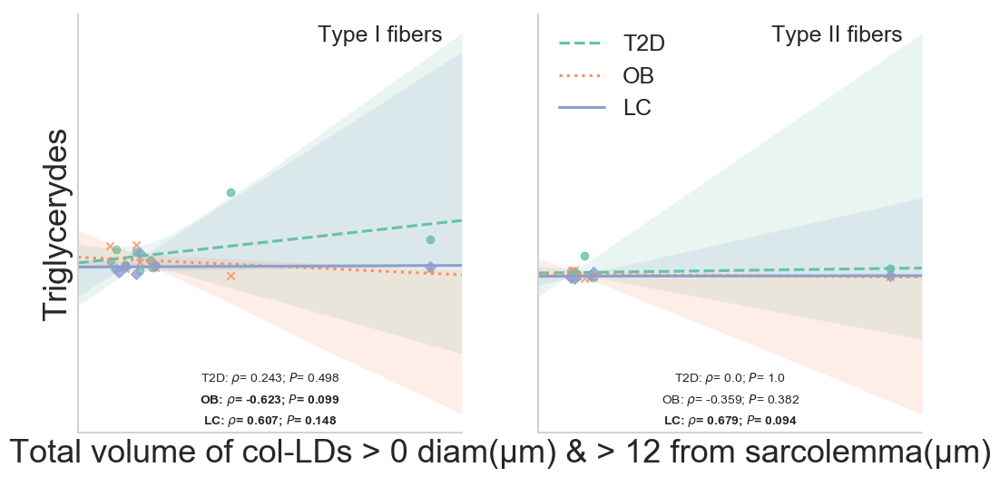

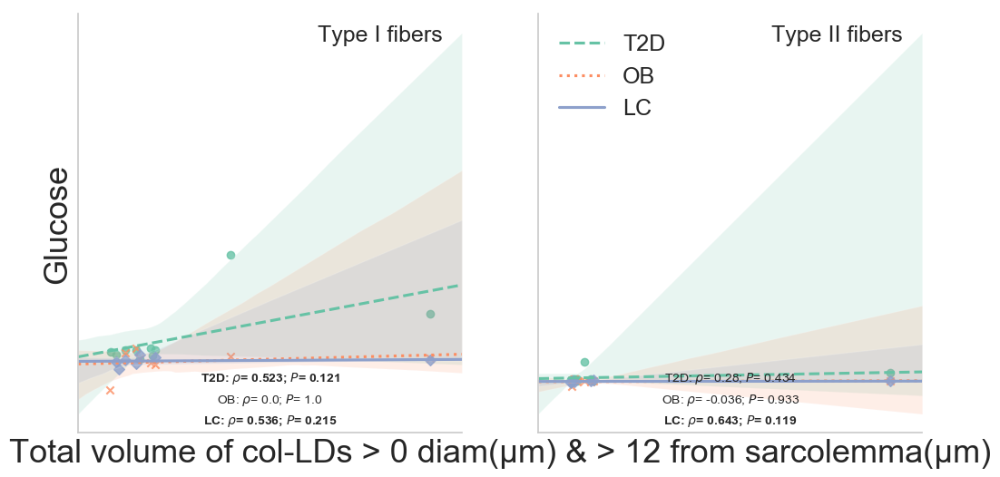

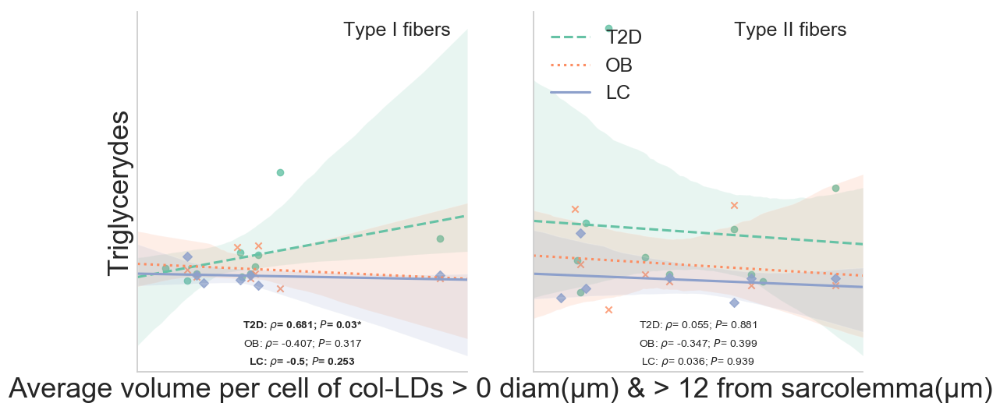

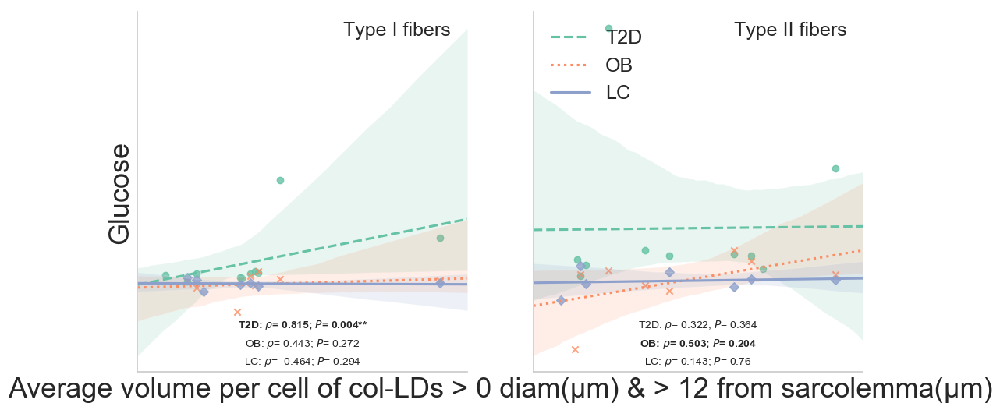

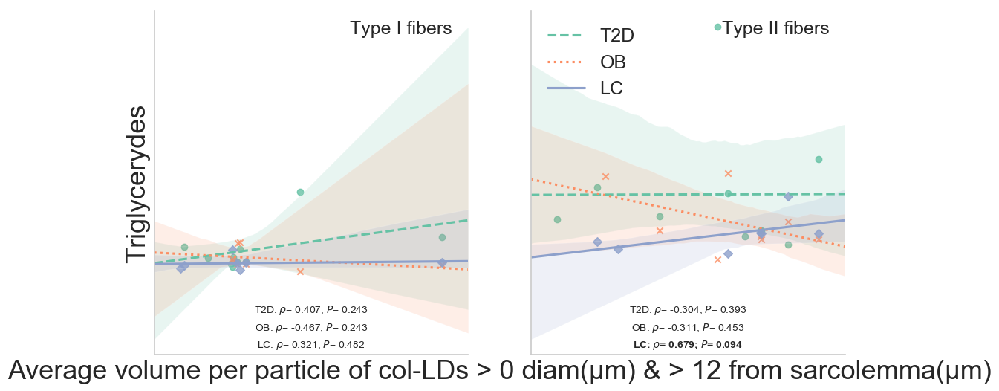

...

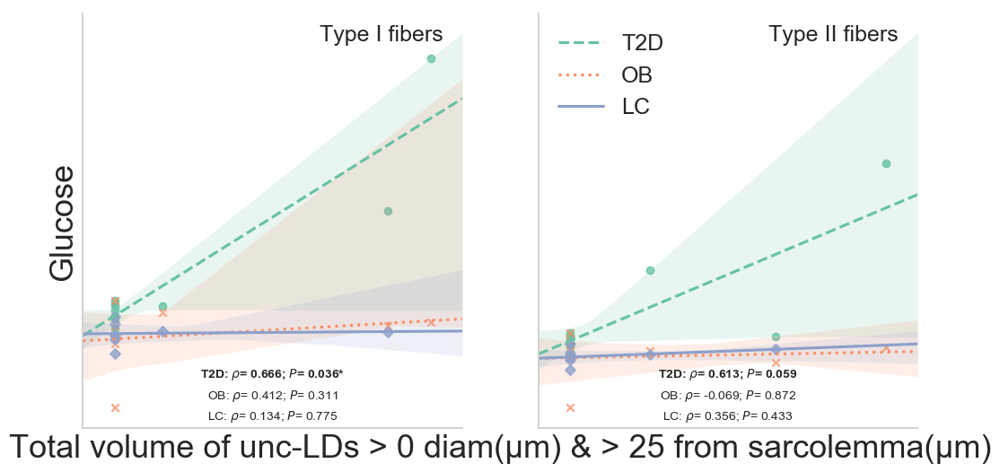

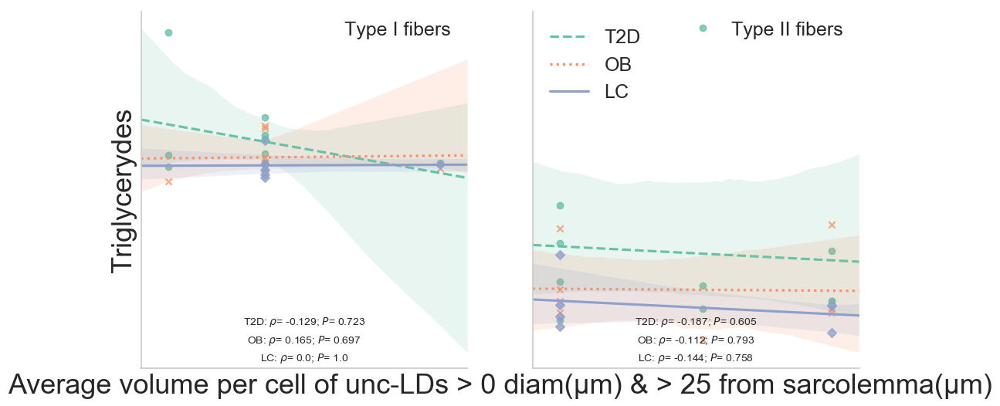

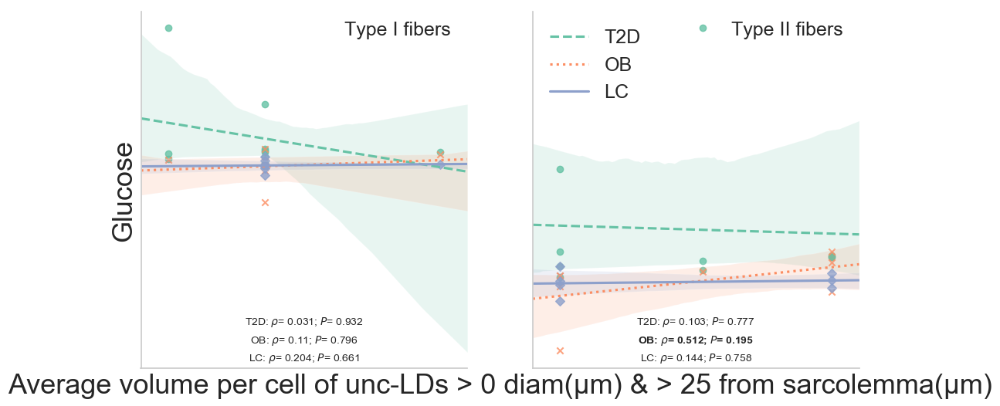

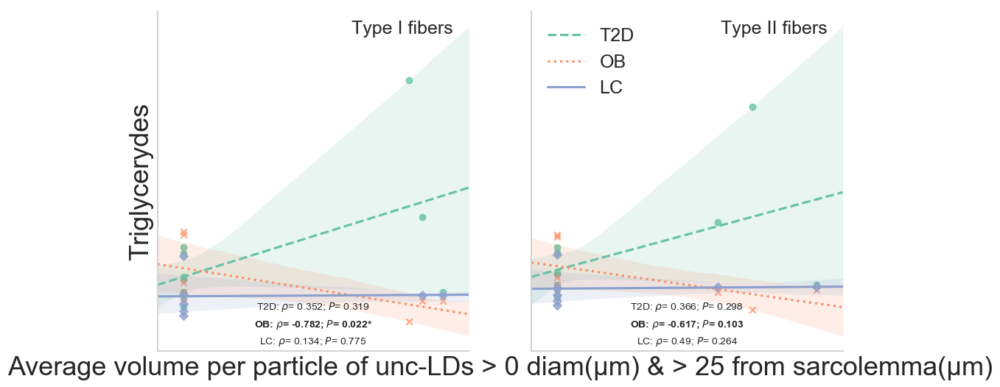

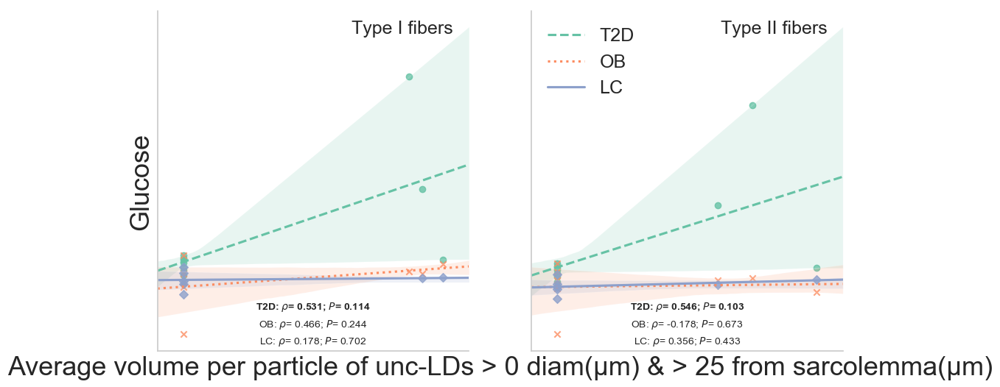

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import spearmanr

plt.style.use('default')
sns.set()
sns.set_style("whitegrid", {'axes.grid' : False})
sns.set_palette('Set2')

#for testing
particles = ['FREE']   
vars_1 = ['diameter (μm)']
vars_2 = ['Glycemia']

#The real thing. Variables to iterate through
particles = ['COLOC', 'FREE']
p_labels = ['col-LDs', 'unc-LDs']

trim = ['special_s0_d12_', 'special_s0.5_d12_', 'special_s0.75_d10_', 'special_s0_d15_', 'special_s0.5_d15_',
        'special_s0.8_d20_', 'special_s0.5_d20_', 'special_s0_d20_', 'special_s0_d25_']
t_lbls = [(0, 12), (0.5, 12), (0.75, 10), (0, 15), (0.5, 15), (0.8, 20), (0.5, 20), (0, 20), (0, 25)]

#trim = ['special_s0.3_d0_', 'special_s0.5_d0_', 'special_s0.75_d0_', 'special_s0.8_d0_']
#t_lbls = [(0.3, 0), (0.5, 0), (0.75, 0), (0.8, 0)]

vars_1 =['totvol', 'avg_vol_per_cell', 'avg_vol_per_part']
v1_labels = ['Total volume', 'Average volume per cell', 'Average volume per particle']
#vars_1 =['dist']
#v1_labels = ['Average distance from sarcolemma']

vars_2 = ['TAGemia', 'Glycemia']
v2_labels = ['Triglycerydes', 'Glucose']




cells = ['I', 'II']
gp_ord = ['Diabetic', 'Obese', 'Controls']
grp_lbls = ['T2D', 'OB', 'LC']

for t, tr in enumerate(trim):
    for l, p in enumerate(particles):
        for i, v1 in enumerate(vars_1):
            ready['{}{} {}'.format(tr, p, v1)] = ready['{}{} {}'.format(tr, p, v1)].astype('float')
            for j, v2 in enumerate (vars_2):
                var_pair = [('{}{} {}'.format(tr, p, v1), v2)]
                for vp in var_pair:
                    #print(vp[0], vp[1])
                    fig = plt.figure(figsize=(12,6))
                    plt.xlabel('{} of {} > {} diam(μm) & > {} from sarcolemma(μm)'.format(v1_labels[i], p_labels[l], t_lbls[t][0], t_lbls[t][1]), fontsize = 26)
                    plt.ylabel(v2_labels[j], fontsize = 26)
                    plt.xticks([])
                    plt.yticks([])
                    axes = plt.gca()
                    axes.spines['right'].set_visible(False)
                    axes.spines['left'].set_visible(False)
                    axes.spines['bottom'].set_visible(False)
                    axes.spines['top'].set_visible(False)



                    for k, c in enumerate(cells):
                        data = ready[ready['cell type'] == c]


                        ax = fig.add_subplot(1, 2, k+1)



                        #In this 6 lines we are just trying to prepare the figure in order for no line being truncated
                        #by determining the min and max values to be plotted
                        ctr = data['{}{} {}'.format(tr,p,v1)][data['group'] == 'Controls']
                        t2d = data['{}{} {}'.format(tr,p,v1)][data['group'] == 'Diabetic']
                        obe = data['{}{} {}'.format(tr,p,v1)][data['group'] == 'Obese']
                        all_values_to_plot = pd.concat([ctr, t2d, obe])                
                        min_val = np.min(all_values_to_plot)
                        max_val = np.max(all_values_to_plot)
                        safe_marg = (max_val-min_val)*0.1


                        for d, m, ls in zip(data['group'].unique(), ["o", "x", "D"], ["--", ":", "-"]):
                            #ax.set(ylim=(-10, 60))
                            ax.set(xlim=(min_val-safe_marg, max_val+safe_marg))
                            g=sns.regplot(x=vp[0], y=vp[1], 
                                        data=data.loc[data.group == d], 
                                        marker=m, line_kws={"ls":ls}, 
                                        label=d, scatter=True, truncate=False,
                                        ax=ax, ci=95)

                        ax.set_yticks([])
                        ax.set_xticks([])

                        handles, labels = ax.get_legend_handles_labels()
                        ax.spines['right'].set_visible(False)
                        ax.spines['top'].set_visible(False)
                        ax.set_ylabel('', fontsize = 22)
                        ax.set_xlabel('' ,fontsize = 22)
                        ax.tick_params(labelsize=26)
                        ax.set_aspect('auto')
                        ax.text(0.95, 0.95, 'Type {} fibers'.format(c), horizontalalignment='right', 
                                 verticalalignment='center', transform=ax.transAxes, fontsize=18)
                        #plt.title('Type {} fibers'.format(c), loc='upper right')


                        #calculate Spearman Rank correlation and corresponding p-value
                        f = 0.0
                        for g, gp in enumerate(gp_ord):
                            x = data[vp[0]][data['group'] == gp]
                            y = data[vp[1]][data['group'] == gp]
                            rho, pv = spearmanr(x , y)

                            cor, sign = 'light',''
                            if abs(rho) >= 0.5: cor = 'bold'
                            if pv <= 0.05: sign = '*'
                            if pv <= 0.01: sign = '**'

                            ax.text(0.5, 0.13+f, r'{}: $\rho$= {}; $\it{{P}}$= {}{}'.format(grp_lbls[g], 
                                        round(rho, 3), round(pv, 3), sign), horizontalalignment='center', 
                                        verticalalignment='center', transform=ax.transAxes, fontsize=10, weight=cor)
                            f -= 0.05

                    plt.legend(grp_lbls, fontsize=18, frameon=False, loc='upper left')
                    #plt.legend(fontsize=18, frameon=False, loc='best')
                    #plt.tight_layout(2)




                    directory = r'D:\VASCO\Diabetic_study_for_TOPOCELL\Figures_data presentation\python\spearman\trimmed'
                    plt.savefig(r'{}\new_SearCorr_{}_{}_{}.png'.format(directory, p, tr, v2), dpi=300)
                    plt.savefig(r'{}\new_SearCorr_{}_{}_{}.pdf'.format(directory, p, tr, v2), dpi=300)
                    #fig.savefig('{}\COMB_{}.pgf'.format(directory, v))


              
                
                

In [90]:
c_parts = particle_table[(particle_table['CNum'] == cl)
                    & (particle_table['PSize']> 0) 
                    & (particle_table['PDist']> Pdist)
                    & (particle_table['CType'] == 1)
                    & (particle_table['PType'] == p)
                    & (particle_table['subject'] == sub)]

c_parts['PSize']

105942    0.271750
105945    0.192156
105955    0.192156
105963    0.192156
Name: PSize, dtype: float64